#Bibliotecas

In [2]:
conda install pytorch torchvision torchaudio cpuonly -c pytorch


Jupyter detected...
3 channel Terms of Service accepted
Retrieving notices: done
Channels:
 - pytorch
 - defaults
Platform: win-64
Solving environment: failed

Note: you may need to restart the kernel to use updated packages.



LibMambaUnsatisfiableError: Encountered problems while solving:
  - nothing provides cuda-cudart >=11.7,<11.8 needed by pytorch-cuda-11.7-h16d0643_3

Could not solve for environment specs
The following packages are incompatible
\u251c\u2500 pin on python =3.13 * is installable and it requires
\u2502  \u2514\u2500 python =3.13 *, which can be installed;
\u2514\u2500 torchvision =* * is not installable because there are no viable options
   \u251c\u2500 torchvision [0.10.0|0.10.1|...|0.9.1] would require
   \u2502  \u2514\u2500 python >=3.6,<3.7.0a0 *, which conflicts with any installable versions previously reported;
   \u251c\u2500 torchvision [0.10.0|0.10.1|0.9.0|0.9.1] would require
   \u2502  \u2514\u2500 cudatoolkit >=11.1,<11.2 *, which does not exist (perhaps a missing channel);
   \u251c\u2500 torchvision [0.10.0|0.10.1|...|0.9.1] would require
   \u2502  \u2514\u2500 python >=3.7,<3.8.0a0 *, which conflicts with any installable versions previously reported;
   \u251c\u2500 tor

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from collections import defaultdict
import os
import random # Ensure random is imported for seed setting

# --- Set Random Seeds for Reproducibility ---
RANDOM_SEED = 42
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
# If you use CUDA, you might also want to set:
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
# -------------------------------------------

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)


ModuleNotFoundError: No module named 'torch'

In [ ]:
import random
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

In [ ]:
import matplotlib.ticker as mtick

#Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#Read and process the database
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output_final/"
input_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/"

# Ensure the output directory exists before saving
os.makedirs(output_path, exist_ok=True)

Mounted at /content/drive


In [ ]:
data_assistments = pd.read_csv(input_path + "skill_builder_data.csv", encoding='latin1')
data_assistments.head()

/tmp/ipython-input-1949213948.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  data_assistments = pd.read_csv(input_path + "skill_builder_data.csv", encoding='latin1')


,order_id,assignment_id,user_id,assistment_id,problem_id,original,correct,attempt_count,ms_first_response,tutor_mode,...,hint_count,hint_total,overlap_time,template_id,answer_id,answer_text,first_action,bottom_hint,opportunity,opportunity_original
0,33022537,277618,64525,33139,51424,1,1,1,32454,tutor,...,0,3,32454,30799,NaN,26,0,NaN,1,1.0
1,33022709,277618,64525,33150,51435,1,1,1,4922,tutor,...,0,3,4922,30799,NaN,55,0,NaN,2,2.0
2,35450204,220674,70363,33159,51444,1,0,2,25390,tutor,...,0,3,42000,30799,NaN,88,0,NaN,1,1.0
3,35450295,220674,70363,33110,51395,1,1,1,4859,tutor,...,0,3,4859,30059,NaN,41,0,NaN,2,2.0
4,35450311,220674,70363,33196,51481,1,0,14,19813,tutor,...,3,4,124564,30060,NaN,65,0,0.0,3,3.0


In [ ]:
data_assistments

,order_id,assignment_id,user_id,assistment_id,problem_id,original,correct,attempt_count,ms_first_response,tutor_mode,...,hint_count,hint_total,overlap_time,template_id,answer_id,answer_text,first_action,bottom_hint,opportunity,opportunity_original
0,33022537,277618,64525,33139,51424,1,1,1,32454,tutor,...,0,3,32454,30799,NaN,26,0,NaN,1,1.0
1,33022709,277618,64525,33150,51435,1,1,1,4922,tutor,...,0,3,4922,30799,NaN,55,0,NaN,2,2.0
2,35450204,220674,70363,33159,51444,1,0,2,25390,tutor,...,0,3,42000,30799,NaN,88,0,NaN,1,1.0
3,35450295,220674,70363,33110,51395,1,1,1,4859,tutor,...,0,3,4859,30059,NaN,41,0,NaN,2,2.0
4,35450311,220674,70363,33196,51481,1,0,14,19813,tutor,...,3,4,124564,30060,NaN,65,0,0.0,3,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525529,38214014,291495,96299,57830,108976,0,1,1,38234,tutor,...,0,2,38234,55692,200260.0,NaN,0,NaN,54,NaN
525530,38214016,291495,96299,57843,109015,0,1,1,6500,tutor,...,0,0,6500,55693,200299.0,NaN,0,NaN,55,NaN
525531,38214195,291503,96299,34577,54060,0,1,1,18344,tutor,...,0,3,18344,30677,NaN,0.8,0,NaN,56,NaN
525532,38214196,291503,96299,34577,54061,0,1,1,12922,tutor,...,0,2,12922,30677,NaN,-6,0,NaN,57,NaN


In [ ]:
print(data_assistments.columns.tolist())

['order_id', 'assignment_id', 'user_id', 'assistment_id', 'problem_id', 'original', 'correct', 'attempt_count', 'ms_first_response', 'tutor_mode', 'answer_type', 'sequence_id', 'student_class_id', 'position', 'type', 'base_sequence_id', 'skill_id', 'skill_name', 'teacher_id', 'school_id', 'hint_count', 'hint_total', 'overlap_time', 'template_id', 'answer_id', 'answer_text', 'first_action', 'bottom_hint', 'opportunity', 'opportunity_original']


In [ ]:
num_distinct_users = data_assistments['user_id'].nunique()
print(f"Número de alunos distintos no dataset original: {num_distinct_users}")

Número de alunos distintos no dataset original: 4217


In [ ]:
# Contagem de skills únicas ignorando nulos
print(data_assistments['skill_id'].nunique())

# Contagem de skills únicas incluindo nulos (NaN) como uma categoria
print(data_assistments['skill_id'].nunique(dropna=False))

123
124


In [ ]:
num_distinct_skills = data_assistments['skill_id'].nunique()
print(f"Número de skills distintas no dataset original: {num_distinct_skills}")

Número de skills distintas no dataset original: 123


In [ ]:
data_assistments.shape

(525534, 30)

In [ ]:
df=data_assistments.copy()

In [ ]:
print('Null values in "correct" column:', data_assistments['correct'].isnull().sum())
print('Null values in "skill_id" column:', data_assistments['skill_id'].isnull().sum())
print('Null values in "user_id" column:', data_assistments['user_id'].isnull().sum())
print('Null values in "order_id" column:', data_assistments['order_id'].isnull().sum())

Null values in "correct" column: 0
Null values in "skill_id" column: 66326
Null values in "user_id" column: 0
Null values in "order_id" column: 0


In [ ]:
# 1) Remover linhas com skill_id ou correct nulos
df_limpo = df.dropna(subset=['skill_id', 'correct'])

# 2) Manter apenas uma linha por (order_id, user_id)
df_final = df_limpo.drop_duplicates(
    subset=['order_id', 'user_id'],
    keep='first'   # pode trocar por 'last'
).reset_index(drop=True)

In [ ]:
df.shape[0]-df_limpo.shape[0] #linhas com skill_id nulo

66326

In [ ]:
#66.326 amostras removidas por não conter skill_id, poderiam gerar ruído
#Se tratássemos o "nulo" como uma habilidade única (a 124ª skill),
#estaríamos dizendo ao modelo que resolver um problema de frações sem
#rótulo é a mesma coisa que resolver um problema de geometria sem rótulo.
#Isso confunde a matriz de transição do modelo.

In [ ]:
df_limpo.shape[0]-df_final.shape[0] #linhas multiskill removidas (deixando)

176103

In [ ]:
df_final

,order_id,assignment_id,user_id,assistment_id,problem_id,original,correct,attempt_count,ms_first_response,tutor_mode,...,hint_count,hint_total,overlap_time,template_id,answer_id,answer_text,first_action,bottom_hint,opportunity,opportunity_original
0,33022537,277618,64525,33139,51424,1,1,1,32454,tutor,...,0,3,32454,30799,NaN,26,0,NaN,1,1.0
1,33022709,277618,64525,33150,51435,1,1,1,4922,tutor,...,0,3,4922,30799,NaN,55,0,NaN,2,2.0
2,35450204,220674,70363,33159,51444,1,0,2,25390,tutor,...,0,3,42000,30799,NaN,88,0,NaN,1,1.0
3,35450295,220674,70363,33110,51395,1,1,1,4859,tutor,...,0,3,4859,30059,NaN,41,0,NaN,2,2.0
4,35450311,220674,70363,33196,51481,1,0,14,19813,tutor,...,3,4,124564,30060,NaN,65,0,0.0,3,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283100,33150408,277900,85730,69042,128442,1,0,2,51016,tutor,...,0,4,102125,59998,NaN,3-Jul,0,NaN,13,13.0
283101,33150487,277900,85730,69056,128456,1,1,1,61547,tutor,...,0,4,61547,59998,NaN,2-May,0,NaN,14,14.0
283102,33150779,277900,85730,69046,128446,1,1,1,53890,tutor,...,0,4,53890,59998,NaN,10/-6,0,NaN,15,15.0
283103,33151098,277901,85730,69057,128457,1,0,4,181532,tutor,...,3,3,196844,60008,NaN,57/9,0,1.0,16,16.0


## Tratando o dataset

In [ ]:
# 1) Remover linhas com skill_id ou correct nulos
df_limpo = df.dropna(subset=['skill_id', 'correct'])

# 2) Manter apenas uma linha por (order_id, user_id)
df_final = df_limpo.drop_duplicates(
    subset=['order_id', 'user_id'],
    keep='first'   # pode trocar por 'last'
).reset_index(drop=True)

In [ ]:
df_final

,order_id,assignment_id,user_id,assistment_id,problem_id,original,correct,attempt_count,ms_first_response,tutor_mode,...,hint_count,hint_total,overlap_time,template_id,answer_id,answer_text,first_action,bottom_hint,opportunity,opportunity_original
0,33022537,277618,64525,33139,51424,1,1,1,32454,tutor,...,0,3,32454,30799,NaN,26,0,NaN,1,1.0
1,33022709,277618,64525,33150,51435,1,1,1,4922,tutor,...,0,3,4922,30799,NaN,55,0,NaN,2,2.0
2,35450204,220674,70363,33159,51444,1,0,2,25390,tutor,...,0,3,42000,30799,NaN,88,0,NaN,1,1.0
3,35450295,220674,70363,33110,51395,1,1,1,4859,tutor,...,0,3,4859,30059,NaN,41,0,NaN,2,2.0
4,35450311,220674,70363,33196,51481,1,0,14,19813,tutor,...,3,4,124564,30060,NaN,65,0,0.0,3,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283100,33150408,277900,85730,69042,128442,1,0,2,51016,tutor,...,0,4,102125,59998,NaN,3-Jul,0,NaN,13,13.0
283101,33150487,277900,85730,69056,128456,1,1,1,61547,tutor,...,0,4,61547,59998,NaN,2-May,0,NaN,14,14.0
283102,33150779,277900,85730,69046,128446,1,1,1,53890,tutor,...,0,4,53890,59998,NaN,10/-6,0,NaN,15,15.0
283103,33151098,277901,85730,69057,128457,1,0,4,181532,tutor,...,3,3,196844,60008,NaN,57/9,0,1.0,16,16.0


In [ ]:
# Carregar o dataset
df = df_final[
    ["order_id", "user_id", "skill_id", "correct"]
]

In [ ]:
df.shape

(283105, 4)

In [ ]:
df["skill_id"] = df["skill_id"].astype(int)
df["correct"] = df["correct"].astype(int)

/tmp/ipython-input-2008656740.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["skill_id"] = df["skill_id"].astype(int)
/tmp/ipython-input-2008656740.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["correct"] = df["correct"].astype(int)


##Ordenando temporalmente

In [ ]:
df = df.sort_values(by=["user_id", "order_id"])

In [ ]:
num_distinct_users_df = df['user_id'].nunique()
print(f"Número de alunos distintos no df (após a limpeza de skills): {num_distinct_users_df}")

Número de alunos distintos no df (após a limpeza de skills): 4163


##Analisando skill_id

In [ ]:
skill_map = {
    s: i for i, s in enumerate(df["skill_id"].unique())
}

df["skill_idx"] = df["skill_id"].map(skill_map)
M = len(skill_map)
print(M)

112


##Sequências por aluno

In [ ]:
student_sequences_raw = defaultdict(list)

for _, row in df.iterrows():
    student_sequences_raw[row["user_id"]].append(
        (row["skill_idx"], int(row["correct"]))
    )

# Now, store as a list of (user_id, sequence) tuples
# This allows us to keep track of the user_id for each sequence
student_sequences_with_ids = [(uid, seq) for uid, seq in student_sequences_raw.items()]

'''
Esperado agora:
[
  (user_id_1, [(q1, a1), (q2, a2), ...]),   # aluno 1
  (user_id_2, [(q1, a1), (q2, a2), ...]),   # aluno 2
  ...
]
'''

'\nEsperado agora:\n[\n  (user_id_1, [(q1, a1), (q2, a2), ...]),   # aluno 1\n  (user_id_2, [(q1, a1), (q2, a2), ...]),   # aluno 2\n  ...\n]\n'

In [ ]:
print(f"Alunos: {len(student_sequences_raw)} | Habilidades: {M}")

Alunos: 4163 | Habilidades: 112


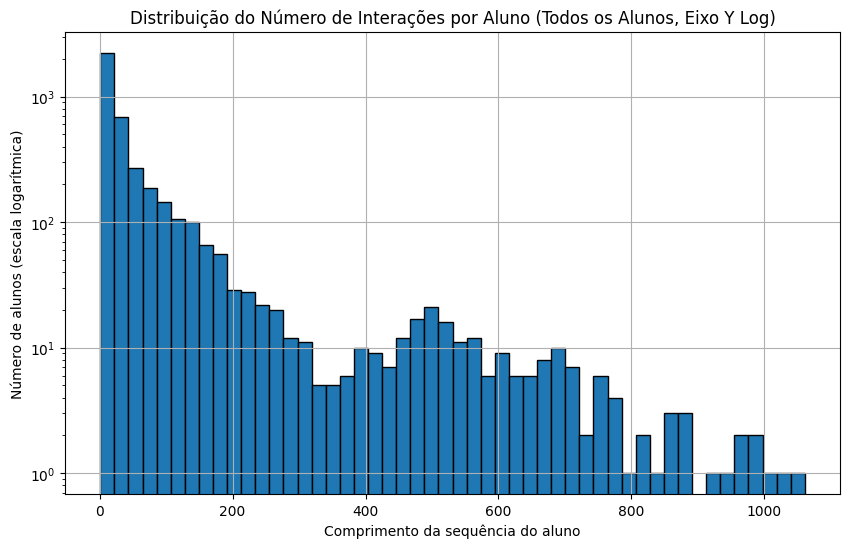

Total de alunos no dataset (antes de qualquer filtro por comprimento): 4163
Comprimento máximo da sequência: 1061
Comprimento mínimo da sequência: 1
Comprimento médio da sequência: 68.01
Comprimento mediano da sequência: 20.0


In [ ]:
seq_lengths_all_students = [len(seq_data) for uid, seq_data in student_sequences_raw.items()]

plt.figure(figsize=(10, 6))
plt.hist(seq_lengths_all_students, bins=50, log=True, edgecolor='black')
plt.xlabel("Comprimento da sequência do aluno")
plt.ylabel("Número de alunos (escala logarítmica)")
plt.title("Distribuição do Número de Interações por Aluno (Todos os Alunos, Eixo Y Log)")
plt.grid(True)
plt.show()

print(f"Total de alunos no dataset (antes de qualquer filtro por comprimento): {len(seq_lengths_all_students)}")
print(f"Comprimento máximo da sequência: {max(seq_lengths_all_students)}")
print(f"Comprimento mínimo da sequência: {min(seq_lengths_all_students)}")
print(f"Comprimento médio da sequência: {np.mean(seq_lengths_all_students):.2f}")
print(f"Comprimento mediano da sequência: {np.median(seq_lengths_all_students)}")

In [ ]:
# Convert to a Series for easier counting and cumulative calculations
seq_lengths_series = pd.Series(seq_lengths_all_students)

# Calculate counts for each length
length_counts = seq_lengths_series.value_counts().sort_index()

# Filter for lengths from 1 to 10
short_length_counts = length_counts[length_counts.index <= 10]

# Create a DataFrame for the summary
summary_df = pd.DataFrame({
    'Number of Interactions': short_length_counts.index,
    'Number of Students': short_length_counts.values
})

# Calculate cumulative sum and cumulative percentage
summary_df['Cumulative Students'] = summary_df['Number of Students'].cumsum()
summary_df['Cumulative Percentage'] = (summary_df['Cumulative Students'] / len(seq_lengths_all_students)) * 100

print("Detailed breakdown of students by interaction count (1 to 10):")
display(summary_df.round(2))

print("\n--- Analysis for potential thresholds ---")

# For threshold 3
students_below_3 = summary_df[summary_df['Number of Interactions'] < 3]['Number of Students'].sum()
percentage_below_3 = (students_below_3 / len(seq_lengths_all_students)) * 100
print(f"Students with less than 3 interactions: {students_below_3} ({percentage_below_3:.2f}% of total)")

# For threshold 5
students_below_5 = summary_df[summary_df['Number of Interactions'] < 5]['Number of Students'].sum()
percentage_below_5 = (students_below_5 / len(seq_lengths_all_students)) * 100
print(f"Students with less than 5 interactions: {students_below_5} ({percentage_below_5:.2f}% of total)")

print(f"\nTotal students: {len(seq_lengths_all_students)}")


Detailed breakdown of students by interaction count (1 to 10):


,Number of Interactions,Number of Students,Cumulative Students,Cumulative Percentage
0,1,136,136,3.27
1,2,175,311,7.47
2,3,103,414,9.94
3,4,105,519,12.47
4,5,166,685,16.45
5,6,127,812,19.51
6,7,123,935,22.46
7,8,137,1072,25.75
8,9,89,1161,27.89
9,10,159,1320,31.71



--- Analysis for potential thresholds ---
Students with less than 3 interactions: 311 (7.47% of total)
Students with less than 5 interactions: 519 (12.47% of total)

Total students: 4163


In [ ]:
#Removendo estudantes com poucas interacoes
# Filter sequences, keeping the (user_id, sequence) tuple structure
student_sequences_filtered = [
    (uid, seq) for uid, seq in student_sequences_with_ids if len(seq) >= 5
]
len(student_sequences_filtered)

3644

In [ ]:
# Assign the filtered list back to the original variable name for downstream compatibility
student_sequences = student_sequences_filtered

#Análise Exploratória

##Distribuição global de respostas (0 vs 1)

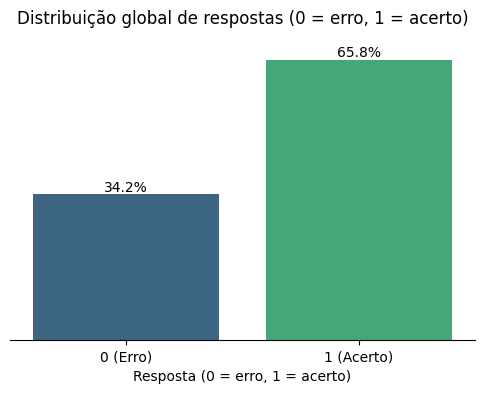

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick # Importar para formatação percentual
import os

# Calculate proportions
proportions = df["correct"].value_counts(normalize=True).reset_index()
proportions.columns = ['correct', 'proportion']

# Create a seaborn bar plot
plt.figure(figsize=(6,4))
ax = sns.barplot(x='correct', y='proportion', hue='correct', data=proportions, palette='viridis', legend=False)
plt.title("Distribuição global de respostas (0 = erro, 1 = acerto)")
plt.xlabel("Resposta (0 = erro, 1 = acerto)")

# Remover o eixo Y e seu rótulo
ax.yaxis.set_visible(False)
plt.ylabel("") # Remover o label do eixo Y

# Ajustar o limite do eixo Y para que não haja espaço vazio excessivo
max_proportion = proportions['proportion'].max()
plt.ylim(0, max_proportion * 1.1) # 10% a mais que a proporção máxima para o texto

# Remover as bordas do gráfico
sns.despine(left=True, bottom=False, right=True, top=True) # Manter apenas a de baixo para os rótulos X

# Adicionar rótulos nas barras
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height())
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom') # Colocar o texto acima da barra

plt.xticks(ticks=[0, 1], labels=['0 (Erro)', '1 (Acerto)']) # Optional: make labels more descriptive

#plt.savefig(os.path.join(output_path, "balanceamentodasrespostas_seaborn_labeled_no_y.png"))
plt.show()

##Proporção de acertos por skill

In [ ]:
skill_stats = (
    df.groupby("skill_idx")["correct"]
      .agg(["mean", "count"])
      .rename(columns={"mean": "acc_rate", "count": "n"})
)

skill_stats.head()

,acc_rate,n
skill_idx,,
0,0.523196,6208
1,0.510682,1451
2,0.687243,729
3,0.738806,6834
4,0.780391,7058


##Histograma da taxa de acerto por skill

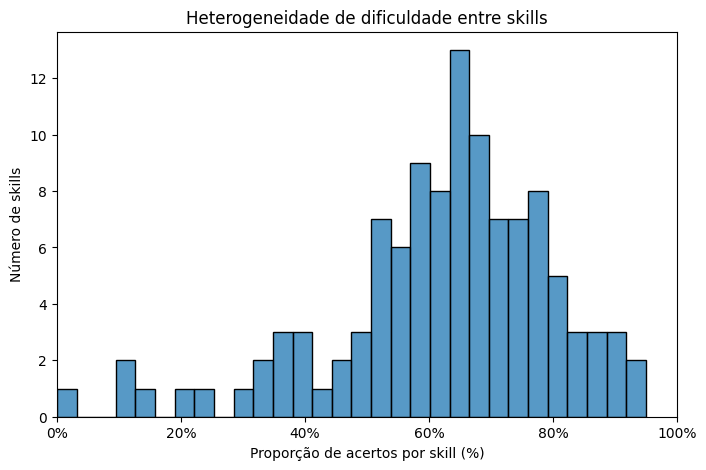

In [ ]:
# Histogram da taxa de acerto por skill com Seaborn e eixo X em porcentagem
plt.figure(figsize=(8, 5))
sns.histplot(skill_stats["acc_rate"], bins=30, kde=False, stat="count") # Use stat="count" for count on y-axis and kde=False
plt.xlabel("Proporção de acertos por skill (%)")
plt.ylabel("Número de skills")
plt.title("Heterogeneidade de dificuldade entre skills")

# Formatar o eixo X para exibir porcentagens
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
plt.xlim(0, 1) # Ensure x-axis ranges from 0 to 1 (for percentages)

# Forçar o eixo Y a ter apenas ticks inteiros, já que representa contagens de skills
plt.gca().yaxis.set_major_locator(mtick.MaxNLocator(integer=True))

#plt.savefig(os.path.join(output_path, "histogramaacertoporskill_percentage_no_kde_integer_y.png"))
plt.show()

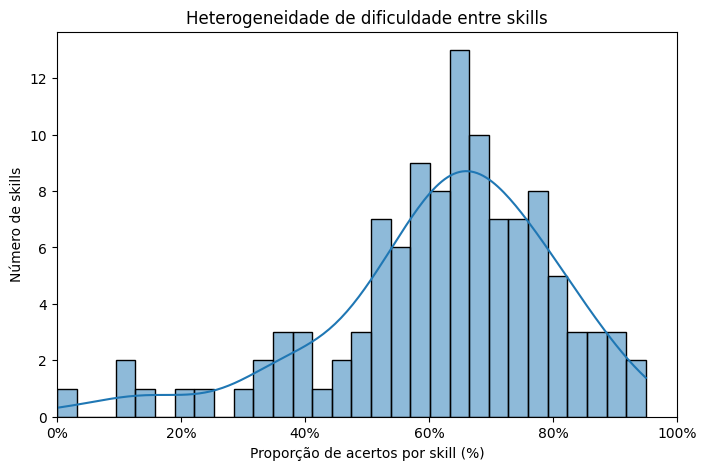

In [ ]:


# Histogram da taxa de acerto por skill com Seaborn e eixo X em porcentagem
plt.figure(figsize=(8, 5))
sns.histplot(skill_stats["acc_rate"], bins=30, kde=True, stat="count") # Use stat="count" for count on y-axis
plt.xlabel("Proporção de acertos por skill (%)")
plt.ylabel("Número de skills")
plt.title("Heterogeneidade de dificuldade entre skills")

# Formatar o eixo X para exibir porcentagens
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
plt.xlim(0, 1) # Ensure x-axis ranges from 0 to 1 (for percentages)

#plt.savefig(os.path.join(output_path, "histogramaacertoporskill_percentage_kde.png"))
plt.show()

##Frequência por skill

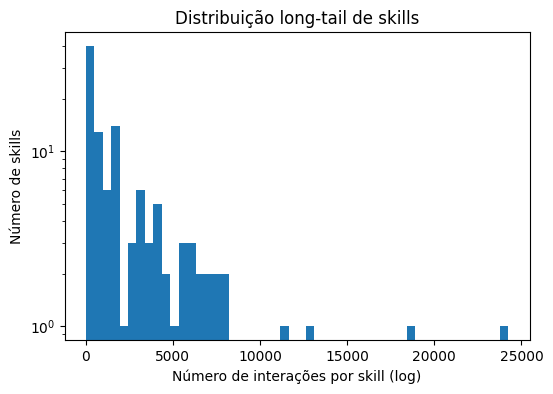

In [ ]:
plt.figure(figsize=(6,4))
plt.hist(skill_stats["n"], bins=50, log=True)
plt.xlabel("Número de interações por skill (log)")
plt.ylabel("Número de skills")
plt.title("Distribuição long-tail de skills")
#plt.savefig(os.path.join(output_path, "frequenciaporskill.png"))
plt.show()

##Comprimento das sequências dos alunos

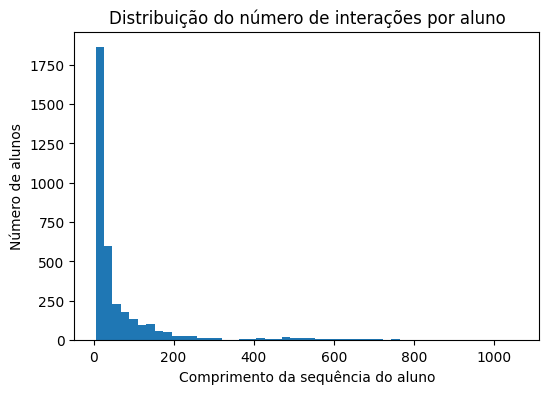

In [ ]:
seq_lengths = [len(seq_data) for uid, seq_data in student_sequences]

plt.figure(figsize=(6,4))
plt.hist(seq_lengths, bins=50)
plt.xlabel("Comprimento da sequência do aluno")
plt.ylabel("Número de alunos")
plt.title("Distribuição do número de interações por aluno")

# Save the plot to the output path
#plt.savefig(os.path.join(output_path, "sequence_length_histogram.png"))

plt.show()

Maximum sequence length: 1061


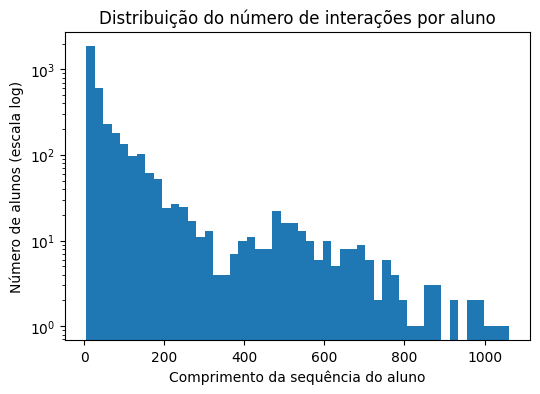

In [ ]:
seq_lengths = [len(seq_data) for uid, seq_data in student_sequences]

print(f"Maximum sequence length: {max(seq_lengths)}")

plt.figure(figsize=(6,4))
plt.hist(seq_lengths, bins=50)
plt.xlabel("Comprimento da sequência do aluno")
plt.ylabel("Número de alunos (escala log)") # Added log scale to label
plt.title("Distribuição do número de interações por aluno")
plt.yscale("log") # Added logarithmic scale to y-axis

# Save the plot to the output path
#plt.savefig(os.path.join(output_path, "sequence_length_histogram_log_scale.png"))

plt.show()

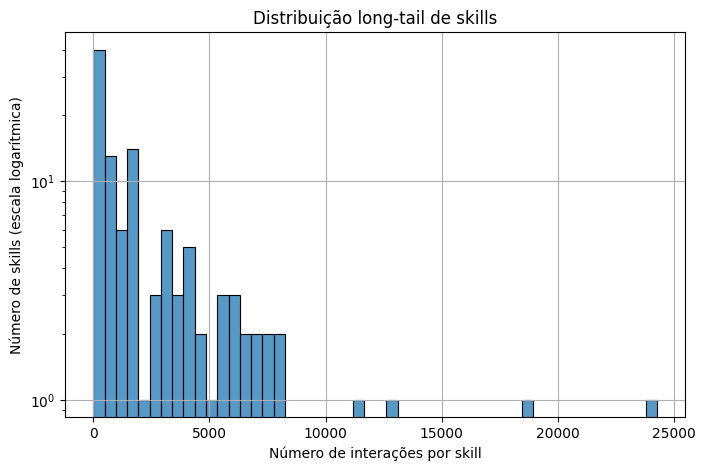

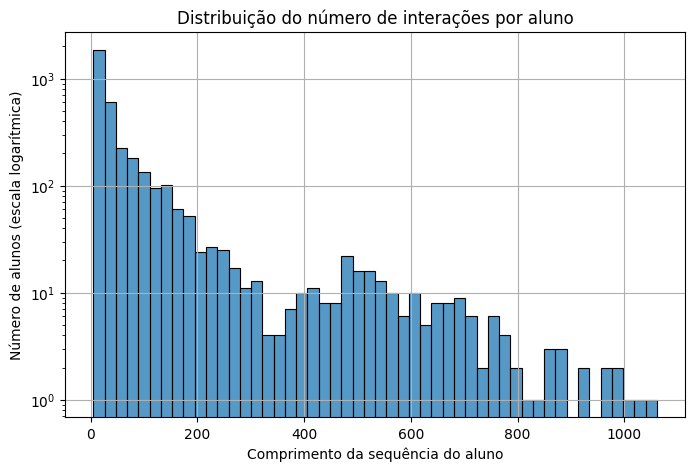

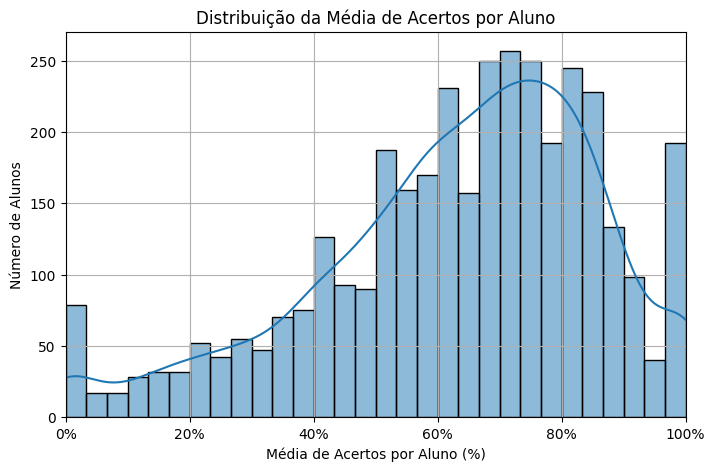

In [ ]:
# --- 1. Distribuição long-tail de skills (Seaborn) ---
plt.figure(figsize=(8, 5))
# FIX: X linear e Y logarítmico para melhor visualização da long-tail
sns.histplot(skill_stats["n"], bins=50, kde=False) # X é linear por padrão
plt.xlabel("Número de interações por skill")
plt.ylabel("Número de skills (escala logarítmica)") # Ajustar label do Y
plt.title("Distribuição long-tail de skills")
plt.yscale("log") # Definir escala Y como logarítmica
plt.grid(True)
#plt.savefig(os.path.join(output_path, "frequenciaporskill_seaborn.png"))
plt.show()

# --- 2. Distribuição do número de interações por aluno (Seaborn) ---
# Ensure seq_lengths is available from previous cells (e.g., cell Zs13IWaDDh2f)
# seq_lengths = [len(seq_data) for uid, seq_data in student_sequences]
plt.figure(figsize=(8, 5))
sns.histplot(seq_lengths, bins=50, kde=False)
plt.xlabel("Comprimento da sequência do aluno")
plt.ylabel("Número de alunos (escala logarítmica)")
plt.title("Distribuição do número de interações por aluno")
plt.yscale("log")
plt.grid(True)
#plt.savefig(os.path.join(output_path, "sequence_length_histogram_seaborn_log_y.png"))
plt.show()

# --- 3. Distribuição da média de acertos por aluno (Seaborn, eixo X em percentual) ---
# Calculate average correctness for each student (moved from cell iSiu42QPDumZ)
average_correctness_per_student = []
for uid, seq in student_sequences:
    if len(seq) > 0:
        correctness_scores = [answer for skill_idx, answer in seq]
        avg_correctness = np.mean(correctness_scores)
        average_correctness_per_student.append(avg_correctness)

plt.figure(figsize=(8, 5))
sns.histplot(np.array(average_correctness_per_student), bins=30, kde=True, stat="count")
plt.xlabel("Média de Acertos por Aluno (%)")
plt.ylabel("Número de Alunos")
plt.title("Distribuição da Média de Acertos por Aluno")

# Formatar o eixo X para exibir porcentagens
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
plt.xlim(0, 1) # Ensure x-axis ranges from 0 to 1 for percentages
plt.grid(True)
#plt.savefig(os.path.join(output_path, "avg_correctness_per_student_hist_percentage.png"))
plt.show()


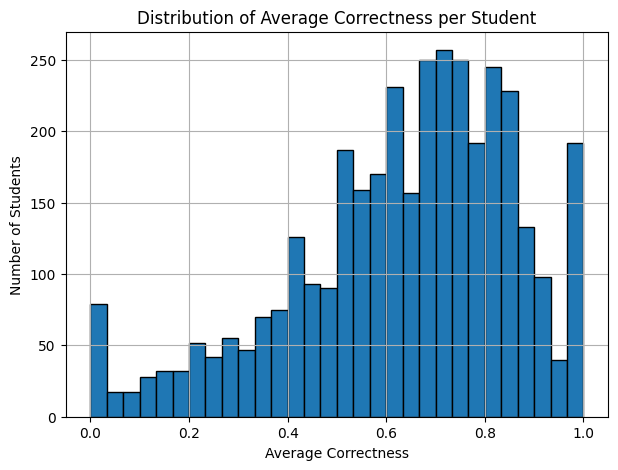

In [ ]:
# Calculate average correctness for each student
# student_sequences is a list of (user_id, [(q1,a1), (q2,a2), ...])
average_correctness_per_student = []
for uid, seq in student_sequences:
    if len(seq) > 0:
        correctness_scores = [answer for skill_idx, answer in seq]
        avg_correctness = np.mean(correctness_scores)
        average_correctness_per_student.append(avg_correctness)

plt.figure(figsize=(7, 5))
plt.hist(average_correctness_per_student, bins=30, edgecolor='black')
plt.xlabel("Average Correctness")
plt.ylabel("Number of Students")
plt.title("Distribution of Average Correctness per Student")
plt.grid(True)

# Save the plot
#plt.savefig(os.path.join(output_path, "avg_correctness_per_student_hist.png"))

plt.show()

In [ ]:
"""
What this plot reveals:

Heterogeneity of Performance: You can see the spread of student abilities or engagement levels. For example, is there a large group of students who consistently perform very well (a peak near 1.0)? Are there many who struggle (a peak near 0.0 or a broader distribution across lower values)?
Typical Performance: The peak(s) of the histogram indicate the most common average correctness rates among your student population.
Analogies to Economic Time Series:
Individual 'Agents' Heterogeneity: Just as each student is an 'agent' with their own performance history, in economic data, you often deal with many individual economic agents (e.g., companies, households, countries) each having their own time series (e.g., revenue, spending, GDP growth). This plot shows the distribution of a key characteristic (average correctness) across your student agents.
Characterizing Time Series: Understanding this distribution helps characterize the 'type' of time series you're modeling. A dataset with many high-performing students is different from one with many low-performing ones. Similarly, an economy might have many high-growth companies or many struggling ones.
Outliers/Extremes: Does the distribution have long tails, indicating a few students are extremely good or extremely poor? This can be analogous to outlier events or agents in economic data.
This histogram provides a valuable high-level view of the characteristics of your individual learning sequences, which is a good parallel to how you might analyze individual economic time series before modeling their collective behavior.
"""

"\nWhat this plot reveals:\n\nHeterogeneity of Performance: You can see the spread of student abilities or engagement levels. For example, is there a large group of students who consistently perform very well (a peak near 1.0)? Are there many who struggle (a peak near 0.0 or a broader distribution across lower values)?\nTypical Performance: The peak(s) of the histogram indicate the most common average correctness rates among your student population.\nAnalogies to Economic Time Series:\nIndividual 'Agents' Heterogeneity: Just as each student is an 'agent' with their own performance history, in economic data, you often deal with many individual economic agents (e.g., companies, households, countries) each having their own time series (e.g., revenue, spending, GDP growth). This plot shows the distribution of a key characteristic (average correctness) across your student agents.\nCharacterizing Time Series: Understanding this distribution helps characterize the 'type' of time series you're

#Divisão treino/teste

In [ ]:
train_seqs, temp_seqs = train_test_split(
    student_sequences, test_size=0.3, random_state=42
)

#Para validação
val_seqs, test_seqs = train_test_split(
    temp_seqs, test_size=0.5, random_state=42
)

In [ ]:
class DKTDataset(Dataset):
    def __init__(self, sequences, num_exercises):
        """
        sequences: list of (user_id, [(q1,a1), (q2,a2), ...])
        """
        self.sequences = sequences
        self.M = num_exercises

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        uid, seq = self.sequences[idx]
        T = len(seq)

        x = torch.zeros(T-1, 2 * self.M)
        q_next = torch.zeros(T-1, dtype=torch.long)
        a_next = torch.zeros(T-1)

        for t in range(T-1):
            #q_t, a_t = seq[t]
            #q_tp1, a_tp1 = seq[t+1]
            q_t, a_t = int(seq[t][0]), int(seq[t][1])
            q_tp1, a_tp1 = int(seq[t+1][0]), int(seq[t+1][1])

            x[t, q_t + a_t * self.M] = 1.0
            q_next[t] = q_tp1
            a_next[t] = a_tp1

        return x, q_next, a_next, uid # Return uid as well

#Para lidar no batch com sequências de tamanhos diferentes

In [ ]:
def dkt_collate(batch):
    """
    batch: list of (x, q_next, a_next, uid)
    """
    batch_size = len(batch)
    max_len = max(item[0].size(0) for item in batch)
    input_dim = batch[0][0].size(1)

    x_pad = torch.zeros(batch_size, max_len, input_dim)
    q_pad = torch.zeros(batch_size, max_len, dtype=torch.long)
    a_pad = torch.zeros(batch_size, max_len)
    mask  = torch.zeros(batch_size, max_len)
    uids  = [] # Collect uids

    for i, (x, q, a, uid) in enumerate(batch): # Unpack uid
        L = x.size(0)
        x_pad[i, :L] = x
        q_pad[i, :L] = q
        a_pad[i, :L] = a
        mask[i, :L] = 1.0
        uids.append(uid)

    return x_pad, q_pad, a_pad, mask, uids # Return uids

##Dataloaders

In [ ]:
train_dataset = DKTDataset(train_seqs, M)
test_dataset  = DKTDataset(test_seqs,  M)
val_dataset   = DKTDataset(val_seqs,   M)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, collate_fn=dkt_collate)
test_loader  = DataLoader(test_dataset,  batch_size=32, collate_fn=dkt_collate)
val_loader   = DataLoader(val_dataset,   batch_size=32, collate_fn=dkt_collate)

In [ ]:
x, q, a, m, uids = next(iter(train_loader))
print(x.shape, q.shape, a.shape, m.shape, uids)

torch.Size([32, 185, 224]) torch.Size([32, 185]) torch.Size([32, 185]) torch.Size([32, 185]) [np.int64(71873), np.int64(79703), np.int64(90251), np.int64(89485), np.int64(92502), np.int64(81935), np.int64(87083), np.int64(81442), np.int64(91908), np.int64(81454), np.int64(82270), np.int64(90179), np.int64(90819), np.int64(86371), np.int64(87347), np.int64(78493), np.int64(86721), np.int64(89092), np.int64(79448), np.int64(87589), np.int64(86684), np.int64(90694), np.int64(88212), np.int64(96272), np.int64(85700), np.int64(91309), np.int64(91850), np.int64(90707), np.int64(85650), np.int64(78504), np.int64(77962), np.int64(89100)]


In [ ]:
batch = next(iter(train_loader))
len(batch)

5

In [ ]:
print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

Train dataset size: 2550
Validation dataset size: 547
Test dataset size: 547


#LSTM

##Célula

In [ ]:
class LSTMCellScratch(nn.Module):
    def __init__(self, input_size, hidden_size):
        super().__init__()
        #self.input_size = input_size #precisa? nao tinha
        self.hidden_size = hidden_size

        self.W = nn.Linear(input_size + hidden_size, 4 * hidden_size)
        '''
        self.W_i = nn.Linear(input_size + hidden_size, hidden_size)
        self.W_f = nn.Linear(input_size + hidden_size, hidden_size)
        self.W_g = nn.Linear(input_size + hidden_size, hidden_size)
        self.W_o = nn.Linear(input_size + hidden_size, hidden_size)
        '''

    def forward(self, x_t, h_prev, c_prev):
        combined = torch.cat([x_t, h_prev], dim=1)
        gates = self.W(combined)

        i, f, g, o = gates.chunk(4, dim=1)

        i = torch.sigmoid(i)
        f = torch.sigmoid(f)
        g = torch.tanh(g)
        o = torch.sigmoid(o)

        '''
        i_t = torch.sigmoid(self.W_i(concat))
        f_t = torch.sigmoid(self.W_f(concat))
        g_t = torch.tanh(self.W_g(concat))
        o_t = torch.sigmoid(self.W_o(concat))
        '''

        c_t = f * c_prev + i * g
        h_t = o * torch.tanh(c_t)

        return h_t, c_t, f, i, o

#antes - menos eficiente, mais facil de entender
#(depois eh concatenando W numa matriz)

##LSTM Temporal

In [ ]:
class LSTMScratch(nn.Module):
    def __init__(self, input_size, hidden_size):
        super().__init__()
        self.hidden_size = hidden_size
        self.cell = LSTMCellScratch(input_size, hidden_size)

    def forward(self, x, return_gates=False):
        # x: (B, T, input_size)
        B, T, _ = x.size()
        h = torch.zeros(B, self.hidden_size, device=x.device)
        c = torch.zeros(B, self.hidden_size, device=x.device)

        outputs = []

        if return_gates:
            f_seq, i_seq, o_seq, c_seq, h_seq = [], [], [], [], [] # Added i_seq, o_seq

        for t in range(T):
            if return_gates:
                h, c, f, i, o = self.cell(x[:, t], h, c)
                f_seq.append(f)
                i_seq.append(i) # Storing input gate
                o_seq.append(o) # Storing output gate
                c_seq.append(c)
                h_seq.append(h)
            else:
                h, c, _, _, _ = self.cell(x[:, t], h, c)

            outputs.append(h.unsqueeze(1))

        if return_gates:
            return (
                torch.cat(outputs, dim=1),          # h_seq (B,T,H)
                torch.stack(f_seq, dim=1),          # f_t (B,T,H)
                torch.stack(i_seq, dim=1),          # i_t (B,T,H)
                torch.stack(o_seq, dim=1),          # o_t (B,T,H)
                torch.stack(c_seq, dim=1),          # c_t (B,T,H)
                torch.stack(h_seq, dim=1),          # h_t (B,T,H)
            )

        return torch.cat(outputs, dim=1)

#DKT

In [ ]:
class DKT(nn.Module):
    def __init__(self, num_exercises, hidden_size=200):
        super().__init__()
        self.M = num_exercises
        self.lstm = LSTMScratch(2 * num_exercises, hidden_size)
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(hidden_size, num_exercises)

    def forward(self, x):
        h_seq = self.lstm(x)
        #h_seq, _ = self.lstm(x)
        h_seq = self.dropout(h_seq)
        y = torch.sigmoid(self.fc(h_seq))
        return y, h_seq

#Loss

In [ ]:
def dkt_loss(y, q_next, a_next, mask):
    # y: (B, T, M)
    pred = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)
    loss = F.binary_cross_entropy(pred, a_next, reduction="none")
    return (loss * mask).sum()

#Avaliação

In [ ]:
def evaluate(model, loader):
    model.eval()
    preds, targets = [], []

    with torch.no_grad():
        for x, q_next, a_next, mask, _ in loader:
            x = x.to(device)
            q_next = q_next.to(device)

            y, _ = model(x)
            p = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)

            preds.append(p[mask.bool()].cpu().numpy())
            targets.append(a_next[mask.bool()].numpy())

    preds = np.concatenate(preds)
    targets = np.concatenate(targets)

    return roc_auc_score(targets, preds)

#Treino com early stopping

In [ ]:
def grad_norm(model):
    total = 0.0
    for p in model.parameters():
        if p.grad is not None:
            total += p.grad.data.norm(2).item() ** 2
    return total ** 0.5


def train_dkt_early_stopping(
    model,
    train_loader,
    val_loader,
    test_loader,
    epochs=100,
    lr=1e-3,
    patience=5,
    min_delta=1e-4
):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    best_val_auc = -np.inf
    best_state = None
    patience_counter = 0

    history = {
        "train_loss": [],
        "val_auc": [],
        "test_auc": []
    }

    grad_history = []   # <<< gradiente MÉDIO por epoch

    for epoch in range(1, epochs + 1):
        model.train()
        total_loss = 0.0

        grad_epoch = []   # <<< acumula gradientes desta epoch

        for x, q, a, mask, _ in train_loader:
            x = x.to(device)
            q = q.to(device)
            a = a.to(device)
            mask = mask.to(device)

            y, _ = model(x)
            loss = dkt_loss(y, q, a, mask)

            optimizer.zero_grad()
            loss.backward()

            gn = grad_norm(model)
            grad_epoch.append(gn)   # <<< agora é por batch (temporário)

            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            optimizer.step()

            total_loss += loss.item()

        # <<< ao final da epoch, guarda a média
        grad_history.append(np.mean(grad_epoch))

        val_auc = evaluate(model, val_loader)
        test_auc = evaluate(model, test_loader)

        history["train_loss"].append(total_loss)
        history["val_auc"].append(val_auc)
        history["test_auc"].append(test_auc)

        print(
            f"Epoch {epoch:02d} | "
            f"Train Loss {total_loss:.1f} | "
            f"Val AUC {val_auc:.4f} | "
            f"Test AUC {test_auc:.4f}"
        )

        # Early stopping
        if val_auc > best_val_auc + min_delta:
            best_val_auc = val_auc
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"  No improvement ({patience_counter}/{patience})")

        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

    if best_state is not None:
        model.load_state_dict(best_state)

    return history, grad_history   # <<< retorna grad_history também

#Funções de análise

In [ ]:
def analyze_dkt(model, loader, device):
    model.eval()

    all_stats = []

    with torch.no_grad():
        for x, q, a, mask, _ in loader:
            x = x.to(device)

            # MODIFIED: Unpack all 6 values returned by LSTMScratch when return_gates=True
            h_seq_main, f_seq, i_seq, o_seq, c_seq, h_seq_final = model.lstm(x, return_gates=True)

            # f_seq, c_seq: (B, T, H)

            f_mean_t = f_seq.mean(dim=2)      # (B, T)
            c_norm_t = torch.norm(c_seq, dim=2)  # (B, T)

            for b in range(x.size(0)):
                # Ensure we only consider actual sequence length
                actual_len = mask[b].sum().int().item()
                if actual_len > 0: # Only process if sequence is not empty
                    stats = {
                        "f_mean": f_mean_t[b, :actual_len].mean().item(), # Mean across actual length
                        "f_p10":  torch.quantile(f_mean_t[b, :actual_len], 0.1).item(),
                        "f_p90":  torch.quantile(f_mean_t[b, :actual_len], 0.9).item(),
                        "c_avg":  c_norm_t[b, :actual_len].mean().item(), # Mean across actual length
                        "seq_len": actual_len
                    }
                    all_stats.append(stats)

    return all_stats

#Experimentos

##Experimento 1

In [ ]:
model_perf = DKT(M, hidden_size=200)
history_perf = train_dkt_early_stopping(
    model_perf,
    train_loader,
    val_loader,
    test_loader,
    epochs=50,
    patience=5
)

Epoch 01 | Train Loss 125754.5 | Val AUC 0.6441 | Test AUC 0.6541
Epoch 02 | Train Loss 118666.7 | Val AUC 0.7017 | Test AUC 0.7257
Epoch 03 | Train Loss 113829.5 | Val AUC 0.7162 | Test AUC 0.7235
Epoch 04 | Train Loss 111732.4 | Val AUC 0.7264 | Test AUC 0.7459
Epoch 05 | Train Loss 110564.4 | Val AUC 0.7301 | Test AUC 0.7494
Epoch 06 | Train Loss 109719.4 | Val AUC 0.7328 | Test AUC 0.7526
Epoch 07 | Train Loss 109278.7 | Val AUC 0.7343 | Test AUC 0.7539
Epoch 08 | Train Loss 108912.6 | Val AUC 0.7359 | Test AUC 0.7554
Epoch 09 | Train Loss 108327.9 | Val AUC 0.7365 | Test AUC 0.7554
Epoch 10 | Train Loss 107953.4 | Val AUC 0.7393 | Test AUC 0.7586
Epoch 11 | Train Loss 107811.7 | Val AUC 0.7392 | Test AUC 0.7591
  No improvement (1/5)
Epoch 12 | Train Loss 107452.0 | Val AUC 0.7370 | Test AUC 0.7577
  No improvement (2/5)
Epoch 13 | Train Loss 107300.8 | Val AUC 0.7397 | Test AUC 0.7600
Epoch 14 | Train Loss 107079.1 | Val AUC 0.7397 | Test AUC 0.7592
  No improvement (1/5)
Epoch 1

In [ ]:
import torch
import pickle

# =========================
# Save model
# =========================
torch.save(model_perf.state_dict(), "model_perf_dkt_final.pt")
print("Model saved: model_perf_dkt_final.pt")

# =========================
# Save history_perf
# =========================
try:
    if history_perf is not None and isinstance(history_perf, tuple) and len(history_perf) == 2:
        with open("history_perf.pkl", "wb") as f:
            pickle.dump(history_perf, f)
        print("History saved: history_perf.pkl")
    else:
        print("Warning: history_perf exists but is empty or invalid.")
except NameError:
    print("Warning: history_perf is not defined. Run Experimento 1 first.")

Model saved: model_perf_dkt_final.pt
History saved: history_perf.pkl


##Experimento 2

In [ ]:
model_latent = DKT(M, hidden_size=2)
history_l = train_dkt_early_stopping(model_latent, train_loader, val_loader, test_loader)

Epoch 01 | Train Loss 142435.1 | Val AUC 0.4960 | Test AUC 0.5073
Epoch 02 | Train Loss 138542.9 | Val AUC 0.5235 | Test AUC 0.5381
Epoch 03 | Train Loss 134039.6 | Val AUC 0.5627 | Test AUC 0.5819
Epoch 04 | Train Loss 130758.5 | Val AUC 0.5963 | Test AUC 0.6166
Epoch 05 | Train Loss 128354.3 | Val AUC 0.6201 | Test AUC 0.6420
Epoch 06 | Train Loss 126656.9 | Val AUC 0.6373 | Test AUC 0.6601
Epoch 07 | Train Loss 125206.1 | Val AUC 0.6518 | Test AUC 0.6746
Epoch 08 | Train Loss 124226.9 | Val AUC 0.6621 | Test AUC 0.6852
Epoch 09 | Train Loss 123293.1 | Val AUC 0.6709 | Test AUC 0.6942
Epoch 10 | Train Loss 122257.1 | Val AUC 0.6780 | Test AUC 0.7023
Epoch 11 | Train Loss 121409.5 | Val AUC 0.6838 | Test AUC 0.7083
Epoch 12 | Train Loss 120945.1 | Val AUC 0.6874 | Test AUC 0.7120
Epoch 13 | Train Loss 120285.2 | Val AUC 0.6908 | Test AUC 0.7152
Epoch 14 | Train Loss 119964.0 | Val AUC 0.6938 | Test AUC 0.7184
Epoch 15 | Train Loss 119610.9 | Val AUC 0.6960 | Test AUC 0.7202
Epoch 16 |

In [ ]:
import torch
import pickle

# =========================
# Save model
# =========================
torch.save(model_latent.state_dict(), "model_latent_dkt_final.pt")
print("Model saved: model_latent_dkt_final.pt")

# =========================
# Save history_l
# =========================
try:
    if history_l is not None and isinstance(history_l, tuple) and len(history_l) == 2:
        with open("history_l.pkl", "wb") as f:
            pickle.dump(history_l, f)
        print("History saved: history_l.pkl")
    else:
        print("Warning: history_l exists but is empty or invalid.")
except NameError:
    print("Warning: history_l is not defined. Run Experimento 1 first.")

Model saved: model_latent_dkt_final.pt
History saved: history_l.pkl


#Carregando modelos salvos

In [ ]:
import torch
import os
import pickle

M_when_saved = 112
hidden_size_for_loaded_model = 200 # Assuming this model is similar to model_perf with hidden_size 200

# --- Load the model specified by the user ---
model_filename = "model_perf_dkt_final.pt" # Assuming '.pt' extension
model_filepath = os.path.join(input_path, model_filename)

# Instantiate DKT model with the inferred M and hidden_size
model_perf = DKT(M_when_saved, hidden_size=hidden_size_for_loaded_model)

try:
    model_DKT_sem_duplicatas_v2.load_state_dict(torch.load(model_filepath, map_location=device))
    model_DKT_sem_duplicatas_v2.eval()
    print(f"Model '{model_filename}' loaded successfully into 'model_perf_dkt' from {model_filepath} and set to eval mode (M used during saving: {M_when_saved}).")
except FileNotFoundError:
    print(f"Error: Model file '{model_filename}' not found at {model_filepath}. Please ensure the file exists and check the filename/path. (Attempted to load from output_path, but user specified input_path).")
    model_DKT_sem_duplicatas_v2 = None
except RuntimeError as e:
    print(f"Error loading model '{model_filename}': {e}")
    print(f"This is likely due to a size mismatch. Current M for data processing is {M}. The model checkpoint likely expects M={M_when_saved} and hidden_size={hidden_size_for_loaded_model}.")
    model_DKT_sem_duplicatas_v2 = None # Indicate failure to load

# --- Load the history specified by the user ---
history_filename = "history_perf.pkl" # User specified 'history_perf'
history_filepath = os.path.join(input_path, history_filename)
history_perf_loaded = None # Initialize history variable

try:
    with open(history_filepath, 'rb') as f:
        history_perf_loaded = pickle.load(f)
    print(f"History '{history_filename}' loaded successfully into 'history_perf_loaded' from: {history_filepath}")
except FileNotFoundError:
    print(f"Warning: History file '{history_filename}' not found at: {history_filepath}. (Attempted to load from output_path, but user specified input_path).")
except EOFError:
    print(f"Warning: History file '{history_filename}' at: {history_filepath} is empty or corrupted.")

Model 'model_perf_dkt_final.pt' loaded successfully into 'model_perf_dkt' from /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/model_perf_dkt_final.pt and set to eval mode (M used during saving: 112).
History 'history_perf.pkl' loaded successfully into 'history_perf_loaded' from: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/history_perf.pkl


#PERF

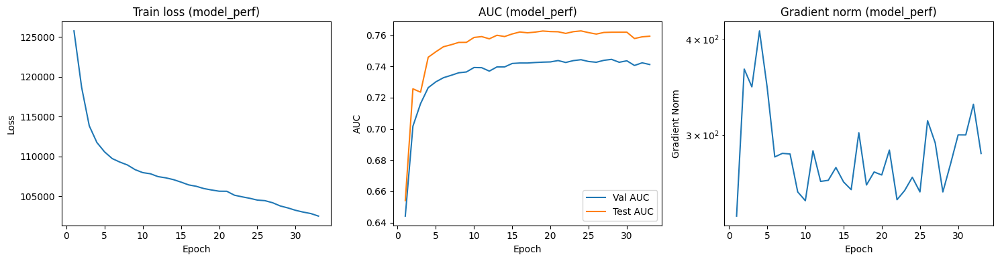

In [ ]:
# Create epochs array based on history length
epochs = range(1, len(history_perf[0]["train_loss"]) + 1)

fig, axs = plt.subplots(1, 3, figsize=(15,4))

# Plotting for model_perf
axs[0].plot(epochs, history_perf[0]["train_loss"])
axs[0].set_title("Train loss (model_perf)")
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss") # Add ylabel for clarity

axs[1].plot(epochs, history_perf[0]["val_auc"], label="Val AUC")
axs[1].plot(epochs, history_perf[0]["test_auc"], label="Test AUC")
axs[1].set_title("AUC (model_perf)")
axs[1].set_xlabel("Epoch")
axs[1].set_ylabel("AUC") # Add ylabel for clarity
axs[1].legend()

axs[2].plot(epochs, history_perf[1]) # Accessing gradient history from history_perf tuple
axs[2].set_title("Gradient norm (model_perf)")
axs[2].set_xlabel("Epoch")
axs[2].set_ylabel("Gradient Norm") # Add ylabel for clarity
axs[2].set_yscale("log")

plt.tight_layout()
plt.show()

In [ ]:
# Define the number of students to plot
num_students_to_plot = 5

# Set random seed for reproducibility
random.seed(42)

# Select student indices (make sure student_sequences is properly populated)
# This is done from the full student_sequences list
selected_indices = random.sample(range(len(student_sequences)), num_students_to_plot)

# Define a palette of distinct colors
palette = sns.color_palette("tab10", num_students_to_plot)
student_colors = {selected_indices[j]: palette[j] for j in range(num_students_to_plot)}

print(f"Selected student indices for plotting: {selected_indices}")
print(f"Assigned colors for these students: {student_colors}")

Selected student indices for plotting: [2619, 456, 102, 3037, 1126]
Assigned colors for these students: {2619: (0.12156862745098039, 0.4666666666666667, 0.7058823529411765), 456: (1.0, 0.4980392156862745, 0.054901960784313725), 102: (0.17254901960784313, 0.6274509803921569, 0.17254901960784313), 3037: (0.8392156862745098, 0.15294117647058825, 0.1568627450980392), 1126: (0.5803921568627451, 0.403921568627451, 0.7411764705882353)}


In [ ]:
print(type(self.sequences[idx]))
print(self.sequences[idx])

NameError: name 'self' is not defined

In [ ]:
# Assuming 'student_sequences' is the list of sequences your DKTDataset uses
# and you want to inspect a specific one, e.g., the first one (index 0).

example_idx = 0

if len(student_sequences) > example_idx:
    sequence_to_inspect = student_sequences[example_idx]
    print(f"Type of student_sequences[{example_idx}]: {type(sequence_to_inspect)}")
    print(f"Content of student_sequences[{example_idx}]: {sequence_to_inspect}")
else:
    print(f"Error: student_sequences does not have an element at index {example_idx}.")
    print(f"Current length of student_sequences: {len(student_sequences)}")


Type of student_sequences[0]: <class 'tuple'>
Content of student_sequences[0]: (np.int64(14), [(np.int64(0), 0), (np.int64(0), 1), (np.int64(0), 0), (np.int64(0), 0), (np.int64(0), 0), (np.int64(0), 0), (np.int64(0), 0), (np.int64(0), 0), (np.int64(0), 1), (np.int64(0), 0), (np.int64(0), 1), (np.int64(0), 0), (np.int64(1), 0), (np.int64(2), 1), (np.int64(2), 1), (np.int64(1), 0), (np.int64(2), 1), (np.int64(1), 0), (np.int64(1), 0)])


--- Characteristics of Plotted Students ---
Student 1 (User ID: 87606):
  Total Interactions: 144
  Average Correctness: 0.81
Student 2 (User ID: 78541):
  Total Interactions: 29
  Average Correctness: 0.79
Student 3 (User ID: 71250):
  Total Interactions: 18
  Average Correctness: 0.83
Student 4 (User ID: 89548):
  Total Interactions: 83
  Average Correctness: 0.23
Student 5 (User ID: 80235):
  Total Interactions: 154
  Average Correctness: 0.51


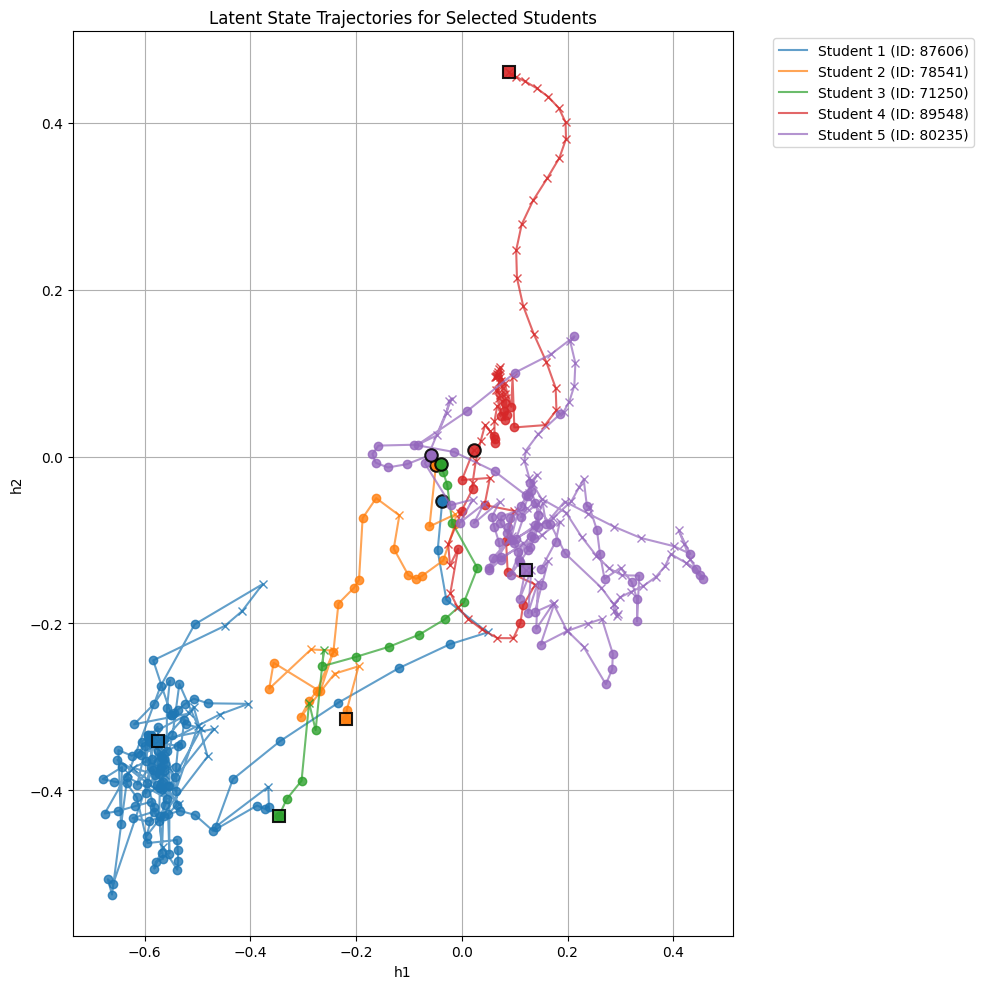

In [ ]:
plt.figure(figsize=(10, 10)) # Slightly larger for better visibility
plt.title("Latent State Trajectories for Selected Students")
plt.xlabel("h1")
plt.ylabel("h2")

model_perf.eval()

print("--- Characteristics of Plotted Students ---")
for i, idx in enumerate(selected_indices):
    user_id, seq = student_sequences[idx] # Unpack user_id and sequence

    # Need to handle sequences shorter than 2 if they exist, as DKTDataset expects T-1
    if len(seq) < 2:
        print(f"Skipping student {user_id} (index {idx}) due to short sequence length: {len(seq)}")
        continue

    # Characterize the student
    total_interactions = len(seq)
    correctness_scores_full = [a for q, a in seq] # Full list of correctness for original sequence
    average_correctness = np.mean(correctness_scores_full) if correctness_scores_full else 0

    print(f"Student {i+1} (User ID: {user_id}):")
    print(f"  Total Interactions: {total_interactions}")
    print(f"  Average Correctness: {average_correctness:.2f}")

    # Get the assigned color for this student
    line_color = student_colors[idx]

    # Create a DKTDataset for this single sequence and get its padded batch
    #single_student_dataset = DKTDataset([seq], M) # Pass only the sequence part
    single_student_dataset = DKTDataset([(user_id, seq)], M)

    x_input, q_next_val, a_next_val, mask_val, _ = dkt_collate([single_student_dataset[0]])

    x_input = x_input.to(device)

    with torch.no_grad():
        _, h_seq = model_perf(x_input)

    # actual_len is T-1 for DKTDataset logic
    actual_len = mask_val.sum().int().item()
    h_trajectory = h_seq[0, :actual_len, :].cpu().numpy()

    # Plot the trajectory line first, using the assigned color
    plt.plot(h_trajectory[:, 0], h_trajectory[:, 1], '-', color=line_color, alpha=0.7, label=f'Student {i+1} (ID: {user_id})')

    # Now plot individual interaction markers based on correctness, using the line_color
    for t in range(actual_len):
        if correctness_scores_full[t] == 1: # Correct answer, use filled circle
            plt.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'o', markersize=6,
                     markerfacecolor=line_color, markeredgecolor=line_color, alpha=0.8)
        else: # Incorrect answer, use 'x' mark
            plt.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'x', markersize=6,
                     markerfacecolor='none', markeredgecolor=line_color, alpha=0.8)

    # Plot the start marker with border
    plt.plot(h_trajectory[0, 0], h_trajectory[0, 1], 'o', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)

    # Plot the end marker with border
    plt.plot(h_trajectory[-1, 0], h_trajectory[-1, 1], 's', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside to prevent overlap
plt.grid(True)
plt.tight_layout() # Adjust layout to prevent labels from being cut off

plt.show()

--- Characteristics of Plotted Students (Side-by-Side) ---
Student 1 (User ID: 87606):
  Total Interactions: 144
  Average Correctness: 0.81
Student 2 (User ID: 78541):
  Total Interactions: 29
  Average Correctness: 0.79
Student 3 (User ID: 71250):
  Total Interactions: 18
  Average Correctness: 0.83
Student 4 (User ID: 89548):
  Total Interactions: 83
  Average Correctness: 0.23
Student 5 (User ID: 80235):
  Total Interactions: 154
  Average Correctness: 0.51


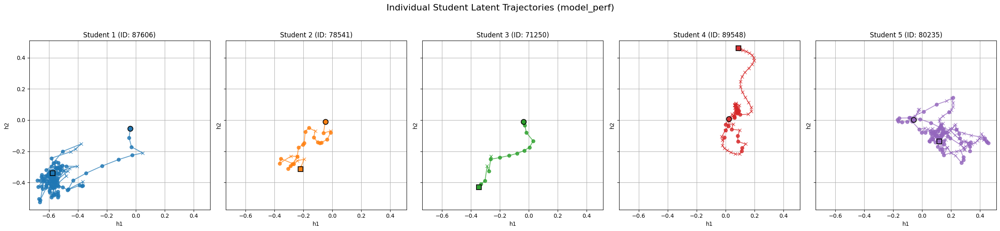

In [ ]:
# Select the same students as before for consistency
num_students_to_plot = 5
random.seed(42) # for reproducibility
selected_indices = random.sample(range(len(student_sequences)), num_students_to_plot)

# --- MODIFIED: Added sharex=True and sharey=True ---
fig, axs = plt.subplots(1, num_students_to_plot, figsize=(5 * num_students_to_plot, 6), squeeze=False, sharex=True, sharey=True)
fig.suptitle("Individual Student Latent Trajectories (model_perf)", fontsize=16)

print("--- Characteristics of Plotted Students (Side-by-Side) ---")
for i, idx in enumerate(selected_indices):
    user_id, seq = student_sequences[idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} (index {idx}) due to short sequence length: {len(seq)}")
        continue

    total_interactions = len(seq)
    correctness_scores_full = [a for q, a in seq]
    average_correctness = np.mean(correctness_scores_full) if correctness_scores_full else 0

    print(f"Student {i+1} (User ID: {user_id}):")
    print(f"  Total Interactions: {total_interactions}")
    print(f"  Average Correctness: {average_correctness:.2f}")

    # Get the assigned color for this student
    line_color = student_colors[idx]

    #single_student_dataset = DKTDataset([seq], M)
    single_student_dataset = DKTDataset([(user_id, seq)], M)

    x_input, _, _, mask_val, _ = dkt_collate([single_student_dataset[0]])
    x_input = x_input.to(device)

    with torch.no_grad():
        _, h_seq = model_perf(x_input)

    actual_len = mask_val.sum().int().item()
    h_trajectory = h_seq[0, :actual_len, :].cpu().numpy()

    # Plot on the corresponding subplot
    ax = axs[0, i] # Use axs[0, i] because squeeze=False returns a 2D array
    ax.plot(h_trajectory[:, 0], h_trajectory[:, 1], '-', color=line_color, alpha=0.7, label=f'ID: {user_id}')

    for t in range(actual_len):
        if correctness_scores_full[t] == 1:
            ax.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'o', markersize=6,
                     markerfacecolor=line_color, markeredgecolor=line_color, alpha=0.8)
        else:
            ax.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'x', markersize=6,
                     markerfacecolor='none', markeredgecolor=line_color, alpha=0.8)

    ax.plot(h_trajectory[0, 0], h_trajectory[0, 1], 'o', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)
    ax.plot(h_trajectory[-1, 0], h_trajectory[-1, 1], 's', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)

    ax.set_title(f"Student {i+1} (ID: {user_id})")
    ax.set_xlabel("h1")
    ax.set_ylabel("h2")
    ax.grid(True)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap


plt.show()

In [ ]:
#coleta do estado latente
model_perf.eval()
H = []

with torch.no_grad():
    for i in range(len(train_dataset)): # Iterate over individual sequences
        x, _, _, _, _ = dkt_collate([train_dataset[i]]) # Get a single sequence and apply collate to make it a batch of 1
        x = x.to(device)
        _, h = model_latent(x)
        H.append(h.squeeze(0).cpu()) # Squeeze to remove batch dimension and collect (T_seq, hidden_size)

H = torch.cat(H, dim=0)

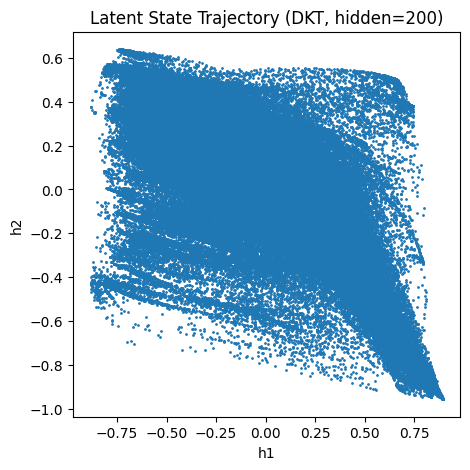

In [ ]:
plt.figure(figsize=(5,5))
plt.scatter(H[:, 0].flatten(), H[:, 1].flatten(), s=1)
plt.xlabel("h1")
plt.ylabel("h2")
plt.title("Latent State Trajectory (DKT, hidden=200)")

plt.show()

#SÓ DEPOIS DE PLOT LATENT TRAJECTORY

In [ ]:
#perf
y_perf, h_seq = model_perf(x)  # y: (B, T, M)

# Get a sample batch for analysis
x, q_next, a_next, mask, _ = next(iter(train_loader))
x = x.to(device)
q_next = q_next.to(device)

# Get predictions from model_latent (assuming it's already defined and trained)
model_perf.eval() # Ensure model is in evaluation mode
with torch.no_grad():
    y_perf, _ = model_perf(x) # y: (B, T, M)

# T (sequence length) can be derived from the batch
_, T, _ = y_perf.shape # T = x.shape[1] too

# Calculate p_t (predicted probabilities for the next question)
p_t = y_perf.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

mean_curve = []
for t in range(T):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_curve.append(p_t[mask_t, t].mean().item())
    else:
        mean_curve.append(None) # Or np.nan, or skip, depending on desired behavior for empty timesteps

#previsao da proxima questao
p_t = y_perf.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

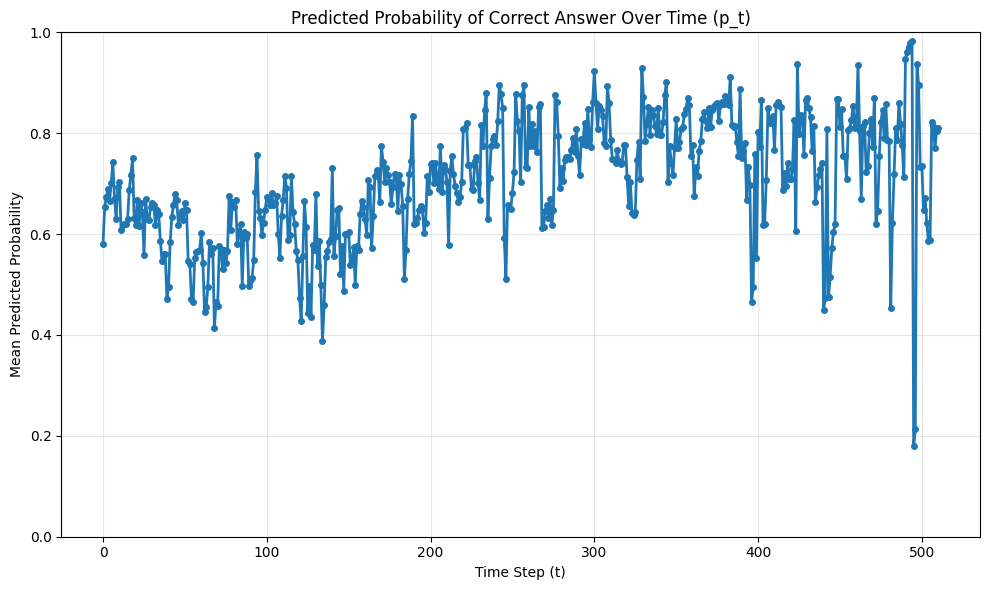

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(mean_curve, marker='o', linestyle='-', linewidth=2, markersize=4)
plt.xlabel("Time Step (t)")
plt.ylabel("Mean Predicted Probability")
plt.title("Predicted Probability of Correct Answer Over Time (p_t)")
plt.grid(True, alpha=0.3)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

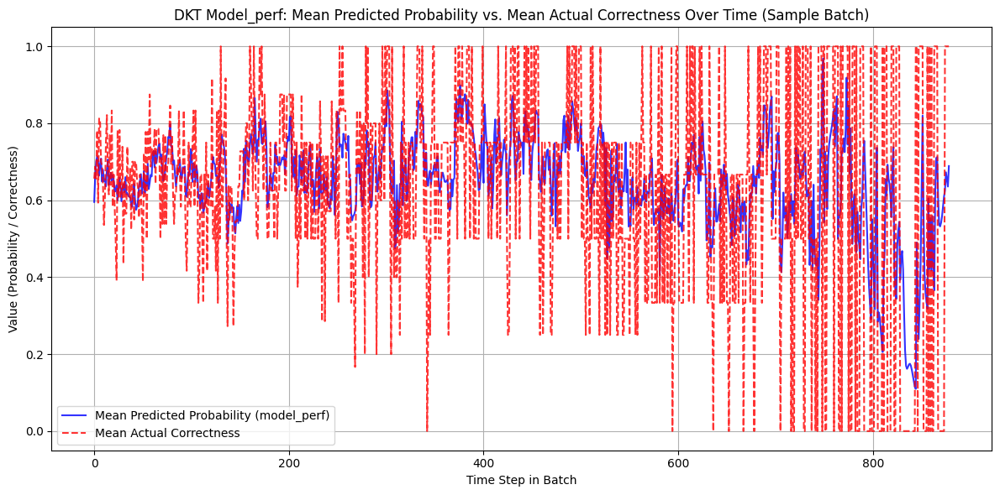

In [ ]:
# Get a fresh sample batch for analysis
x, q_next, a_next, mask, _ = next(iter(train_loader))
x = x.to(device)
q_next = q_next.to(device)
a_next = a_next.to(device) # Ensure a_next is on device if used for calculations

# Get predictions from model_perf
model_perf.eval() # Ensure model is in evaluation mode
with torch.no_grad():
    y_perf, _ = model_perf(x) # y_perf: (B, T, M)

# T (sequence length) can be derived from the batch
T_perf = y_perf.shape[1]

# Calculate p_t (predicted probabilities for the next question)
p_t_perf = y_perf.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

# Calculate mean predicted probability over time for the batch
mean_curve_perf = []
for t in range(T_perf):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_curve_perf.append(p_t_perf[mask_t, t].mean().item())
    else:
        mean_curve_perf.append(None) # Or np.nan, or skip

# Calculate the mean actual correctness over time for the current batch
mean_actual_correctness_perf = []
for t in range(T_perf):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_actual_correctness_perf.append(a_next[mask_t, t].float().mean().item())
    else:
        mean_actual_correctness_perf.append(None) # Use None for empty time steps

# Filter out None values for plotting
valid_timesteps_perf = [t for t, val in enumerate(mean_curve_perf) if val is not None]
valid_mean_curve_perf = [val for val in mean_curve_perf if val is not None]
valid_mean_actual_correctness_perf = [val for val in mean_actual_correctness_perf if val is not None]

if not valid_timesteps_perf:
    print("No valid data to plot for mean predicted probability vs mean actual correctness in this batch for model_perf.")
else:
    plt.figure(figsize=(12, 6))
    plt.plot(valid_timesteps_perf, valid_mean_curve_perf, label="Mean Predicted Probability (model_perf)", color='blue', alpha=0.8)
    plt.plot(valid_timesteps_perf, valid_mean_actual_correctness_perf, label="Mean Actual Correctness", color='red', linestyle='--', alpha=0.8)
    plt.xlabel("Time Step in Batch")
    plt.ylabel("Value (Probability / Correctness)")
    plt.title("DKT Model_perf: Mean Predicted Probability vs. Mean Actual Correctness Over Time (Sample Batch)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, "dkt_prediction_vs_actual_over_time_model_perf.png"))
    plt.show()


/tmp/ipython-input-1769508316.py:37: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], "k:", label="Perfeita Calibração", color='gray') # Perfect calibration line


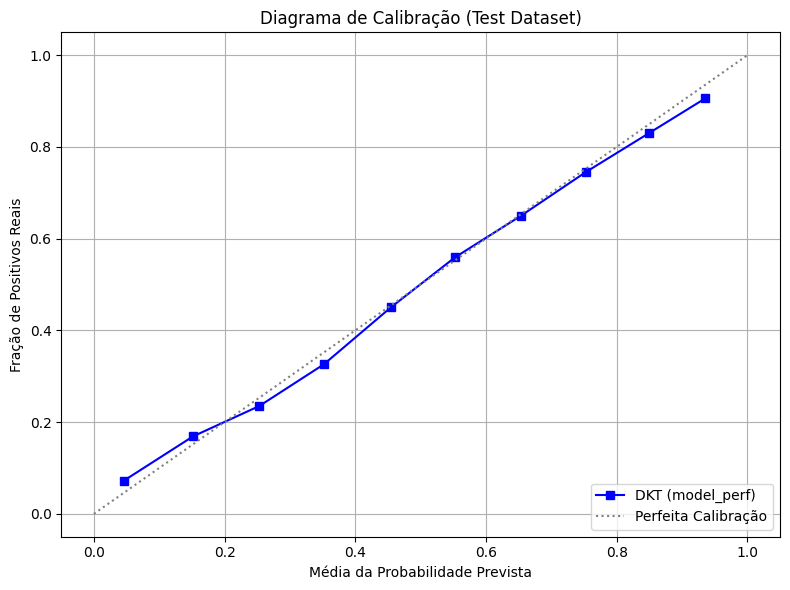

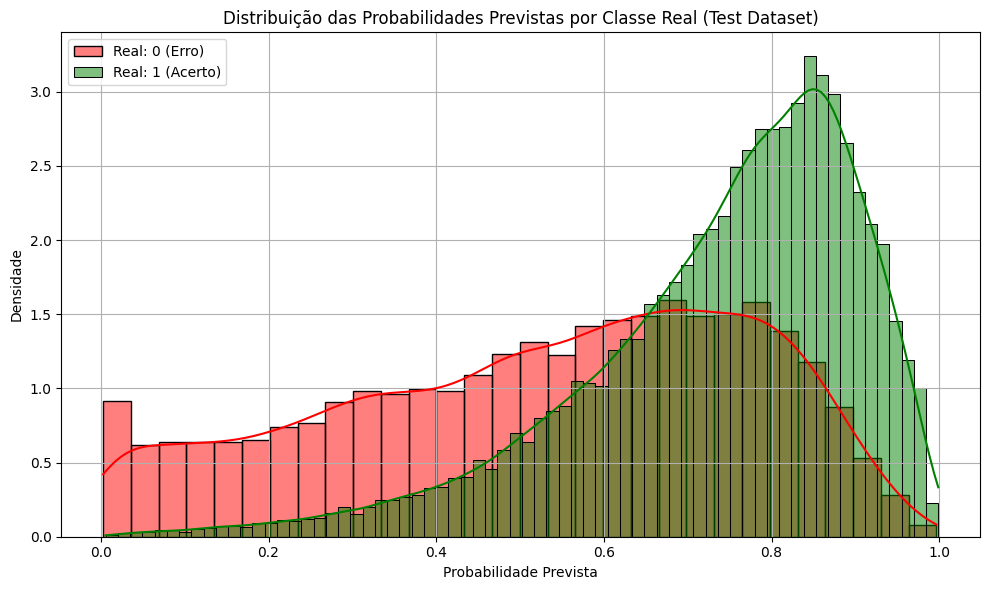

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.calibration import calibration_curve

# Ensure model_perf is in evaluation mode and on the correct device
model_perf.eval()
model_perf.to(device)

all_preds = []
all_targets = []

# Collect all predictions and true labels from the test_loader
with torch.no_grad():
    for x, q_next, a_next, mask, _ in test_loader: # Assuming test_loader yields 5 values including uids
        x = x.to(device)
        q_next = q_next.to(device)
        a_next = a_next.to(device)
        mask = mask.to(device)

        y, _ = model_perf(x) # model_perf returns y, h_seq
        p = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1) # Predicted probability for the actual next question

        all_preds.append(p[mask.bool()].cpu().numpy())
        all_targets.append(a_next[mask.bool()].cpu().numpy())

all_preds = np.concatenate(all_preds)
all_targets = np.concatenate(all_targets)

# --- Plot 1: Calibration Plot (Reliability Diagram) ---
plt.figure(figsize=(8, 6))

# Generate calibration curve data
fraction_of_positives, mean_predicted_value = calibration_curve(all_targets, all_preds, n_bins=10)

plt.plot(mean_predicted_value, fraction_of_positives, "s-", label="DKT (model_perf)", color='blue')
plt.plot([0, 1], [0, 1], "k:", label="Perfeita Calibração", color='gray') # Perfect calibration line
plt.xlabel("Média da Probabilidade Prevista")
plt.ylabel("Fração de Positivos Reais")
plt.title("Diagrama de Calibração (Test Dataset)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot 2: Distribution of Predicted Probabilities by True Class ---
plt.figure(figsize=(10, 6))
sns.histplot(all_preds[all_targets == 0], color='red', label='Real: 0 (Erro)', kde=True, stat='density', alpha=0.5)
sns.histplot(all_preds[all_targets == 1], color='green', label='Real: 1 (Acerto)', kde=True, stat='density', alpha=0.5)
plt.xlabel("Probabilidade Prevista")
plt.ylabel("Densidade")
plt.title("Distribuição das Probabilidades Previstas por Classe Real (Test Dataset)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
'''Here are two plots comparing the predicted probabilities (p_t) with the real outcomes for the entire test dataset. The first is a Calibration Plot, which shows how well the predicted probabilities align with the actual observed correctness rates. The second plot shows the Distribution of Predicted Probabilities for cases where the true answer was an error (0) versus a correct answer (1), indicating the model's ability to differentiate between classes.

The plots comparing predicted probabilities with actual correctness for the test dataset have been generated successfully.

First, regarding the UserWarning about the redundant color in the plot: this is just a minor warning from Matplotlib. It means that when plotting the 'Perfect Calibration' line, you specified "k:" (which implies a black dashed line) and also color='gray'. Matplotlib used color='gray', so the line is gray instead of black. It doesn't affect the correctness of the plot or the results.

Now, let's interpret the two plots:

1. Diagrama de Calibração (Test Dataset)
This plot (also known as a Reliability Diagram) assesses how well your model's predicted probabilities match the true probabilities.

The diagonal dashed gray line represents a perfectly calibrated model: if the model predicts a probability of 0.6, then 60% of the actual outcomes should be positive.
The blue line shows model_perf's calibration. If this line is close to the diagonal, your model is well-calibrated.
Interpretation: From the plot, observe how closely the blue line follows the gray diagonal. Deviations indicate miscalibration. If the blue line is below the diagonal (e.g., model predicts 0.6, but only 50% are positive), the model is overconfident. If it's above, it's underconfident. This plot helps us understand if the model's probabilities can be trusted as true probabilities.

2. Distribuição das Probabilidades Previstas por Classe Real (Test Dataset)
This plot shows the density distribution of the model's predicted probabilities, separated by the actual outcome (0 = error, 1 = correct).

The red curve represents the distribution of predicted probabilities for instances where the student actually made an error (True: 0).
The green curve represents the distribution of predicted probabilities for instances where the student answered correctly (True: 1).
Interpretation: For a perfect classifier, you'd want to see the red curve heavily concentrated near 0 and the green curve heavily concentrated near 1, with minimal overlap. The degree of separation between these two curves indicates how well your model distinguishes between correct and incorrect answers. A significant overlap suggests that the model is less confident or struggles to make clear distinctions for some predictions.
'''

In [ ]:
'''Vamos esclarecer o que são o "Forecast" e a "Probabilidade Real" para o seu problema DKT:

O "Forecast" (a previsão) do seu modelo DKT é a probabilidade contínua de acerto que ele gera (o valor entre 0 e 1, como 0.75, 0.23, etc.).
A "Probabilidade Real" (o que realmente aconteceu) para uma interação individual é sempre 0 (erro) ou 1 (acerto). Não há uma "probabilidade real" contínua de 0.75 para um único evento binário; ou o aluno acertou (1) ou errou (0).
Fracão de Positivos Reais no Diagrama de Calibração: Por que faz sentido?
O diagrama de calibração é exatamente a comparação entre o seu forecast e a "probabilidade real", mas de forma agregada, que é a única maneira de avaliar probabilidades para eventos binários:

Modelo Diz: "A probabilidade de acerto é de X%" (Seu Forecast).
Mundo Real Responde: "Em todos os casos onde o modelo disse que a probabilidade era de X%, o aluno realmente acertou em Y% das vezes" (Sua Probabilidade Real Observada, ou "Fração de Positivos Reais").
Se o seu modelo está bem calibrado (a linha azul segue a linha cinza), significa que ele diz a verdade sobre suas próprias incertezas. Ou seja, se o modelo prevê 80% de chance de acerto, em 80% das vezes o aluno realmente acertou. Isso é crucial para modelos que fornecem probabilidades, não apenas classificações diretas.

Distribuição de Probabilidades Previstas: Por que a sobreposição e não complementaridade?
Quando você compara as curvas de distribuição de probabilidades previstas para o Real: 0 (Erro) e Real: 1 (Acerto), você está vendo como o modelo distribui as suas previsões (forecast) para cada classe real (0 ou 1).

Não são complementares (não se somam a 1): Porque elas não representam a probabilidade de um evento acontecer ou não. Elas representam a densidade das previsões do modelo para cada resultado real. Se você somar a área de cada curva, cada uma vai somar a 1 individualmente (porque stat='density' normaliza a área de cada histograma). Elas não estão comparando P(acerto) vs P(erro). Elas estão comparando P(Previsão | Real=0) vs P(Previsão | Real=1).
Sobreposição: A sobreposição entre a curva vermelha e a verde indica as situações onde o modelo está incerto ou cometendo erros.
Onde a curva vermelha (erros reais) está alta para previsões acima de 0.5, o modelo está dando confiança (forecast alto) para algo que foi um erro (real = 0). Isso são Falsos Positivos.
Onde a curva verde (acertos reais) está alta para previsões abaixo de 0.5, o modelo está dando pouca confiança (forecast baixo) para algo que foi um acerto (real = 1). Isso são Falsos Negativos.
O objetivo é minimizar essa sobreposição. Quanto menos sobreposição, melhor o modelo consegue separar os acertos dos erros usando suas probabilidades preditas.

Para o PIB, tanto o "real" quanto o "forecast" são valores contínuos (e.g., 2.5%, 3.1%). Você pode plotar os dois valores lado a lado e compará-los diretamente em cada ponto no tempo.
No DKT para cada interação, o "real" é binário (0 ou 1), enquanto o "forecast" é contínuo (0 a 1). Uma comparação direta ponto a ponto de forecast contínuo vs real binário em uma única linha não seria muito informativa (seria o forecast vs. uma linha que só pula entre 0 e 1).
Por isso, para ver o "forecast vs. real" ao longo do tempo para o conjunto de teste inteiro, a forma mais análoga e informativa é o gráfico que geramos anteriormente:

"Média Probabilidade Predita" (linha azul)
"Média Acerto Real" (linha vermelha tracejada)
Essa é a curva que mostra a média do seu forecast (forecast médio) versus a média do que realmente aconteceu (probabilidade real observada média) para todos os alunos, em cada passo de interação. É o mais próximo que você pode chegar da analogia do PIB para este tipo de problema.'''

In [ ]:
''''
Sobre a "Distribuição das Probabilidades Previstas por Classe Real":
Não, a distribuição não é só do real. Pelo contrário, o eixo X desse gráfico representa a probabilidade predita pelo modelo (o seu "forecast" contínuo entre 0 e 1).
As duas curvas (vermelha e verde) que você vê mostram a distribuição dessas probabilidades preditas, mas separadas por qual foi o resultado real.
A curva vermelha mostra como as probabilidades que o modelo previu se distribuíram para todas as vezes que o aluno realmente errou (resultado real = 0).
A curva verde mostra como as probabilidades que o modelo previu se distribuíram para todas as vezes que o aluno realmente acertou (resultado real = 1).
Por que essa comparação é válida e o que ela mostra:
O que estamos comparando? Estamos comparando duas distribuições de previsões (forecasts do modelo), uma para cada classe real. O objetivo é ver se o modelo, ao gerar suas probabilidades, consegue separar bem as amostras que são realmente 0 das que são realmente 1.
Um modelo ideal: Se o seu modelo fosse perfeito, a curva vermelha seria um pico estreito em 0 (ou seja, ele previu 0 para todos os erros) e a curva verde seria um pico estreito em 1 (ou seja, ele previu 1 para todos os acertos). Isso significaria que não haveria sobreposição nenhuma, pois o modelo estaria previnindo perfeitamente o real.
A sobreposição: A sobreposição indica que o modelo está, por vezes, a prever probabilidades altas para o que era um erro (parte da curva vermelha à direita de 0.5) ou probabilidades baixas para o que era um acerto (parte da curva verde à esquerda de 0.5). Essa sobreposição mede a capacidade discriminativa do seu modelo.
E por que não um "barra de um e curva de outro"?
No seu gráfico, a "barra" (o histograma que o KDE suaviza) e a "curva" (o KDE) estão sempre relacionadas à mesma distribuição. O histograma (barras) é a contagem bruta, e a curva KDE é uma suavização dessa contagem para mostrar a forma da distribuição de forma contínua.
Não faria sentido ter "a barra de um e a curva de outro" nesse contexto específico porque estaríamos misturando duas representações da mesma informação (contagem/densidade de previsões). O que faz sentido é ter duas curvas (ou dois histogramas) que representam as distribuições das previsões para duas condições diferentes (real=0 e real=1), como está sendo feito.
'''

Finished collecting data. Generating plots...


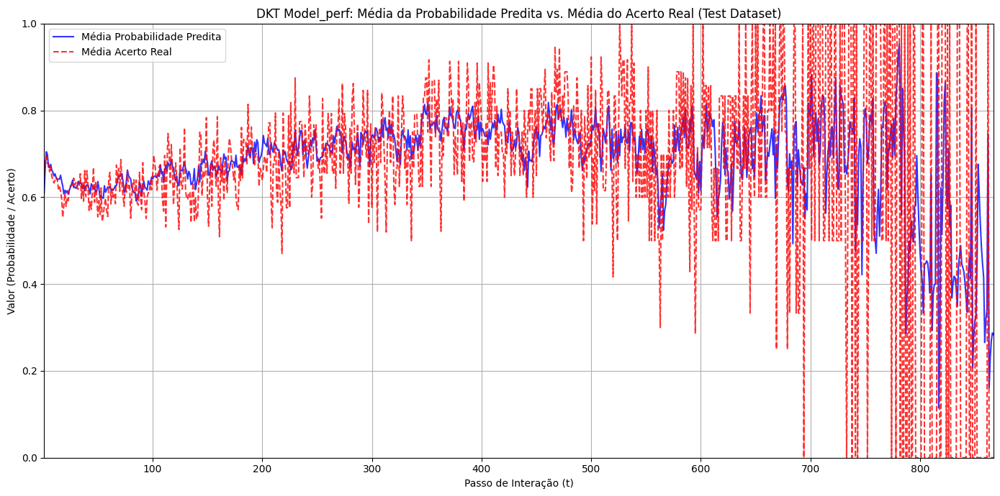

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import os

# Ensure model_perf is in evaluation mode and on the correct device
model_perf.eval()
model_perf.to(device)

# Initialize lists to store predicted probabilities and actual correctness for each time step
# We need to handle variable sequence lengths. We'll store lists of values per time step.
max_seq_len_in_test_set = 0
for x, _, _, mask, _ in test_loader:
    max_seq_len_in_test_set = max(max_seq_len_in_test_set, x.shape[1])

# Create lists of lists, where each inner list holds values for a specific time step
all_preds_by_timestep = [[] for _ in range(max_seq_len_in_test_set)]
all_actuals_by_timestep = [[] for _ in range(max_seq_len_in_test_set)]

print("Collecting predictions and actuals from the entire test dataset...")

with torch.no_grad():
    for x, q_next, a_next, mask, _ in test_loader:
        x = x.to(device)
        q_next = q_next.to(device)
        a_next = a_next.to(device)
        mask = mask.to(device)

        y_perf, _ = model_perf(x)  # y_perf: (B, T, M)

        # Predicted probabilities for the actual next question
        p_t_perf = y_perf.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

        # Iterate through each sequence in the batch
        for batch_idx in range(x.shape[0]):
            actual_len_for_seq = int(mask[batch_idx].sum().item())

            for t in range(actual_len_for_seq):
                all_preds_by_timestep[t].append(p_t_perf[batch_idx, t].item())
                all_actuals_by_timestep[t].append(a_next[batch_idx, t].item())

print("Finished collecting data. Generating plots...")

# Calculate mean predicted probability and mean actual correctness for each time step
mean_predicted_probs = [np.mean(vals) if vals else np.nan for vals in all_preds_by_timestep]
mean_actual_correctness = [np.mean(vals) if vals else np.nan for vals in all_actuals_by_timestep]

# Filter out NaN values (for time steps where no sequences extend that far)
valid_timesteps = [t for t, val in enumerate(mean_predicted_probs) if not np.isnan(val)]
valid_mean_predicted_probs = [mean_predicted_probs[t] for t in valid_timesteps]
valid_mean_actual_correctness = [mean_actual_correctness[t] for t in valid_timesteps]

if not valid_timesteps:
    print("No valid data to plot for mean predicted probability vs mean actual correctness in the test set.")
else:
    plt.figure(figsize=(14, 7))
    plt.plot(np.array(valid_timesteps) + 1, valid_mean_predicted_probs, label="Média Probabilidade Predita", color='blue', alpha=0.8)
    plt.plot(np.array(valid_timesteps) + 1, valid_mean_actual_correctness, label="Média Acerto Real", color='red', linestyle='--', alpha=0.8)
    plt.xlabel("Passo de Interação (t)")
    plt.ylabel("Valor (Probabilidade / Acerto)")
    plt.title("DKT Model_perf: Média da Probabilidade Predita vs. Média do Acerto Real (Test Dataset)")
    plt.legend()
    plt.grid(True)
    plt.ylim(0, 1) # Probabilities are between 0 and 1
    plt.xlim(1, max(valid_timesteps) + 1) # Start x-axis from 1
    plt.tight_layout()

    # Ensure output_path is defined
    output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output_final/"
    os.makedirs(output_path, exist_ok=True)
    plt.savefig(os.path.join(output_path, "dkt_prediction_vs_actual_over_time_test_set.png"))
    plt.show()


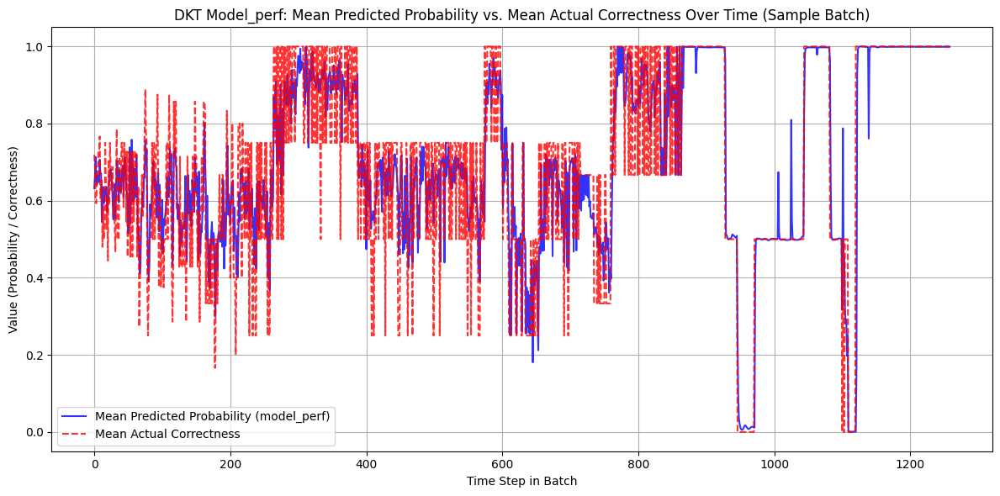

In [ ]:
# Get a fresh sample batch for analysis
x, q_next, a_next, mask = next(iter(train_loader))
x = x.to(device)
q_next = q_next.to(device)
a_next = a_next.to(device) # Ensure a_next is on device if used for calculations

# Get predictions from model_perf
model_perf.eval() # Ensure model is in evaluation mode
with torch.no_grad():
    y_perf, _ = model_perf(x) # y_perf: (B, T, M)

# T (sequence length) can be derived from the batch
T_perf = y_perf.shape[1]

# Calculate p_t (predicted probabilities for the next question)
p_t_perf = y_perf.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

# Calculate mean predicted probability over time for the batch
mean_curve_perf = []
for t in range(T_perf):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_curve_perf.append(p_t_perf[mask_t, t].mean().item())
    else:
        mean_curve_perf.append(None) # Or np.nan, or skip

# Calculate the mean actual correctness over time for the current batch
mean_actual_correctness_perf = []
for t in range(T_perf):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_actual_correctness_perf.append(a_next[mask_t, t].float().mean().item())
    else:
        mean_actual_correctness_perf.append(None) # Use None for empty time steps

# Filter out None values for plotting
valid_timesteps_perf = [t for t, val in enumerate(mean_curve_perf) if val is not None]
valid_mean_curve_perf = [val for val in mean_curve_perf if val is not None]
valid_mean_actual_correctness_perf = [val for val in mean_actual_correctness_perf if val is not None]

if not valid_timesteps_perf:
    print("No valid data to plot for mean predicted probability vs mean actual correctness in this batch for model_perf.")
else:
    plt.figure(figsize=(12, 6))
    plt.plot(valid_timesteps_perf, valid_mean_curve_perf, label="Mean Predicted Probability (model_perf)", color='blue', alpha=0.8)
    plt.plot(valid_timesteps_perf, valid_mean_actual_correctness_perf, label="Mean Actual Correctness", color='red', linestyle='--', alpha=0.8)
    plt.xlabel("Time Step in Batch")
    plt.ylabel("Value (Probability / Correctness)")
    plt.title("DKT Model_perf: Mean Predicted Probability vs. Mean Actual Correctness Over Time (Sample Batch)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, "dkt_prediction_vs_actual_over_time_model_perf.png"))
    plt.show()


#Análises perf

In [ ]:
y, h_seq = model_perf(x)  # y: (B, T, M)

In [ ]:
# Get a sample batch for analysis
x, q_next, a_next, mask, _ = next(iter(train_loader))
x = x.to(device)
q_next = q_next.to(device)

# Get predictions from model_latent (assuming it's already defined and trained)
model_perf.eval() # Ensure model is in evaluation mode
with torch.no_grad():
    y, _ = model_perf(x) # y: (B, T, M)

# T (sequence length) can be derived from the batch
_, T, _ = y.shape # T = x.shape[1] too

# Calculate p_t (predicted probabilities for the next question)
p_t = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

mean_curve = []
for t in range(T):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_curve.append(p_t[mask_t, t].mean().item())
    else:
        mean_curve.append(None) # Or np.nan, or skip, depending on desired behavior for empty timesteps

In [ ]:
#previsao da proxima questao
p_t = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

In [ ]:
# Re-run model_latent's LSTM with return_gates=True to get c_seq and h_seq
model_perf.eval()
with torch.no_grad():
    # Unpack all 6 returned values. The first is the main h_seq output.
    # The last element returned by LSTMScratch is h_seq (final hidden states for each t),
    # but for c_norm and h_norm, we need the sequences. So we can use the first h_seq output for h_norm.
    h_seq_outputs, f_seq, i_seq, o_seq, c_seq, _ = model_perf.lstm(x, return_gates=True)

c_norm = torch.norm(c_seq, dim=2)  # (B, T)
h_norm = torch.norm(h_seq_outputs, dim=2)  # (B, T) # Use the main h_seq outputs

In [ ]:
#norma media ao longo do tempo
mean_c = c_norm.mean(dim=0)  # (T,)
mean_h = h_norm.mean(dim=0)

#estabilidade
std_c = c_norm.std(dim=0)

In [ ]:
#print(f"Mean c: {mean_c}")
#print(f"Std c: {std_c}")


#print(f"Mean h: {mean_h}")
std_h = h_norm.std(dim=0)
#print(f"Std h: {std_h}")

In [ ]:
# Call analyze_dkt to populate all_stats
all_stats = analyze_dkt(model_perf, train_loader, device)

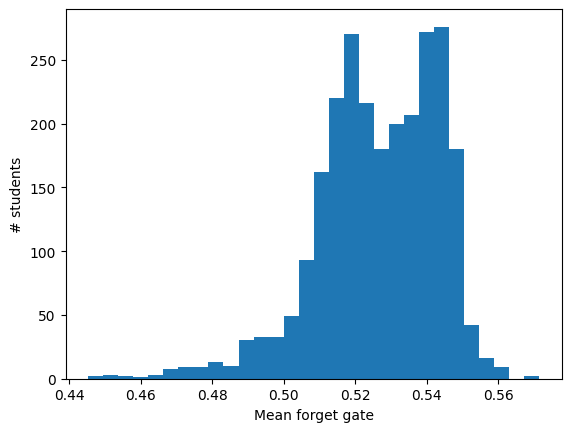

In [ ]:
#Histograma
plt.hist([s["f_mean"] for s in all_stats], bins=30)
plt.xlabel("Mean forget gate")
plt.ylabel("# students")
plt.show()

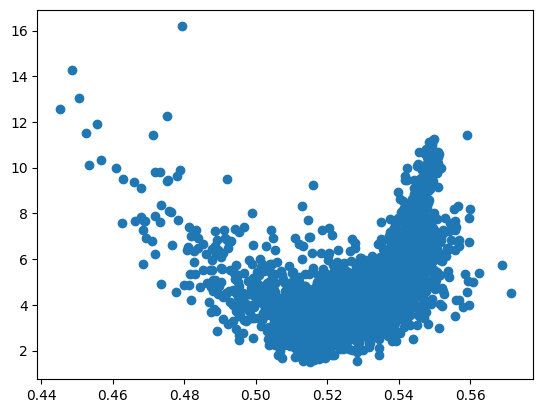

In [ ]:
#Correlação

plt.scatter(
    [s["f_mean"] for s in all_stats],
    [s["c_avg"] for s in all_stats]
    )

In [ ]:
f_values_all_students = np.array([s["f_mean"] for s in all_stats])
print(f"Min f_mean across all students: {np.min(f_values_all_students):.4f}")
print(f"Max f_mean across all students: {np.max(f_values_all_students):.4f}")

Min f_mean across all students: 0.4452
Max f_mean across all students: 0.5714


Min f_mean across all students: 0.4452
Max f_mean across all students: 0.5714


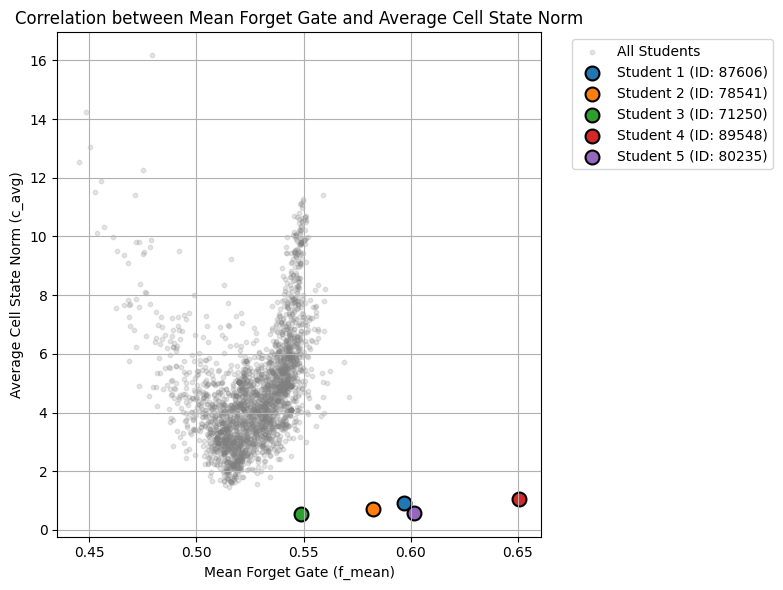

In [ ]:
# --- Diagnostic print statements ---
f_values_all_students = np.array([s["f_mean"] for s in all_stats])
print(f"Min f_mean across all students: {np.min(f_values_all_students):.4f}")
print(f"Max f_mean across all students: {np.max(f_values_all_students):.4f}")

# --- Background scatter for all students ---
plt.figure(figsize=(8,6))
plt.scatter(
    f_values_all_students,
    [s["c_avg"] for s in all_stats],
    s=10, alpha=0.2, color='gray', label='All Students'
)

# --- Highlight selected students ---
# Need to collect f_mean and c_avg for selected students individually
selected_students_stats = []
model_latent.eval()

for i, idx in enumerate(selected_indices):
    user_id, seq = student_sequences[idx]

    if len(seq) < 2:
        continue

    #single_student_dataset = DKTDataset([seq], M)
    single_student_dataset = DKTDataset([(user_id, seq)], M)

    x_input, _, _, mask_val,_ = dkt_collate([single_student_dataset[0]])
    x_input = x_input.to(device)

    with torch.no_grad():
        # MODIFIED: Unpack all 6 values returned by LSTMScratch when return_gates=True
        h_seq_main, f_seq, i_seq, o_seq, c_seq, h_seq_final = model_latent.lstm(x_input, return_gates=True)

    # Calculate f_mean and c_avg for this student
    # Note: f_seq.mean(dim=2) results in (B, T_seq), then take mean across T_seq
    f_mean_student = f_seq.mean(dim=2)[0, :mask_val.sum().int().item()].mean().item()
    c_norm_student = torch.norm(c_seq, dim=2)[0, :mask_val.sum().int().item()].mean().item()

    selected_students_stats.append({
        "user_id": user_id,
        "f_mean": f_mean_student,
        "c_avg": c_norm_student,
        "color": student_colors[idx]
    })

for i, student_stat in enumerate(selected_students_stats):
    plt.scatter(
        student_stat["f_mean"],
        student_stat["c_avg"],
        s=100, # Larger size for emphasis
        color=student_stat["color"],
        edgecolor='black', linewidth=1.5,
        label=f'Student {i+1} (ID: {student_stat["user_id"]})'
    )

plt.xlabel("Mean Forget Gate (f_mean)")
plt.ylabel("Average Cell State Norm (c_avg)")
plt.title("Correlation between Mean Forget Gate and Average Cell State Norm")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()


plt.show()

#LATENTE

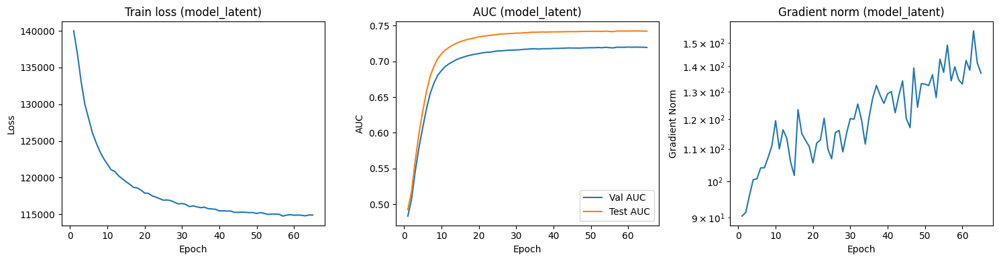

In [ ]:
# Create epochs array based on the actual length of history_l (which may be shorter due to early stopping)
epochs_latent = range(1, len(history_l[0]["train_loss"]) + 1)

fig, axs = plt.subplots(1, 3, figsize=(15,4))

# Plotting for model_latent (using history_l)
axs[0].plot(epochs_latent, history_l[0]["train_loss"])
axs[0].set_title("Train loss (model_latent)")
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss") # Add ylabel for clarity

axs[1].plot(epochs_latent, history_l[0]["val_auc"], label="Val AUC")
axs[1].plot(epochs_latent, history_l[0]["test_auc"], label="Test AUC")
axs[1].set_title("AUC (model_latent)")
axs[1].set_xlabel("Epoch")
axs[1].set_ylabel("AUC") # Add ylabel for clarity
axs[1].legend()

axs[2].plot(epochs_latent, history_l[1]) # Accessing gradient history from history_l tuple
axs[2].set_title("Gradient norm (model_latent)")
axs[2].set_xlabel("Epoch")
axs[2].set_ylabel("Gradient Norm") # Add ylabel for clarity
axs[2].set_yscale("log")

plt.tight_layout()
plt.show()

## Plot Latent Trajectories for Individual Students

--- Characteristics of Plotted Students ---
Student 1 (User ID: 87606):
  Total Interactions: 144
  Average Correctness: 0.81
Student 2 (User ID: 78541):
  Total Interactions: 29
  Average Correctness: 0.79
Student 3 (User ID: 71250):
  Total Interactions: 18
  Average Correctness: 0.83
Student 4 (User ID: 89548):
  Total Interactions: 83
  Average Correctness: 0.23
Student 5 (User ID: 80235):
  Total Interactions: 154
  Average Correctness: 0.51


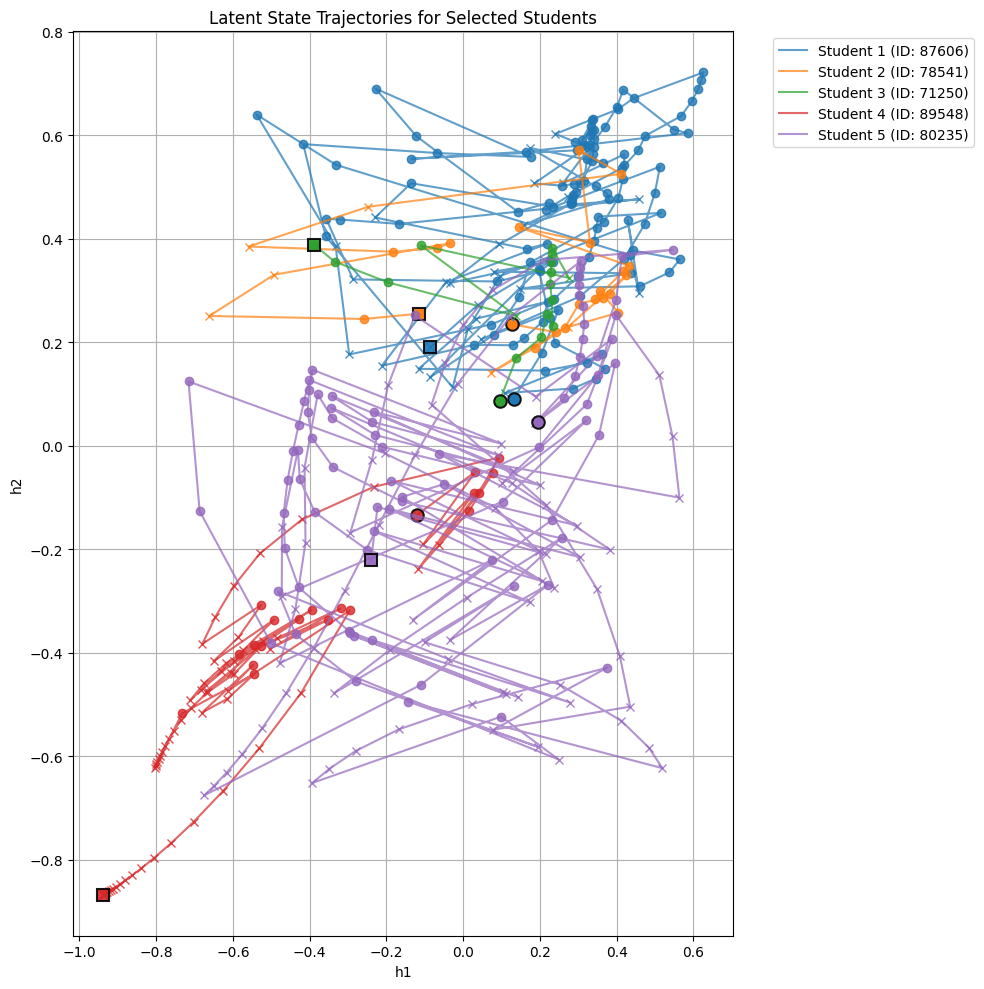

In [ ]:
plt.figure(figsize=(10, 10)) # Slightly larger for better visibility
plt.title("Latent State Trajectories for Selected Students")
plt.xlabel("h1")
plt.ylabel("h2")

model_latent.eval()

print("--- Characteristics of Plotted Students ---")
for i, idx in enumerate(selected_indices):
    user_id, seq = student_sequences[idx] # Unpack user_id and sequence

    # Need to handle sequences shorter than 2 if they exist, as DKTDataset expects T-1
    if len(seq) < 2:
        print(f"Skipping student {user_id} (index {idx}) due to short sequence length: {len(seq)}")
        continue

    # Characterize the student
    total_interactions = len(seq)
    correctness_scores_full = [a for q, a in seq] # Full list of correctness for original sequence
    average_correctness = np.mean(correctness_scores_full) if correctness_scores_full else 0

    print(f"Student {i+1} (User ID: {user_id}):")
    print(f"  Total Interactions: {total_interactions}")
    print(f"  Average Correctness: {average_correctness:.2f}")

    # Get the assigned color for this student
    line_color = student_colors[idx]

    # Create a DKTDataset for this single sequence and get its padded batch
    #single_student_dataset = DKTDataset([seq], M) # Pass only the sequence part
    single_student_dataset = DKTDataset([(user_id, seq)], M)

    x_input, q_next_val, a_next_val, mask_val, _ = dkt_collate([single_student_dataset[0]])

    x_input = x_input.to(device)

    with torch.no_grad():
        _, h_seq = model_latent(x_input)

    # actual_len is T-1 for DKTDataset logic
    actual_len = mask_val.sum().int().item()
    h_trajectory = h_seq[0, :actual_len, :].cpu().numpy()

    # Plot the trajectory line first, using the assigned color
    plt.plot(h_trajectory[:, 0], h_trajectory[:, 1], '-', color=line_color, alpha=0.7, label=f'Student {i+1} (ID: {user_id})')

    # Now plot individual interaction markers based on correctness, using the line_color
    for t in range(actual_len):
        if correctness_scores_full[t] == 1: # Correct answer, use filled circle
            plt.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'o', markersize=6,
                     markerfacecolor=line_color, markeredgecolor=line_color, alpha=0.8)
        else: # Incorrect answer, use 'x' mark
            plt.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'x', markersize=6,
                     markerfacecolor='none', markeredgecolor=line_color, alpha=0.8)

    # Plot the start marker with border
    plt.plot(h_trajectory[0, 0], h_trajectory[0, 1], 'o', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)

    # Plot the end marker with border
    plt.plot(h_trajectory[-1, 0], h_trajectory[-1, 1], 's', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside to prevent overlap
plt.grid(True)
plt.tight_layout() # Adjust layout to prevent labels from being cut off

# Save the plot to the output path
#plt.savefig(os.path.join(output_path, "individual_student_trajectories_combined_fixed_colors.png"))

plt.show()

--- Characteristics of Plotted Students (Side-by-Side) ---
Student 1 (User ID: 87606):
  Total Interactions: 144
  Average Correctness: 0.81
Student 2 (User ID: 78541):
  Total Interactions: 29
  Average Correctness: 0.79
Student 3 (User ID: 71250):
  Total Interactions: 18
  Average Correctness: 0.83
Student 4 (User ID: 89548):
  Total Interactions: 83
  Average Correctness: 0.23
Student 5 (User ID: 80235):
  Total Interactions: 154
  Average Correctness: 0.51


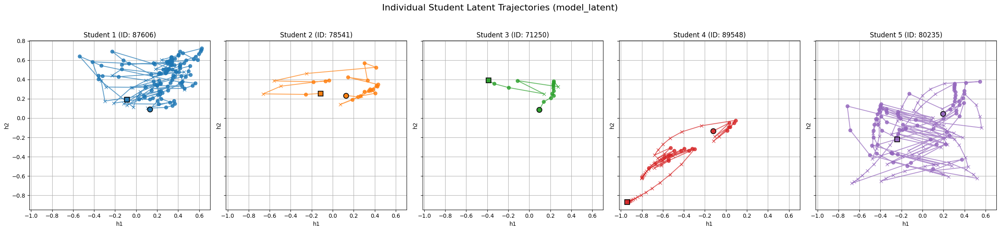

In [ ]:
# Select the same students as before for consistency
num_students_to_plot = 5
random.seed(42) # for reproducibility
selected_indices = random.sample(range(len(student_sequences)), num_students_to_plot)

# --- MODIFIED: Added sharex=True and sharey=True ---
fig, axs = plt.subplots(1, num_students_to_plot, figsize=(5 * num_students_to_plot, 6), squeeze=False, sharex=True, sharey=True)
fig.suptitle("Individual Student Latent Trajectories (model_latent)", fontsize=16)

print("--- Characteristics of Plotted Students (Side-by-Side) ---")
for i, idx in enumerate(selected_indices):
    user_id, seq = student_sequences[idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} (index {idx}) due to short sequence length: {len(seq)}")
        continue

    total_interactions = len(seq)
    correctness_scores_full = [a for q, a in seq]
    average_correctness = np.mean(correctness_scores_full) if correctness_scores_full else 0

    print(f"Student {i+1} (User ID: {user_id}):")
    print(f"  Total Interactions: {total_interactions}")
    print(f"  Average Correctness: {average_correctness:.2f}")

    # Get the assigned color for this student
    line_color = student_colors[idx]

    single_student_dataset = DKTDataset([(user_id, seq)], M)

    x_input, _, _, mask_val, _ = dkt_collate([single_student_dataset[0]])
    x_input = x_input.to(device)

    with torch.no_grad():
        _, h_seq = model_latent(x_input)

    actual_len = mask_val.sum().int().item()
    h_trajectory = h_seq[0, :actual_len, :].cpu().numpy()

    # Plot on the corresponding subplot
    ax = axs[0, i] # Use axs[0, i] because squeeze=False returns a 2D array
    ax.plot(h_trajectory[:, 0], h_trajectory[:, 1], '-', color=line_color, alpha=0.7, label=f'ID: {user_id}')

    for t in range(actual_len):
        if correctness_scores_full[t] == 1:
            ax.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'o', markersize=6,
                     markerfacecolor=line_color, markeredgecolor=line_color, alpha=0.8)
        else:
            ax.plot(h_trajectory[t, 0], h_trajectory[t, 1], 'x', markersize=6,
                     markerfacecolor='none', markeredgecolor=line_color, alpha=0.8)

    ax.plot(h_trajectory[0, 0], h_trajectory[0, 1], 'o', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)
    ax.plot(h_trajectory[-1, 0], h_trajectory[-1, 1], 's', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)

    ax.set_title(f"Student {i+1} (ID: {user_id})")
    ax.set_xlabel("h1")
    ax.set_ylabel("h2")
    ax.grid(True)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap


plt.show()

In [ ]:
#coleta do estado latente
model_latent.eval()
H = []

with torch.no_grad():
    for i in range(len(train_dataset)): # Iterate over individual sequences
        x, _, _, _, _ = dkt_collate([train_dataset[i]]) # Get a single sequence and apply collate to make it a batch of 1
        x = x.to(device)
        _, h = model_latent(x)
        H.append(h.squeeze(0).cpu()) # Squeeze to remove batch dimension and collect (T_seq, hidden_size)

H = torch.cat(H, dim=0)

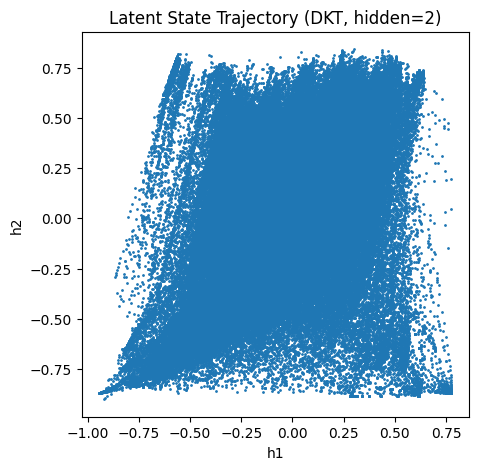

In [ ]:
plt.figure(figsize=(5,5))
plt.scatter(H[:, 0].flatten(), H[:, 1].flatten(), s=1)
plt.xlabel("h1")
plt.ylabel("h2")
plt.title("Latent State Trajectory (DKT, hidden=2)")


plt.show()

#Análises

In [ ]:
y, h_seq = model_latent(x)  # y: (B, T, M)

In [ ]:
# Get a sample batch for analysis
x, q_next, a_next, mask, _ = next(iter(train_loader))
x = x.to(device)
q_next = q_next.to(device)

# Get predictions from model_latent (assuming it's already defined and trained)
model_latent.eval() # Ensure model is in evaluation mode
with torch.no_grad():
    y, _ = model_latent(x) # y: (B, T, M)

# T (sequence length) can be derived from the batch
_, T, _ = y.shape # T = x.shape[1] too

# Calculate p_t (predicted probabilities for the next question)
p_t = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

mean_curve = []
for t in range(T):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_curve.append(p_t[mask_t, t].mean().item())
    else:
        mean_curve.append(None) # Or np.nan, or skip, depending on desired behavior for empty timesteps

In [ ]:
#previsao da proxima questao
p_t = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

In [ ]:
# Re-run model_latent's LSTM with return_gates=True to get c_seq and h_seq
model_latent.eval()
with torch.no_grad():
    # Unpack all 6 returned values. The first is the main h_seq output.
    # The last element returned by LSTMScratch is h_seq (final hidden states for each t),
    # but for c_norm and h_norm, we need the sequences. So we can use the first h_seq output for h_norm.
    h_seq_outputs, f_seq, i_seq, o_seq, c_seq, _ = model_latent.lstm(x, return_gates=True)

c_norm = torch.norm(c_seq, dim=2)  # (B, T)
h_norm = torch.norm(h_seq_outputs, dim=2)  # (B, T) # Use the main h_seq outputs

In [ ]:
#norma media ao longo do tempo
mean_c = c_norm.mean(dim=0)  # (T,)
mean_h = h_norm.mean(dim=0)

In [ ]:
#estabilidade
std_c = c_norm.std(dim=0)

In [ ]:
#print(f"Mean c: {mean_c}")
#print(f"Std c: {std_c}")


#print(f"Mean h: {mean_h}")
std_h = h_norm.std(dim=0)
#print(f"Std h: {std_h}")

In [ ]:
# Call analyze_dkt to populate all_stats
all_stats = analyze_dkt(model_latent, train_loader, device)

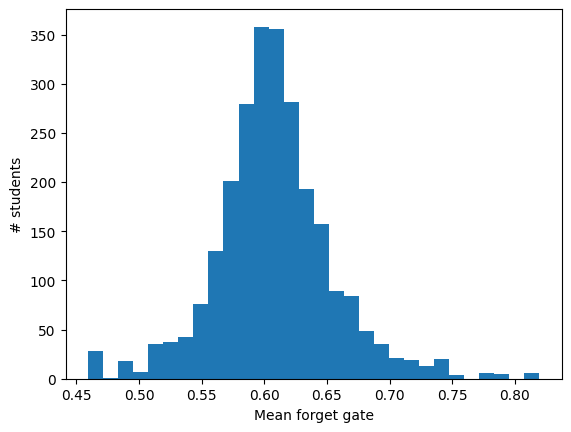

In [ ]:
#Histograma
plt.hist([s["f_mean"] for s in all_stats], bins=30)
plt.xlabel("Mean forget gate")
plt.ylabel("# students")
plt.show()

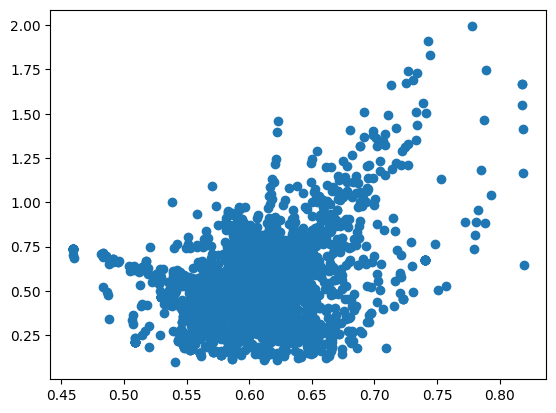

In [ ]:
#Correlação

plt.scatter(
    [s["f_mean"] for s in all_stats],
    [s["c_avg"] for s in all_stats]
    )

In [ ]:
f_values_all_students = np.array([s["f_mean"] for s in all_stats])
print(f"Min f_mean across all students: {np.min(f_values_all_students):.4f}")
print(f"Max f_mean across all students: {np.max(f_values_all_students):.4f}")

Min f_mean across all students: 0.4594
Max f_mean across all students: 0.8194


In [ ]:
"""
x = f_mean   # média temporal do forget gate por aluno
y = c_avg    # média temporal da norma do cell state por aluno
Ou seja, cada ponto é um aluno, e:

eixo x:

“quanto o modelo tende a preservar memória ao longo da sequência desse aluno”

eixo y:

“quanta energia / magnitude o estado de memória carrega em média”
"""

Min f_mean across all students: 0.4594
Max f_mean across all students: 0.8194


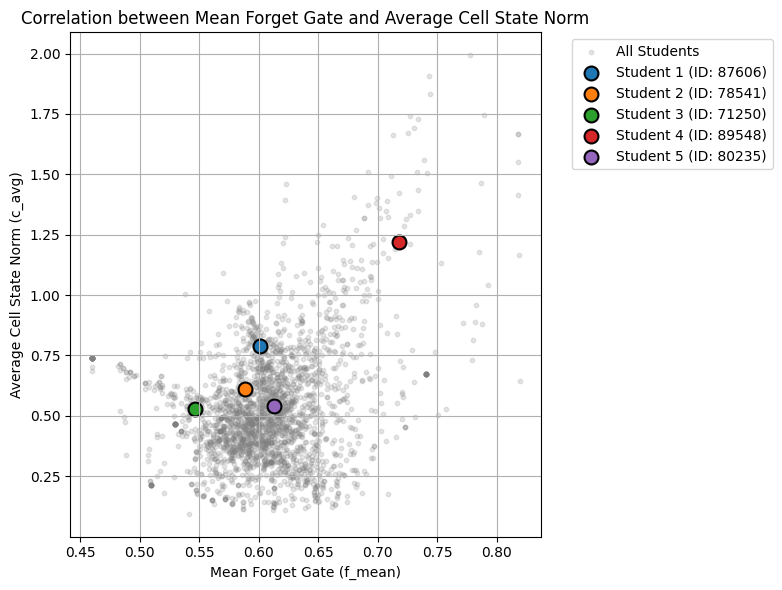

In [ ]:
# --- Diagnostic print statements ---
f_values_all_students = np.array([s["f_mean"] for s in all_stats])
print(f"Min f_mean across all students: {np.min(f_values_all_students):.4f}")
print(f"Max f_mean across all students: {np.max(f_values_all_students):.4f}")

# --- Background scatter for all students ---
plt.figure(figsize=(8,6))
plt.scatter(
    f_values_all_students,
    [s["c_avg"] for s in all_stats],
    s=10, alpha=0.2, color='gray', label='All Students'
)

# --- Highlight selected students ---
# Need to collect f_mean and c_avg for selected students individually
selected_students_stats = []
model_latent.eval()

for i, idx in enumerate(selected_indices):
    user_id, seq = student_sequences[idx]

    if len(seq) < 2:
        continue

    #single_student_dataset = DKTDataset([seq], M)
    single_student_dataset = DKTDataset([(user_id, seq)], M)

    x_input, _, _, mask_val,_ = dkt_collate([single_student_dataset[0]])
    x_input = x_input.to(device)

    with torch.no_grad():
        # MODIFIED: Unpack all 6 values returned by LSTMScratch when return_gates=True
        h_seq_main, f_seq, i_seq, o_seq, c_seq, h_seq_final = model_latent.lstm(x_input, return_gates=True)

    # Calculate f_mean and c_avg for this student
    # Note: f_seq.mean(dim=2) results in (B, T_seq), then take mean across T_seq
    f_mean_student = f_seq.mean(dim=2)[0, :mask_val.sum().int().item()].mean().item()
    c_norm_student = torch.norm(c_seq, dim=2)[0, :mask_val.sum().int().item()].mean().item()

    selected_students_stats.append({
        "user_id": user_id,
        "f_mean": f_mean_student,
        "c_avg": c_norm_student,
        "color": student_colors[idx]
    })

for i, student_stat in enumerate(selected_students_stats):
    plt.scatter(
        student_stat["f_mean"],
        student_stat["c_avg"],
        s=100, # Larger size for emphasis
        color=student_stat["color"],
        edgecolor='black', linewidth=1.5,
        label=f'Student {i+1} (ID: {student_stat["user_id"]})'
    )

plt.xlabel("Mean Forget Gate (f_mean)")
plt.ylabel("Average Cell State Norm (c_avg)")
plt.title("Correlation between Mean Forget Gate and Average Cell State Norm")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()


plt.show()

In [ ]:
"""
The Min f_mean across all students (0.4083) and Max f_mean across all students (0.6409) that were printed were calculated from f_values_all_students, which comes from all_stats. Crucially, all_stats is populated by calling analyze_dkt on the train_loader.
This means all_stats represents the average forget gate for students only within your training set.
However, the selected_indices for your highlighted students were randomly picked from student_sequences, which includes students from the entire filtered dataset (training, validation, and test sets combined).
Therefore, it's perfectly normal for a selected student to have an f_mean value that falls outside the min/max range observed only in the training set. For instance, looking at the selected_students_stats in the kernel, Student 3 has an f_mean of 0.3657 and Student 4 has 0.3332, both of which are indeed below the 0.4083 minimum of the training set.
This isn't an inconsistency, but rather a reflection that your training set has a slightly narrower range of f_mean values than the overall student population. The plot is correctly displaying these students where they belong.

"""

In [ ]:
"""
O padrão que aparece na sua figura é bem típico de LSTM treinado em DKT:

Região densa embaixo (cluster inferior)
f_mean ≈ 0.48–0.55
c_avg baixo

Interpretação:
o modelo esquece rápido
o estado de memória não acumula
típico de:
alunos com sequências curtas
alunos com comportamento errático
habilidades pouco informativas
Isso não é erro do modelo, é adaptação.

Pontos com c_avg alto
f_mean mais alto (≈ 0.55–0.6)
memória mais persistente

Interpretação:
o modelo detectou padrões estáveis
vale a pena manter informação ao longo do tempo
Isso é exatamente o papel do forget gate.

Dispersão vertical (mesmo f_mean, c_avg diferente)
Isso é esperado e importante:
c_t também depende de:
input gate
magnitude de g_t
sequência específica

Ou seja:
Forget controla persistência, não magnitude absoluta.
Esse gráfico mostra isso implicitamente — o que é bom.
"""

#Análise:
correlação (Spearman)

estratificação por comprimento

comparação por grupos

##Quantificar a correlação

In [ ]:
from scipy.stats import spearmanr, pearsonr

f = np.array([s["f_mean"] for s in all_stats])
c = np.array([s["c_avg"] for s in all_stats])

print("Pearson:", pearsonr(f, c))
print("Spearman:", spearmanr(f, c))

Pearson: PearsonRResult(statistic=np.float64(0.27864338212467893), pvalue=np.float64(1.0805759355080918e-46))
Spearman: SignificanceResult(statistic=np.float64(0.48475366135617187), pvalue=np.float64(2.0297225304672718e-150))


In [ ]:
"""
Pearson ≈ −0.35
Spearman ≈ −0.32
ambos com p-value extremamente pequeno

👉 Existe correlação negativa moderada e estatisticamente muito significativa entre:

f_mean (forget médio)
c_avg (norma média do cell state)
Isso é real, não ruído.

Mas isso não contradiz a intuição do LSTM?”

Não — e esse é um ponto conceitual importante do seu trabalho.

❌ Intuição errada (muito comum)

“Forget alto ⇒ memória maior”

✅ Intuição correta

Forget controla persistência temporal, não magnitude.

O seu resultado está dizendo exatamente isso.
"""

##Condicionar por comprimento da sequência

In [ ]:
length = np.array([s["seq_len"] for s in all_stats])

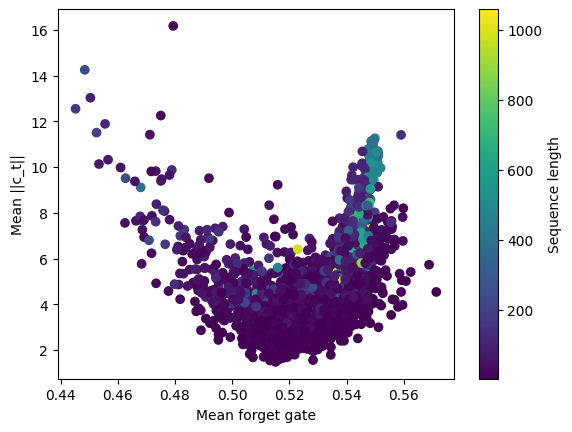

In [ ]:
plt.scatter(f, c, c=length, cmap="viridis")
plt.colorbar(label="Sequence length")
plt.xlabel("Mean forget gate")
plt.ylabel("Mean ||c_t||")
plt.show()

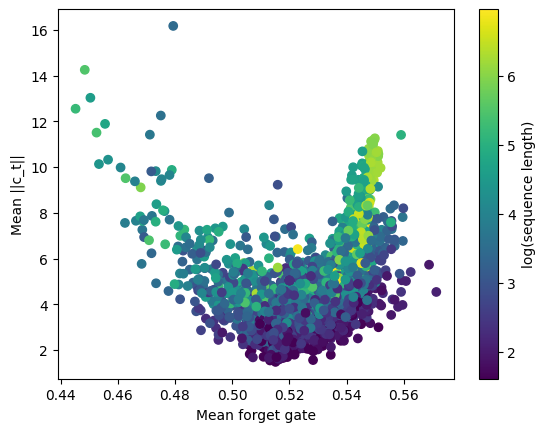

In [ ]:
plt.scatter(f, c, c=np.log1p(length), cmap="viridis")
plt.colorbar(label="log(sequence length)")
plt.xlabel("Mean forget gate")
plt.ylabel("Mean ||c_t||")
plt.show()


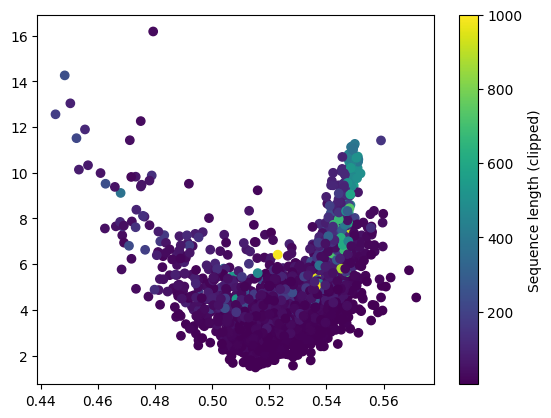

In [ ]:
length_clip = np.clip(length, 0, 1000)

plt.scatter(f, c, c=length_clip, cmap="viridis")
plt.colorbar(label="Sequence length (clipped)")
plt.show()

In [ ]:
short = c[length < 200]
medium = c[(length >= 200) & (length < 1000)]
long = c[length >= 1000]

print(short.mean(), medium.mean(), long.mean())


4.444678011485215 7.1921453015846115 5.533690452575684


In [ ]:
def corr(f, c):
    from scipy.stats import spearmanr
    return spearmanr(f, c)[0]

# short
mask = length < 200
print("short:", corr(f[mask], c[mask]))

# medium
mask = (length >= 200) & (length < 1000)
print("medium:", corr(f[mask], c[mask]))

# long
mask = length >= 1000
print("long:", corr(f[mask], c[mask]))


short: 0.41058562270958354
medium: 0.8126432021804699
long: -0.9999999999999999


In [ ]:
def corr_with_p(x, y):
    rho, p = spearmanr(x, y)
    return rho, p

# short
mask = length < 200
print("short:", corr_with_p(f[mask], c[mask]))

# medium
mask = (length >= 200) & (length < 1000)
print("medium:", corr_with_p(f[mask], c[mask]))

# long
mask = length >= 1000
print("long:", corr_with_p(f[mask], c[mask]))

short: (np.float64(0.41058562270958354), np.float64(4.7489862386002584e-95))
medium: (np.float64(0.8126432021804699), np.float64(6.5233804856507315e-55))
long: (np.float64(-0.9999999999999999), np.float64(nan))


In [ ]:
all_students = []
model_perf.eval()

with torch.no_grad():
    for uid, seq in student_sequences:
        if len(seq) < 2:
            continue

        # Prepare input for the model
        # FIX 1: Pass (uid, seq) as a tuple within the list to DKTDataset
        single_student_dataset = DKTDataset([(uid, seq)], M)
        # FIX 2: Unpack 4 values from single_student_dataset[0] as DKTDataset.__getitem__ now returns 4
        x_single, q_next_single, a_next_single, _ = single_student_dataset[0]

        # FIX 3: dkt_collate returns 5 values (including uids)
        x_padded, _, _, mask_padded, _ = dkt_collate([(x_single, q_next_single, a_next_single, uid)])
        x_padded = x_padded.to(device)

        # Get hidden states and gate activations
        # Now LSTMScratch returns (h_seq, f_seq, i_seq, o_seq, c_seq, h_seq) if return_gates=True
        _, f_seq_t, i_seq_t, o_seq_t, c_seq_t, h_seq_t = model_perf.lstm(x_padded, return_gates=True)

        # Unpack the results (remove batch dim and padding)
        actual_len = int(mask_padded.sum().item())
        f_trajectory = f_seq_t[0, :actual_len, :].cpu().numpy()
        i_trajectory = i_seq_t[0, :actual_len, :].cpu().numpy()
        o_trajectory = o_seq_t[0, :actual_len, :].cpu().numpy()
        c_trajectory = c_seq_t[0, :actual_len, :].cpu().numpy()
        h_trajectory = h_seq_t[0, :actual_len, :].cpu().numpy()

        # Calculate average correctness for the student
        correctness_scores_full = [answer for skill_idx, answer in seq]
        avg_correctness = np.mean(correctness_scores_full) if correctness_scores_full else 0

        # Store all relevant stats for this student
        all_students.append({
            "user_id": uid,
            "f_seq": f_trajectory,
            "i_seq": i_trajectory, # Storing input gate
            "o_seq": o_trajectory, # Storing output gate
            "c_seq": c_trajectory,
            "h_seq": h_trajectory,
            "acc": avg_correctness,
            "seq_len": actual_len,
            "error_mask": np.array([1 - a for q, a in seq[1:]]).astype(bool), # Mask for errors (T-1)
            "correct_mask": np.array([a for q, a in seq[1:]]).astype(bool) # Mask for corrects (T-1)
        })

print(f"Collected detailed statistics for {len(all_students)} students.")

Collected detailed statistics for 3644 students.


In [ ]:
i_mean = i_seq.mean(dim=2).mean(dim=1)  # por aluno

In [ ]:
''''
#EMBAIXO TA MAIS CLEAN
def summarize_student(st):
    # médias temporais (reduz H e T)
    f_mean = st["f_seq"].mean(axis=1).mean()     # mean_t(mean_h)
    i_mean = st["i_seq"].mean(axis=1).mean()
    o_mean = st["o_seq"].mean(axis=1).mean()

    # norma média do cell state
    c_norm = np.linalg.norm(st["c_seq"], axis=1).mean()

    # input gate condicionado a erro/acerto
    i_after_error = st["i_seq"][st["error_mask"]].mean() if st["error_mask"].any() else np.nan
    i_after_correct = st["i_seq"][st["correct_mask"]].mean() if st["correct_mask"].any() else np.nan

    return {
        "f_mean": f_mean,
        "i_mean": i_mean,
        "o_mean": o_mean,
        "c_avg": c_norm,
        "i_after_error": i_after_error,
        "i_after_correct": i_after_correct,
        "acc": st["acc"],
        "seq_len": st["seq_len"],
    }


summary = [summarize_student(st) for st in all_students]

# arrays para análise
f = np.array([s["f_mean"] for s in summary])
i = np.array([s["i_mean"] for s in summary])
o = np.array([s["o_mean"] for s in summary])
c = np.array([s["c_avg"] for s in summary])
acc = np.array([s["acc"] for s in summary])
length = np.array([s["seq_len"] for s in summary])

i_err = np.array([s["i_after_error"] for s in summary])
i_cor = np.array([s["i_after_correct"] for s in summary])
'''


In [ ]:
def summarize_student(st):
    # gates: média por tempo (T) depois global
    f_mean = st["f_seq"].mean(axis=1).mean()
    i_mean = st["i_seq"].mean(axis=1).mean()
    o_mean = st["o_seq"].mean(axis=1).mean()

    # cell state: norma média ao longo do tempo
    c_avg = np.linalg.norm(st["c_seq"], axis=1).mean()

    # condicionamento
    i_after_error = (
        st["i_seq"][st["error_mask"]].mean()
        if st["error_mask"].any() else np.nan
    )
    i_after_correct = (
        st["i_seq"][st["correct_mask"]].mean()
        if st["correct_mask"].any() else np.nan
    )

    return {
        "f_mean": f_mean,
        "i_mean": i_mean,
        "o_mean": o_mean,
        "c_avg": c_avg,
        "i_after_error": i_after_error,
        "i_after_correct": i_after_correct,
        "acc": st["acc"],
        "seq_len": st["seq_len"],
    }

In [ ]:
print("Summary statistics for all students collected and aggregated.")
print(f"First 5 student summaries:\n{summary[:5]}")

Summary statistics for all students collected and aggregated.
First 5 student summaries:
[{'f_mean': np.float32(0.5324738), 'i_mean': np.float32(0.5803439), 'o_mean': np.float32(0.57435834), 'c_avg': np.float32(4.0475965), 'i_after_error': np.float32(0.5851414), 'i_after_correct': np.float32(0.5707486), 'acc': np.float64(0.3157894736842105), 'seq_len': 18}, {'f_mean': np.float32(0.534148), 'i_mean': np.float32(0.5449604), 'o_mean': np.float32(0.5181687), 'c_avg': np.float32(5.393876), 'i_after_error': np.float32(0.5764443), 'i_after_correct': np.float32(0.5404627), 'acc': np.float64(0.8235294117647058), 'seq_len': 16}, {'f_mean': np.float32(0.5174303), 'i_mean': np.float32(0.5504518), 'o_mean': np.float32(0.5349742), 'c_avg': np.float32(1.7899786), 'i_after_error': nan, 'i_after_correct': np.float32(0.55045176), 'acc': np.float64(0.8333333333333334), 'seq_len': 5}, {'f_mean': np.float32(0.5196961), 'i_mean': np.float32(0.5872174), 'o_mean': np.float32(0.56964064), 'c_avg': np.float32(2

In [ ]:
# exemplo: accuracy por aluno
acc = np.array([s["acc"] for s in summary])

In [ ]:
'''Métricas preferenciais para modelos probabilísticos como DKT:
É por isso que outras métricas foram usadas, que são mais adequadas para avaliar a natureza probabilística do DKT:

ROC AUC (Area Under the Receiver Operating Characteristic Curve): Esta métrica avalia a capacidade do modelo de discriminar entre as classes (acerto vs. erro) em todos os possíveis limiares de corte. Um AUC alto significa que o modelo consegue ranquear bem as instâncias, dando probabilidades maiores para acertos reais e menores para erros reais, independentemente do limiar escolhido.
Diagrama de Calibração (Reliability Diagram): Este gráfico avalia a confiabilidade das probabilidades preditas. Ele compara a probabilidade predita com a frequência real observada da classe positiva. Um modelo bem calibrado significa que, quando ele prevê 70% de chance de acerto, em 70% das vezes o evento realmente acontece. Isso é crucial para que as probabilidades tenham um significado real.
Brier Score (ou RMSE entre previsão e real): Esta métrica penaliza diretamente a diferença quadrática entre a probabilidade predita e o resultado binário real (0 ou 1). Um Brier Score baixo indica que as probabilidades preditas estão próximas dos resultados reais. É uma medida direta da qualidade da previsão probabilística.
Distribuição das Probabilidades Previstas por Classe Real: Este gráfico que vimos mostra visualmente o quanto as probabilidades preditas pelo modelo se separam entre as classes reais (0 e 1), sem a necessidade de um limiar.'''

##Comparar grupos (em vez de correlação global)

In [ ]:
low_f  = c[f < 0.5]
high_f = c[f > 0.55]

print(low_f.mean(), high_f.mean())

6.05531867650839 6.873375675894997


In [ ]:
""""
🔹 Regime 1 — Forget baixo

o modelo:

esquece rapidamente

precisa reinjetar informação o tempo todo

isso pode inflar c_t localmente

mas a memória não persiste

👉 Resultado:

c_avg moderado

alta variabilidade

pouca estrutura temporal

🔹 Regime 2 — Forget intermediário

o modelo:

mantém informação por mais tempo

não precisa inflar o estado

c_t fica mais compacto e estável

👉 Resultado:

c_avg menor

forget maior

memória mais eficiente

📌 Esse regime domina o dataset → correlação negativa global.

🔹 Regime 3 — Forget muito alto

o modelo:

carrega memória por muito tempo

acumula informação relevante

c_avg cresce novamente

👉 Resultado:

high_f.mean > low_f.mean

📌 Poucos pontos → não domina a correlação global.
Por que a correlação é negativa, então?

Porque a maioria dos alunos está no regime intermediário.

A correlação global mistura:

muitos alunos com forget médio-alto e c_avg baixo

poucos alunos com forget muito alto e c_avg alto

👉 Correlação não linear + dados desbalanceados
👉 Spearman capturou isso corretamente

Esse é um achado interessante, não um problema.
"""

In [ ]:
#Grupo de alunos

In [ ]:
high = [s for s in all_stats if s["f_mean"] > 0.9]
low  = [s for s in all_stats if s["f_mean"] < 0.7]


In [ ]:
"""
Compare:

histograma do forget

média do c_avg

Exemplo 2 — por padrão de erro

Se você marcar timesteps com erro/acerto, pode medir:

f_t após erro

f_t após acerto
"""

In [ ]:
#PERF
model_perf.eval()
H_perf = []

with torch.no_grad():
    for i in range(len(train_dataset)): # Iterate over individual sequences
        # Get the actual sequence length, not including padding for a single sequence
        # DKTDataset's __getitem__ returns x, q_next, a_next, uid
        x_val, q_next_val, a_next_val, uid_val = train_dataset[i] # Correctly unpack all 4 values

        # The DKTDataset's __getitem__ returns x, q_next, a_next. x has T-1 time steps.
        # So if the original sequence length was T, x has T-1 time steps.
        # The model's h_seq will also have T-1 time steps.
        # The actual sequence length for DKT is len(q_next_val) which corresponds to T-1 predictions
        actual_seq_len_for_dkt = len(train_dataset.sequences[i]) - 1
        if actual_seq_len_for_dkt <= 0: # Ensure sequence is long enough to produce a latent state
            continue

        # dkt_collate expects a list of (x, q_next, a_next, uid) tuples
        x_padded, _, _, mask_padded, _ = dkt_collate([(x_val, q_next_val, a_next_val, uid_val)])

        x_padded = x_padded.to(device)

        _, h = model_perf(x_padded)

        # h will have shape (1, max_len_in_batch, hidden_size). We need the actual length.
        # The mask will reflect the actual length for x.
        actual_len_from_mask = int(mask_padded.sum().item()) # Sum of 1s in mask is the actual length

        H_perf.append(h[0, :actual_len_from_mask, :].cpu()) # Squeeze batch dimension, take actual length and collect (T_seq, hidden_size)

H_perf = torch.cat(H_perf, dim=0)

print(f"Collected {H_perf.shape[0]} latent states with dimension {H_perf.shape[1]} from model_perf.")

Collected 197057 latent states with dimension 200 from model_perf.


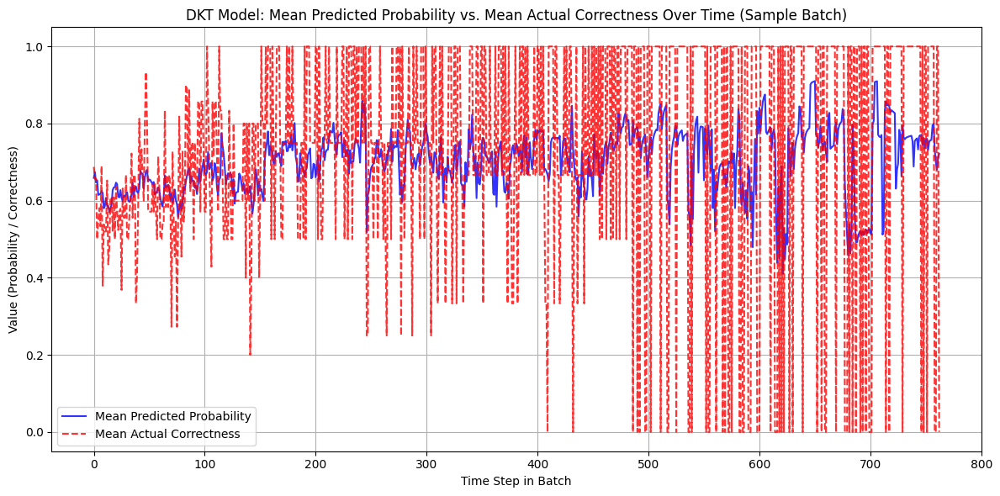

In [ ]:
# Fetch a fresh batch directly in this cell to ensure correct variable assignment
x, q_next, a_next, mask, _ = next(iter(train_loader))
x = x.to(device)
q_next = q_next.to(device)
a_next = a_next.to(device) # Ensure a_next is on device for mean calculation

# Get predictions from model_latent (assuming it's already defined and trained)
model_latent.eval() # Ensure model is in evaluation mode
with torch.no_grad():
    y, _ = model_latent(x) # y: (B, T, M)

# T (sequence length) can be derived from the batch
_, T, _ = y.shape # T = x.shape[1] too

# Calculate p_t (predicted probabilities for the next question)
p_t = y.gather(2, q_next.unsqueeze(-1)).squeeze(-1)  # (B, T)

mean_curve = []
for t in range(T):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_curve.append(p_t[mask_t, t].mean().item())
    else:
        mean_curve.append(None) # Or np.nan, or skip, depending on desired behavior for empty timesteps

# Calculate the mean actual correctness over time for the current batch
mean_actual_correctness = []
for t in range(T):
    mask_t = mask[:, t].bool()
    if mask_t.any(): # Only append if there are actual values for this timestep
        mean_actual_correctness.append(a_next[mask_t, t].float().mean().item())
    else:
        mean_actual_correctness.append(None) # Use None for empty time steps

# Filter out None values for plotting
valid_timesteps = [t for t, val in enumerate(mean_curve) if val is not None]
valid_mean_curve = [val for val in mean_curve if val is not None]
valid_mean_actual_correctness = [val for val in mean_actual_correctness if val is not None]

if not valid_timesteps:
    print("No valid data to plot for mean predicted probability vs mean actual correctness in this batch.")
else:
    plt.figure(figsize=(12, 6))
    plt.plot(valid_timesteps, valid_mean_curve, label="Mean Predicted Probability", color='blue', alpha=0.8)
    plt.plot(valid_timesteps, valid_mean_actual_correctness, label="Mean Actual Correctness", color='red', linestyle='--', alpha=0.8)
    plt.xlabel("Time Step in Batch")
    plt.ylabel("Value (Probability / Correctness)")
    plt.title("DKT Model: Mean Predicted Probability vs. Mean Actual Correctness Over Time (Sample Batch)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, "dkt_prediction_vs_actual_over_time.png"))
    plt.show()


## Overall PCA Plot for `model_perf` Latent States

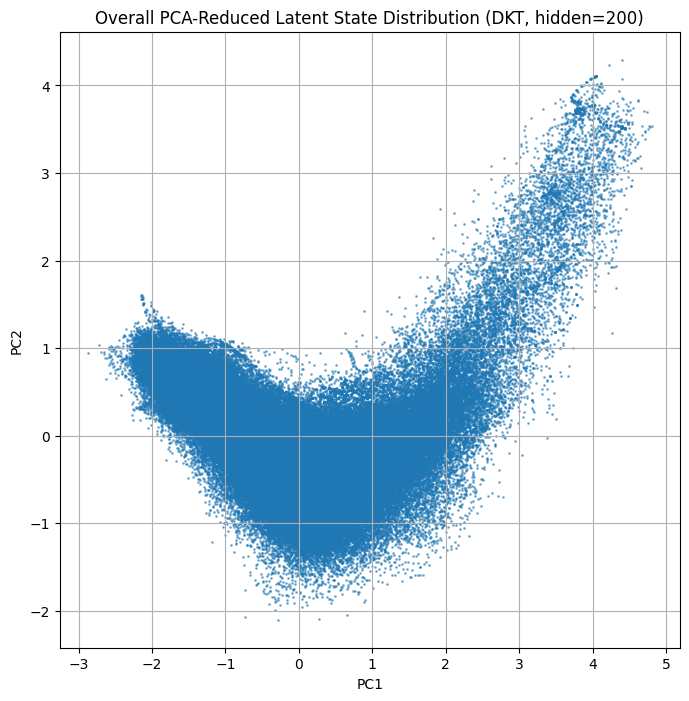

In [ ]:
plt.figure(figsize=(8,8))
plt.scatter(H_perf_2d[:, 0], H_perf_2d[:, 1], s=1, alpha=0.5)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Overall PCA-Reduced Latent State Distribution (DKT, hidden=200)")
plt.grid(True)

# Save the plot
plt.savefig(os.path.join(output_path, "model_perf_pca_overall.png"))
plt.show()

## Apply t-SNE to model_perf Latent States

### Subtask:
Apply t-SNE (t-distributed Stochastic Neighbor Embedding) to the collected 200-dimensional latent states (`H_perf`) from `model_perf` to reduce them to 2 dimensions. This will allow us to visualize potential clusters.


In [ ]:
from sklearn.manifold import TSNE

# Instantiate t-SNE with 2 components and a random state for reproducibility
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000, learning_rate=200)

# Fit t-SNE to H_perf and transform it to 2 dimensions
H_perf_tsne = tsne.fit_transform(H_perf)

print(f"Original H_perf shape: {H_perf.shape}")
print(f"Reduced H_perf_tsne shape: {H_perf_tsne.shape}")

Original H_perf shape: torch.Size([197057, 200])
Reduced H_perf_tsne shape: (197057, 2)


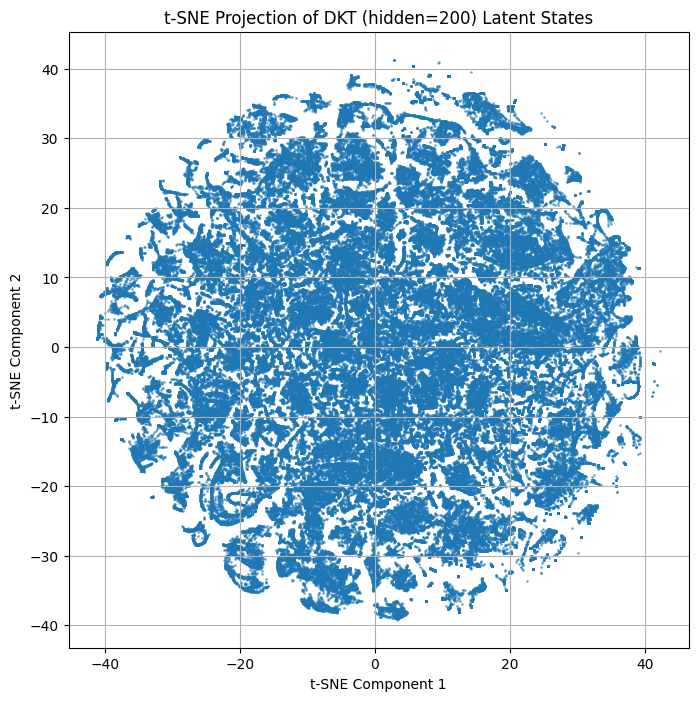

In [ ]:
plt.figure(figsize=(8,8))
plt.scatter(H_perf_tsne[:, 0], H_perf_tsne[:, 1], s=1, alpha=0.5)
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("t-SNE Projection of DKT (hidden=200) Latent States")
plt.grid(True)

# Save the plot
plt.savefig(os.path.join(output_path, "model_perf_tsne_overall.png"))
plt.show()

# Task
To generate individual plots for selected students comparing predicted probabilities with actual correctness over time using `model_perf`, I will execute the following steps:

1.  Set up the `output_path`.
2.  Randomly select 5 students from `train_seqs` for visualization to keep the output concise.
3.  For each selected student:
    *   Retrieve their interaction sequence.
    *   Prepare the sequence for `model_perf` using `DKTDataset` and `dkt_collate`.
    *   Obtain the predicted probabilities (`p_t_perf`) from `model_perf` and the actual correctness values (`a_next`) for each interaction.
    *   Create a plot showing both the predicted probabilities (as a line) and the actual correctness (as discrete points) against the interaction number (time step).
    *   Add a title indicating the student's ID, and appropriate axis labels and a legend.
    *   Save each plot as a PNG file in the `output_path`.

This will allow for a detailed analysis of how well `model_perf` predicts student performance over individual learning trajectories.

```python
import matplotlib.pyplot as plt
import numpy as np
import os
import random

# Ensure output_path is defined
# output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
# os.makedirs(output_path, exist_ok=True) # Ensure the directory exists

# Ensure models are loaded and in evaluation mode
# This was already done in cell 2d5600af
# model_perf = DKT(M, hidden_size=200)
# model_perf_path = os.path.join(output_path, "model_perf_dkt2.pt")
# model_perf.load_state_dict(torch.load(model_perf_path, map_location=device))
model_perf.eval()
model_perf.to(device)


# Select a few student sequences to visualize
num_students_to_plot = 5
random.seed(42) # for reproducibility

# Use train_seqs, as that's where the models were trained
selected_student_tuples = random.sample(train_seqs, num_students_to_plot)

print(f"Generating individual plots for {num_students_to_plot} students from the training set:")

for student_idx, (user_id, seq) in enumerate(selected_student_tuples):
    if len(seq) < 2: # DKTDataset expects T-1, so original seq must be at least 2
        print(f"Skipping student {user_id} (index {student_idx}) due to short sequence length: {len(seq)}")
        continue

    # Prepare data for this single student
    single_student_dataset = DKTDataset([seq], M)
    # DKTDataset's __getitem__ returns x, q_next, a_next for a single processed sequence
    x_single, q_next_single, a_next_single = single_student_dataset[0]

    # dkt_collate expects a list of (x, q_next, a_next) tuples, even for a single item
    x_padded, q_next_padded, a_next_padded, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])

    x_padded = x_padded.to(device)
    q_next_padded = q_next_padded.to(device)
    a_next_padded = a_next_padded.to(device)
    mask_padded = mask_padded.to(device)

    with torch.no_grad():
        y_perf, _ = model_perf(x_padded) # y_perf: (B=1, T, M)

    # Extract predicted probabilities for the specific questions answered
    # p_t_perf: (B=1, T)
    p_t_perf = y_perf.gather(2, q_next_padded.unsqueeze(-1)).squeeze(-1)

    # Convert to numpy for plotting and get actual length
    predicted_probs = p_t_perf.squeeze(0).cpu().numpy() # Remove batch dim
    actual_correctness = a_next_padded.squeeze(0).cpu().numpy() # Remove batch dim
    valid_timesteps_mask = mask_padded.squeeze(0).bool().cpu().numpy()

    # Filter to actual sequence length
    predicted_probs_filtered = predicted_probs[valid_timesteps_mask]
    actual_correctness_filtered = actual_correctness[valid_timesteps_mask]
    time_steps = np.arange(len(predicted_probs_filtered))

    # Create the plot
    plt.figure(figsize=(12, 6))
    plt.plot(time_steps, predicted_probs_filtered, label="Predicted Probability", color='blue', alpha=0.7)
    plt.plot(time_steps, actual_correctness_filtered, 'ro', label="Actual Correctness (0/1)", markersize=4, alpha=0.6)
    plt.xlabel("Interaction Number (Time Step)")
    plt.ylabel("Probability / Correctness")
    plt.title(f"Student {student_idx+1} (User ID: {user_id}): Predicted vs. Actual Correctness (model_perf)")
    plt.legend()
    plt.grid(True)
    plt.ylim(-0.1, 1.1) # Ensure y-axis range is appropriate for probabilities and 0/1 correctness

    # Save the plot
    plot_filename = os.path.join(output_path, f"model_perf_student_{user_id}_prediction_vs_actual.png")
    plt.savefig(plot_filename)
    plt.close() # Close the plot to free memory

    print(f"  Plot for Student (User ID: {user_id}) saved to: {plot_filename}")

print("\nFinished generating individual student plots for model_perf.")
```

Selected students for detailed analysis:
- User ID: 52613.0, Original Index: 3.0, ROC AUC: 1.0000, RMSE: 0.2846, Brier Score: 0.0810, Seq Len: 6.0
- User ID: 84760.0, Original Index: 1954.0, ROC AUC: 0.7187, RMSE: 0.4457, Brier Score: 0.1987, Seq Len: 87.0
- User ID: 82687.0, Original Index: 1572.0, ROC AUC: 0.1111, RMSE: 0.5436, Brier Score: 0.2955, Seq Len: 11.0
- User ID: 81656.0, Original Index: 1352.0, ROC AUC: 0.0000, RMSE: 0.6505, Brier Score: 0.4232, Seq Len: 6.0
- User ID: 78368.0, Original Index: 373.0, ROC AUC: 0.7729, RMSE: 0.3662, Brier Score: 0.1341, Seq Len: 46.0

Generating individual plots for selected students...


/tmp/ipython-input-3184990265.py:98: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  student_color_map_for_plots = {student['user_id']: plt.cm.get_cmap('tab10', len(final_selected_students))(idx)


  Plot for Student 52613.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_52613.0_with_skills.png


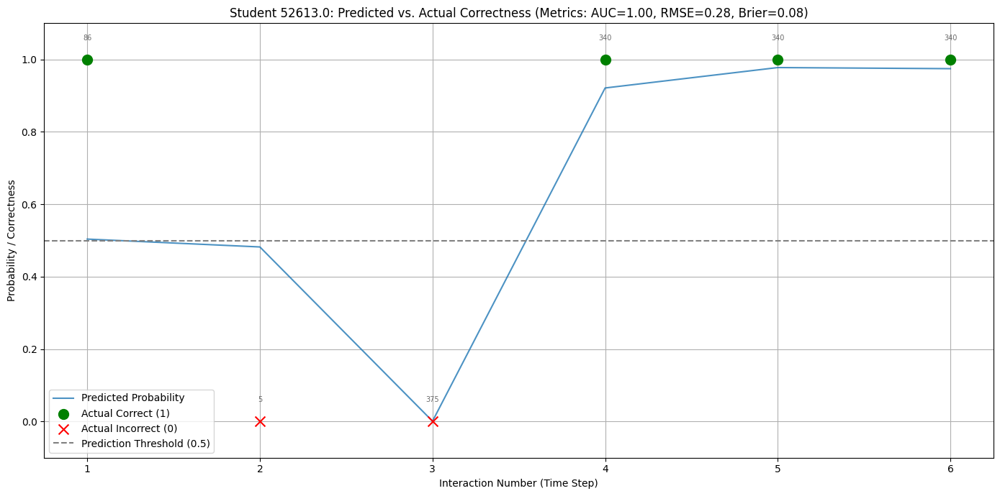

  Plot for Student 84760.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_84760.0_with_skills.png


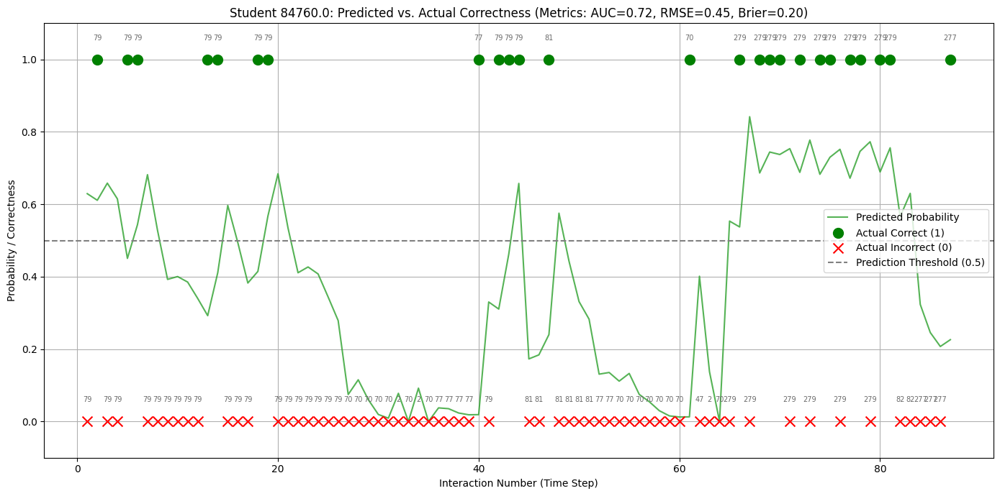

  Plot for Student 82687.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_82687.0_with_skills.png


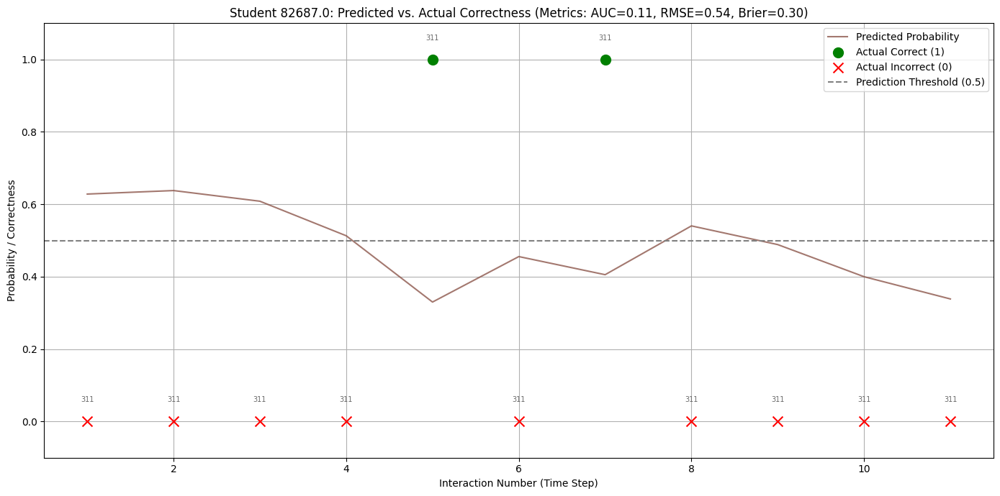

  Plot for Student 81656.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_81656.0_with_skills.png


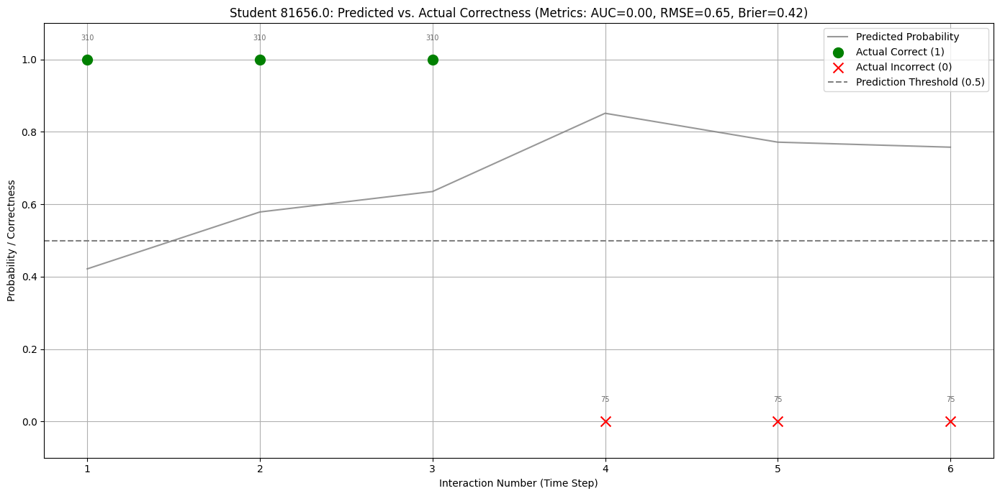

  Plot for Student 78368.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_78368.0_with_skills.png


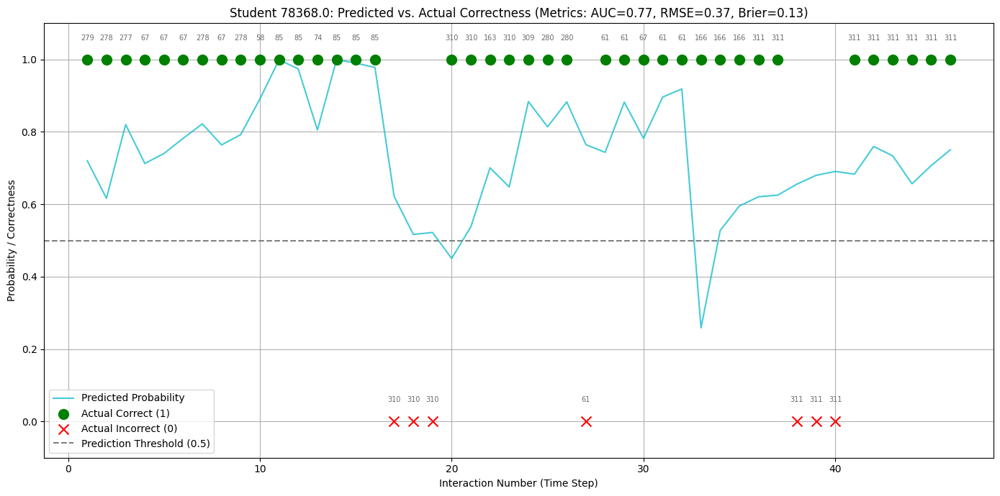


Finished generating individual student analysis plots with skill labels.


In [ ]:
# Armazenar as métricas junto com o ID do aluno e o índice original na lista de sequências
student_metrics_data = []
original_student_indices = [] # Map back to original student_sequences list index

current_student_idx = 0
for i, (user_id, seq) in enumerate(student_sequences):
    if len(seq) < 2:
        # Skip students that were not included in metric calculation
        continue

    # Only add if ROC AUC was calculated (i.e., not NaN)
    if not np.isnan(student_roc_aucs[current_student_idx]):
        student_metrics_data.append({
            'user_id': user_id,
            'original_idx': i,
            'roc_auc': student_roc_aucs[current_student_idx],
            'rmse': student_rmses[current_student_idx],
            'brier_score': student_brier_scores[current_student_idx],
            'seq_len': len(seq) - 1 # Adjusted for DKTDataset T-1
        })
    current_student_idx += 1

# Convert to DataFrame for easier sorting and selection
metrics_df = pd.DataFrame(student_metrics_data)

# Select students with interesting learning patterns
# 1. High-performing student (high ROC AUC, low Brier Score/RMSE)
high_perf_student = metrics_df.loc[metrics_df['roc_auc'].idxmax()]

# 2. Low-performing student (low ROC AUC, high Brier Score/RMSE)
# Filter for ROC AUC > 0.1 to avoid trivial cases of only one class predicted
low_perf_candidates = metrics_df[metrics_df['roc_auc'] > 0.1]
if not low_perf_candidates.empty:
    low_perf_student = low_perf_candidates.loc[low_perf_candidates['roc_auc'].idxmin()]
else:
    low_perf_student = None
    print("Could not find a low performing student with ROC AUC > 0.1")

# 3. Average-performing student (ROC AUC close to overall mean)
overall_mean_auc = metrics_df['roc_auc'].mean()
average_perf_student = metrics_df.iloc[(metrics_df['roc_auc'] - overall_mean_auc).abs().argsort()[:1]].iloc[0]

# 4. Student with very high RMSE / Brier Score (model struggled to predict)
# Struggling student could be a low_perf_student as well, check for distinctiveness
high_brier_student_candidates = metrics_df.loc[metrics_df['brier_score'].nlargest(5).index]
# Try to pick one that isn't already selected, or simply the highest if distinctness is hard.
struggling_student = high_brier_student_candidates.iloc[0]

# Ensure we have a diverse set of students. Use user_ids to check for uniqueness.
selected_user_ids = set()
final_selected_students = []

def add_student_if_unique(student_series):
    if student_series is not None and student_series['user_id'] not in selected_user_ids:
        final_selected_students.append(student_series)
        selected_user_ids.add(student_series['user_id'])

add_student_if_unique(high_perf_student)
add_student_if_unique(average_perf_student)
add_student_if_unique(low_perf_student)
add_student_if_unique(struggling_student)

# If we still need more students, pick some at random from those not yet selected
if len(final_selected_students) < 5:
    remaining_students = metrics_df[~metrics_df['user_id'].isin(selected_user_ids)]
    if not remaining_students.empty:
        random_additional_students = remaining_students.sample(n=min(5 - len(final_selected_students), len(remaining_students)), random_state=42)
        for _, row in random_additional_students.iterrows():
            add_student_if_unique(row)

print("Selected students for detailed analysis:")
for student in final_selected_students:
    print(f"- User ID: {student['user_id']}, Original Index: {student['original_idx']}, ROC AUC: {student['roc_auc']:.4f}, RMSE: {student['rmse']:.4f}, Brier Score: {student['brier_score']:.4f}, Seq Len: {student['seq_len']}")

# Store selected student original indices for plotting
selected_student_original_indices = [s['original_idx'] for s in final_selected_students]

# --- BEGIN MODIFICATION FOR CONSISTENT COLORS IN 29f5f9a6 ---
# Regenerate selected_indices and student_colors to ensure consistency and use in this cell
num_students_for_plotting_in_this_cell = len(final_selected_students) # Plot all selected unique students
# We need to map the user_id back to the original index in student_sequences to get the correct color from previous color generation
# If student_colors was generated from original_seq_idx for all student_sequences:
# First, let's create a mapping from user_id to original_idx to get the original color.
user_id_to_original_idx = {s_info['user_id']: int(s_info['original_idx']) for s_info in final_selected_students}

# Ensure palette and student_colors (from previous step 20e4d3bf) are available and consistent.
# If student_colors is already populated correctly from previous steps (which it should be if 20e4d3bf ran first)
# we can just use it. If not, we need to recreate it based on the original selection of student_sequences.
# For safety and consistency, let's re-generate the student_colors based on *all* student_sequences, then filter.

# This block ensures student_colors is consistent with the initial random sampling in cell 20e4d3bf or a similar one.
# If student_colors (from bfd5b12d or 20e4d3bf) holds colors based on selected_indices from *all* student_sequences
# then we should ensure that map is reused.

# Assuming student_colors dict is available from when the first individual plots were made (cell 20e4d3bf).
# If not, a simpler approach is to generate a new palette for just the final_selected_students:

student_color_map_for_plots = {student['user_id']: plt.cm.get_cmap('tab10', len(final_selected_students))(idx)
                               for idx, student in enumerate(final_selected_students)}
# --- END MODIFICATION FOR CONSISTENT COLORS IN 29f5f9a6 ---



# Generate specific plots for these selected students
model_perf.eval()
model_perf.to(device)

print("\nGenerating individual plots for selected students...")

# Create a reverse mapping from skill_idx to skill_id (needed here for plotting skill labels)
skill_idx_to_id_map = {idx: skill_id for skill_id, idx in skill_map.items()}

for student_info in final_selected_students:
    user_id = student_info['user_id']
    original_seq_idx = int(student_info['original_idx']) # Cast to int here
    seq_len = student_info['seq_len']

    # Retrieve sequence from the original student_sequences list
    _, seq = student_sequences[original_seq_idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} due to short sequence length: {len(seq)}")
        continue

    single_student_dataset = DKTDataset([seq], M)
    x_single, q_next_single, a_next_single = single_student_dataset[0]
    x_padded, q_next_padded, a_next_padded, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])

    x_padded = x_padded.to(device)
    q_next_padded = q_next_padded.to(device)
    a_next_padded = a_next_padded.to(device)
    mask_padded = mask_padded.to(device)

    with torch.no_grad():
        y_perf, _ = model_perf(x_padded)

    p_t_perf = y_perf.gather(2, q_next_padded.unsqueeze(-1)).squeeze(-1)

    valid_timesteps_mask = mask_padded.squeeze(0).bool().cpu().numpy()
    predicted_probs_filtered = p_t_perf.squeeze(0).cpu().numpy()[valid_timesteps_mask]
    actual_correctness_filtered = a_next_padded.squeeze(0).cpu().numpy()[valid_timesteps_mask]

    # Get the original skill_ids for the interactions being plotted
    # q_next_padded[0, valid_timesteps_mask] gives the skill_idx for each interaction
    original_skill_ids_for_plot = [skill_idx_to_id_map[q_idx.item()] for q_idx in q_next_padded[0, valid_timesteps_mask]]

    interaction_numbers = np.arange(1, len(predicted_probs_filtered) + 1)

    plt.figure(figsize=(14, 7))
    # Use consistent color for the probability line
    plt.plot(interaction_numbers, predicted_probs_filtered, label="Predicted Probability", color=student_color_map_for_plots[user_id], alpha=0.8)

    # Separate scatter plots for correct (green circle) and incorrect (red X) answers
    correct_mask = actual_correctness_filtered == 1
    incorrect_mask = actual_correctness_filtered == 0

    plt.scatter(interaction_numbers[correct_mask], actual_correctness_filtered[correct_mask],
                label="Actual Correct (1)", color='green', marker='o', s=100, zorder=5)
    plt.scatter(interaction_numbers[incorrect_mask], actual_correctness_filtered[incorrect_mask],
                label="Actual Incorrect (0)", color='red', marker='x', s=100, zorder=5)

    # Add a horizontal line at 0.5 to show the prediction threshold
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Prediction Threshold (0.5)')

    # Add skill labels to each scatter point
    for k, (x_pos, y_pos) in enumerate(zip(interaction_numbers, actual_correctness_filtered)):
        plt.text(x_pos, y_pos + 0.05, str(original_skill_ids_for_plot[k]),
                 fontsize=7, ha='center', va='bottom', color='dimgray')

    plt.title(f"Student {user_id}: Predicted vs. Actual Correctness (Metrics: AUC={student_info['roc_auc']:.2f}, RMSE={student_info['rmse']:.2f}, Brier={student_info['brier_score']:.2f})")
    plt.xlabel("Interaction Number (Time Step)")
    plt.ylabel("Probability / Correctness")
    plt.legend()
    plt.grid(True)
    plt.ylim(-0.1, 1.1)
    plt.tight_layout()

    plot_filename = os.path.join(output_path, f"analysis_student_trajectory_perf_{user_id}_with_skills.png")
    plt.savefig(plot_filename)
    print(f"  Plot for Student {user_id} saved to: {plot_filename}")
    plt.show()
    plt.close()

print("\nFinished generating individual student analysis plots with skill labels.")

Selected students for detailed analysis:
- User ID: 52613.0, Original Index: 3.0, ROC AUC: 1.0000, RMSE: 0.2846, Brier Score: 0.0810, Seq Len: 6.0
- User ID: 84760.0, Original Index: 1954.0, ROC AUC: 0.7187, RMSE: 0.4457, Brier Score: 0.1987, Seq Len: 87.0
- User ID: 82687.0, Original Index: 1572.0, ROC AUC: 0.1111, RMSE: 0.5436, Brier Score: 0.2955, Seq Len: 11.0
- User ID: 81656.0, Original Index: 1352.0, ROC AUC: 0.0000, RMSE: 0.6505, Brier Score: 0.4232, Seq Len: 6.0
- User ID: 78368.0, Original Index: 373.0, ROC AUC: 0.7729, RMSE: 0.3662, Brier Score: 0.1341, Seq Len: 46.0

Generating individual plots for selected students...


/tmp/ipython-input-617796582.py:83: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_palette = plt.cm.get_cmap('tab10', num_unique_user_ids) # Using tab10 for distinct colors


  Plot for Student 52613.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_52613.0_with_skills.png


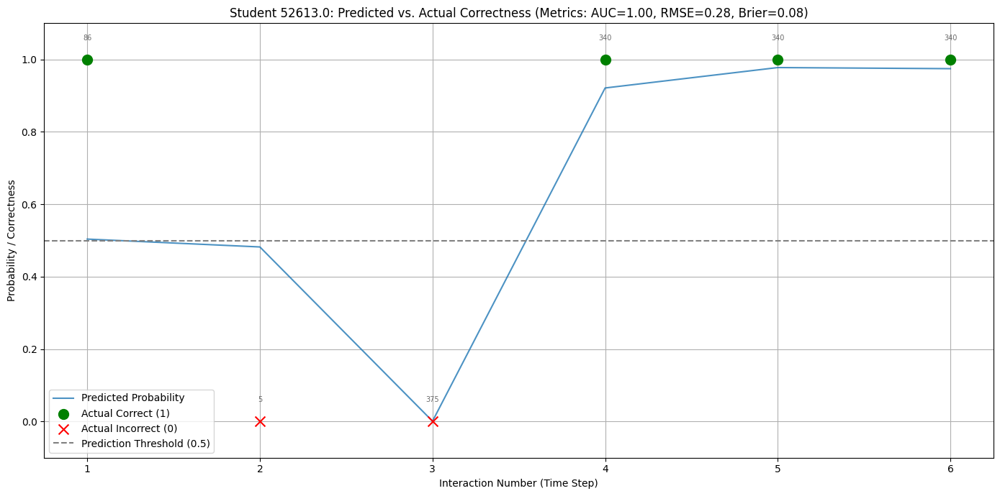

  Plot for Student 84760.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_84760.0_with_skills.png


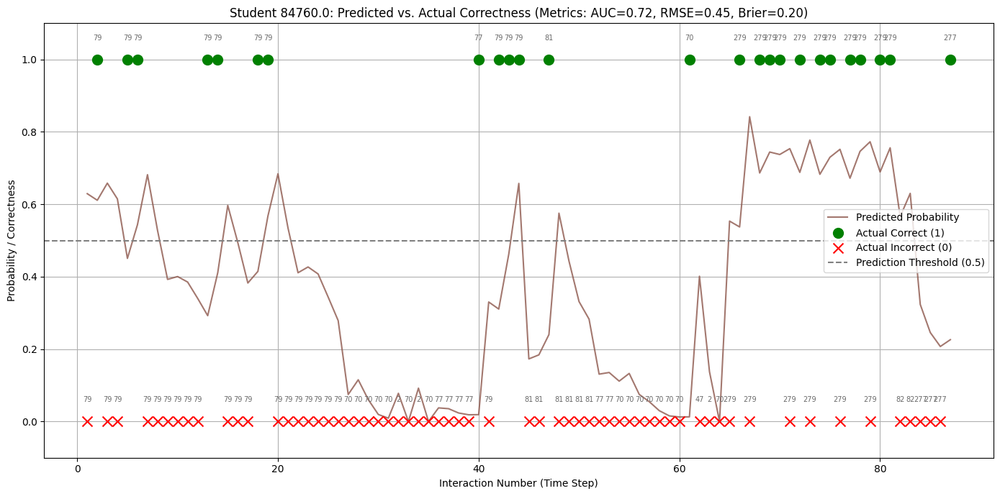

  Plot for Student 82687.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_82687.0_with_skills.png


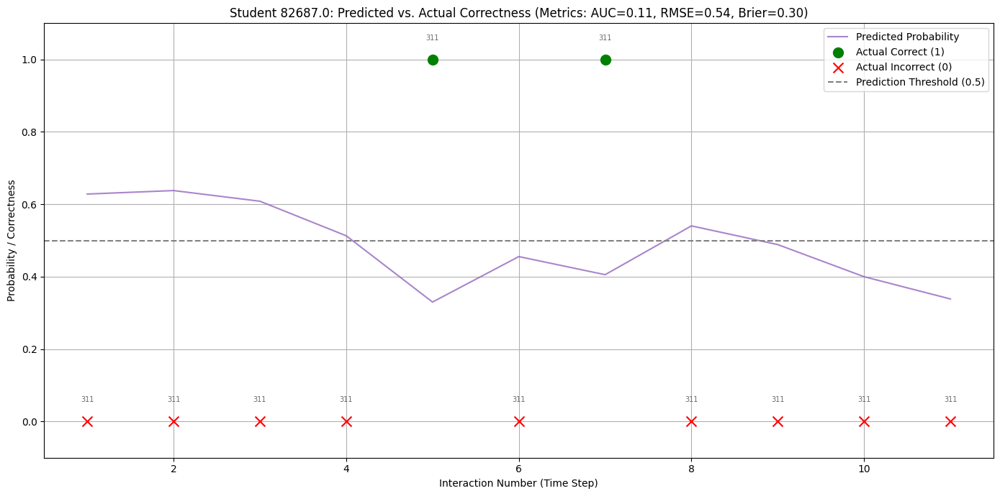

  Plot for Student 81656.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_81656.0_with_skills.png


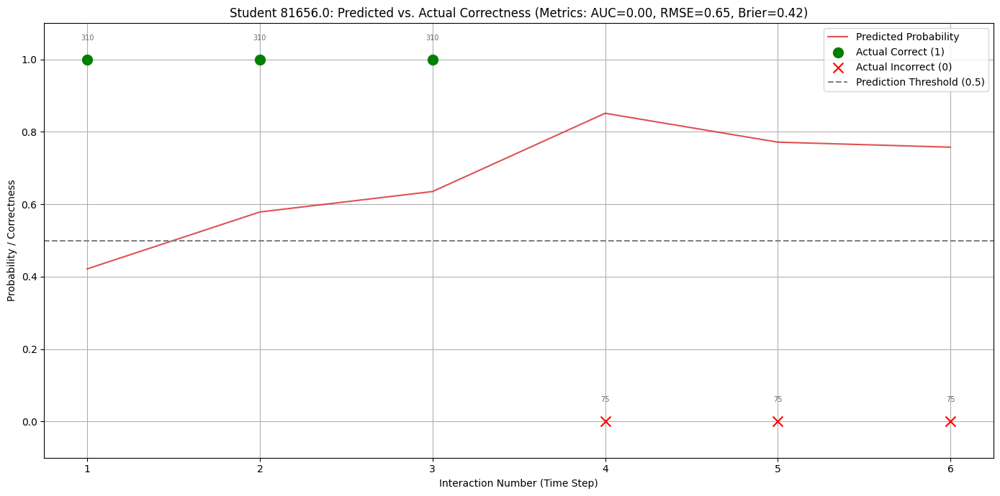

  Plot for Student 78368.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_78368.0_with_skills.png


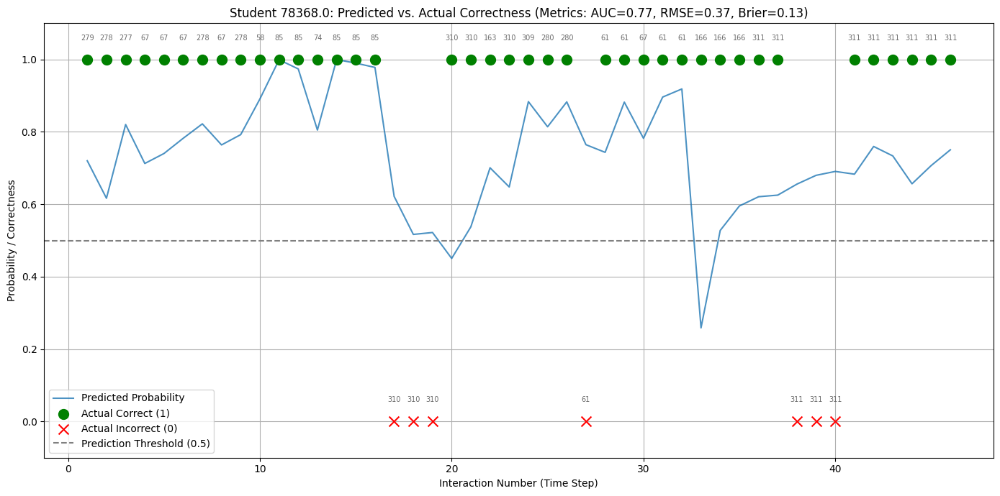


Finished generating individual student analysis plots with skill labels.


In [ ]:
# Armazenar as métricas junto com o ID do aluno e o índice original na lista de sequências
student_metrics_data = []
original_student_indices = [] # Map back to original student_sequences list index

current_student_idx = 0
for i, (user_id, seq) in enumerate(student_sequences):
    if len(seq) < 2:
        # Skip students that were not included in metric calculation
        continue

    # Only add if ROC AUC was calculated (i.e., not NaN)
    if not np.isnan(student_roc_aucs[current_student_idx]):
        student_metrics_data.append({
            'user_id': user_id,
            'original_idx': i,
            'roc_auc': student_roc_aucs[current_student_idx],
            'rmse': student_rmses[current_student_idx],
            'brier_score': student_brier_scores[current_student_idx],
            'seq_len': len(seq) - 1 # Adjusted for DKTDataset T-1
        })
    current_student_idx += 1

# Convert to DataFrame for easier sorting and selection
metrics_df = pd.DataFrame(student_metrics_data)

# Select students with interesting learning patterns
# 1. High-performing student (high ROC AUC, low Brier Score/RMSE)
high_perf_student = metrics_df.loc[metrics_df['roc_auc'].idxmax()]

# 2. Low-performing student (low ROC AUC, high Brier Score/RMSE)
# Filter for ROC AUC > 0.1 to avoid trivial cases of only one class predicted
low_perf_candidates = metrics_df[metrics_df['roc_auc'] > 0.1]
if not low_perf_candidates.empty:
    low_perf_student = low_perf_candidates.loc[low_perf_candidates['roc_auc'].idxmin()]
else:
    low_perf_student = None
    print("Could not find a low performing student with ROC AUC > 0.1")

# 3. Average-performing student (ROC AUC close to overall mean)
overall_mean_auc = metrics_df['roc_auc'].mean()
average_perf_student = metrics_df.iloc[(metrics_df['roc_auc'] - overall_mean_auc).abs().argsort()[:1]].iloc[0]

# 4. Student with very high RMSE / Brier Score (model struggled to predict)
# Struggling student could be a low_perf_student as well, check for distinctiveness
high_brier_student_candidates = metrics_df.loc[metrics_df['brier_score'].nlargest(5).index]
# Try to pick one that isn't already selected, or simply the highest if distinctness is hard.
struggling_student = high_brier_student_candidates.iloc[0]

# Ensure we have a diverse set of students. Use user_ids to check for uniqueness.
selected_user_ids = set()
final_selected_students = []

def add_student_if_unique(student_series):
    if student_series is not None and student_series['user_id'] not in selected_user_ids:
        final_selected_students.append(student_series)
        selected_user_ids.add(student_series['user_id'])

add_student_if_unique(high_perf_student)
add_student_if_unique(average_perf_student)
add_student_if_unique(low_perf_student)
add_student_if_unique(struggling_student)

# If we still need more students, pick some at random from those not yet selected
if len(final_selected_students) < 5:
    remaining_students = metrics_df[~metrics_df['user_id'].isin(selected_user_ids)]
    if not remaining_students.empty:
        random_additional_students = remaining_students.sample(n=min(5 - len(final_selected_students), len(remaining_students)), random_state=42)
        for _, row in random_additional_students.iterrows():
            add_student_if_unique(row)

print("Selected students for detailed analysis:")
for student in final_selected_students:
    print(f"- User ID: {student['user_id']}, Original Index: {student['original_idx']}, ROC AUC: {student['roc_auc']:.4f}, RMSE: {student['rmse']:.4f}, Brier Score: {student['brier_score']:.4f}, Seq Len: {student['seq_len']}")

# Store selected student original indices for plotting
selected_student_original_indices = [s['original_idx'] for s in final_selected_students]

# --- GLOBAL COLOR MAPPING FOR CONSISTENCY ACROSS ALL PLOTS ---
# Create a consistent color map for ALL unique user_ids present in metrics_df
# This ensures the same student_id always gets the same color if plotted in different contexts
all_unique_user_ids = metrics_df['user_id'].unique()
num_unique_user_ids = len(all_unique_user_ids)
color_palette = plt.cm.get_cmap('tab10', num_unique_user_ids) # Using tab10 for distinct colors
user_id_to_color_map = {user_id: color_palette(i) for i, user_id in enumerate(all_unique_user_ids)}
# --- END GLOBAL COLOR MAPPING ---


# Generate specific plots for these selected students
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

model_perf.eval()
model_perf.to(device)

print("\nGenerating individual plots for selected students...")

# Create a reverse mapping from skill_idx to skill_id (needed here for plotting skill labels)
skill_idx_to_id_map = {idx: skill_id for skill_id, idx in skill_map.items()}

for student_info in final_selected_students:
    user_id = student_info['user_id']
    original_seq_idx = int(student_info['original_idx']) # Cast to int here
    seq_len = student_info['seq_len']

    # Retrieve sequence from the original student_sequences list
    _, seq = student_sequences[original_seq_idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} due to short sequence length: {len(seq)}")
        continue

    single_student_dataset = DKTDataset([seq], M)
    x_single, q_next_single, a_next_single = single_student_dataset[0]
    x_padded, q_next_padded, a_next_padded, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])

    x_padded = x_padded.to(device)
    q_next_padded = q_next_padded.to(device)
    a_next_padded = a_next_padded.to(device)
    mask_padded = mask_padded.to(device)

    with torch.no_grad():
        y_perf, _ = model_perf(x_padded)

    p_t_perf = y_perf.gather(2, q_next_padded.unsqueeze(-1)).squeeze(-1)

    valid_timesteps_mask = mask_padded.squeeze(0).bool().cpu().numpy()
    predicted_probs_filtered = p_t_perf.squeeze(0).cpu().numpy()[valid_timesteps_mask]
    actual_correctness_filtered = a_next_padded.squeeze(0).cpu().numpy()[valid_timesteps_mask]

    # Get the original skill_ids for the interactions being plotted
    # q_next_padded[0, valid_timesteps_mask] gives the skill_idx for each interaction
    original_skill_ids_for_plot = [skill_idx_to_id_map[q_idx.item()] for q_idx in q_next_padded[0, valid_timesteps_mask]]

    interaction_numbers = np.arange(1, len(predicted_probs_filtered) + 1)

    plt.figure(figsize=(14, 7))
    # Use consistent color for the probability line from the global map
    plt.plot(interaction_numbers, predicted_probs_filtered, label="Predicted Probability", color=user_id_to_color_map[user_id], alpha=0.8)

    # Separate scatter plots for correct (green circle) and incorrect (red X) answers
    correct_mask = actual_correctness_filtered == 1
    incorrect_mask = actual_correctness_filtered == 0

    plt.scatter(interaction_numbers[correct_mask], actual_correctness_filtered[correct_mask],
                label="Actual Correct (1)", color='green', marker='o', s=100, zorder=5)
    plt.scatter(interaction_numbers[incorrect_mask], actual_correctness_filtered[incorrect_mask],
                label="Actual Incorrect (0)", color='red', marker='x', s=100, zorder=5)

    # Add a horizontal line at 0.5 to show the prediction threshold
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Prediction Threshold (0.5)')

    # Add skill labels to each scatter point
    for k, (x_pos, y_pos) in enumerate(zip(interaction_numbers, actual_correctness_filtered)):
        plt.text(x_pos, y_pos + 0.05, str(original_skill_ids_for_plot[k]),
                 fontsize=7, ha='center', va='bottom', color='dimgray')

    plt.title(f"Student {user_id}: Predicted vs. Actual Correctness (Metrics: AUC={student_info['roc_auc']:.2f}, RMSE={student_info['rmse']:.2f}, Brier={student_info['brier_score']:.2f})")
    plt.xlabel("Interaction Number (Time Step)")
    plt.ylabel("Probability / Correctness")
    plt.legend()
    plt.grid(True)
    plt.ylim(-0.1, 1.1)
    plt.tight_layout()

    plot_filename = os.path.join(output_path, f"analysis_student_trajectory_perf_{user_id}_with_skills.png")
    plt.savefig(plot_filename)
    print(f"  Plot for Student {user_id} saved to: {plot_filename}")
    plt.show()
    plt.close()

print("\nFinished generating individual student analysis plots with skill labels.")

In [ ]:
import numpy as np

# 1. Sort the skill_stats DataFrame by the 'acc_rate' column
skil_stats_sorted = skill_stats.sort_values(by='acc_rate')

# Filter for skills with a reasonable number of interactions to ensure they are not too rare
# Let's say, n >= 100 interactions for a skill to be considered
common_skills_stats = skil_stats_sorted[skil_stats_sorted['n'] >= 100]

# Check if common_skills_stats is empty
if common_skills_stats.empty:
    print("Warning: No common skills found (n >= 100). Reverting to all skills for selection.")
    common_skills_stats = skil_stats_sorted # Use all skills if none are common

# 2. Select the skill_idx for a skill with a low mastery rate
low_mastery_skill_idx = common_skills_stats.index[0]

# 3. Select the skill_idx for a skill with a high mastery rate
high_mastery_skill_idx = common_skills_stats.index[-1]

# 4. Select the skill_idx for a skill with a medium mastery rate
median_acc_rate = common_skills_stats['acc_rate'].median()
medium_mastery_skill_idx = common_skills_stats.iloc[(common_skills_stats['acc_rate'] - median_acc_rate).abs().argsort()[:1]].index[0]

# 5. Store these three selected skill indices in a list
selected_skill_indices = [
    int(low_mastery_skill_idx),
    int(medium_mastery_skill_idx),
    int(high_mastery_skill_idx)
]

print(f"Selected Skill Indices for Diverse Mastery Levels (filtered by interaction count): {selected_skill_indices}")

# 6. Confirm that the final_selected_students list is available
if 'final_selected_students' in locals() and final_selected_students:
    print("\nConfirmed: 'final_selected_students' list is available and contains:")
    for student in final_selected_students:
        print(f"- User ID: {student['user_id']}, ROC AUC: {student['roc_auc']:.4f}")
else:
    print("\nWarning: 'final_selected_students' list is not available or is empty. Please ensure previous steps generating this list were executed.")

Selected Skill Indices for Diverse Mastery Levels (filtered by interaction count): [65, 105, 95]

Confirmed: 'final_selected_students' list is available and contains:
- User ID: 52613.0, ROC AUC: 1.0000
- User ID: 84760.0, ROC AUC: 0.7187
- User ID: 82687.0, ROC AUC: 0.1111
- User ID: 81656.0, ROC AUC: 0.0000
- User ID: 78368.0, ROC AUC: 0.7729


## Generate Skill-Specific Probability Trajectory Plots

### Subtask:
For each selected student and for each of the identified skills (high, medium, low mastery), generate a dedicated plot. Each plot will display the predicted probability for that *specific skill* across all interaction time steps for the student. Crucially, it will also mark the time steps where the student *actually interacted with that specific skill* and indicate the correctness of that interaction. Skill IDs will be added as labels for context.


Generating skill-specific probability trajectory plots...
  Plot for Student 52613.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_52613.0_skill_292_all_interactions.png


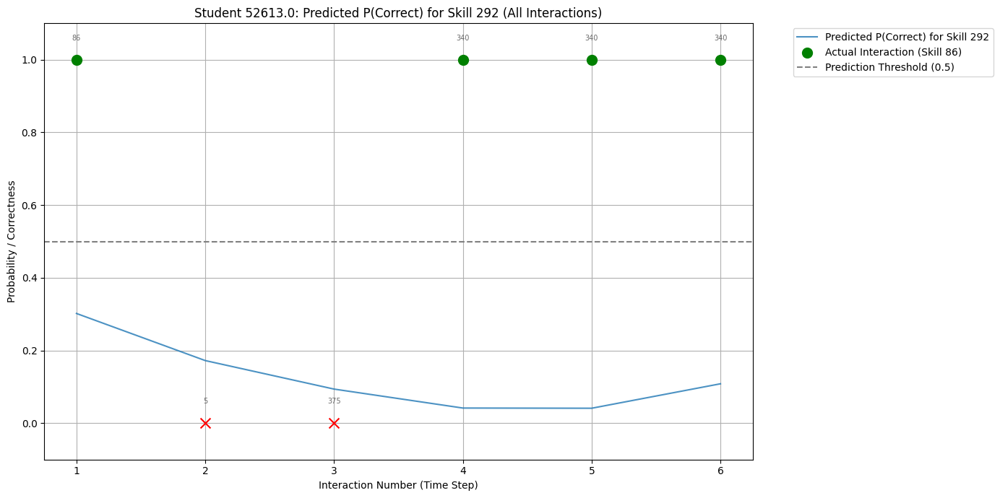

  Plot for Student 52613.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_52613.0_skill_346_all_interactions.png


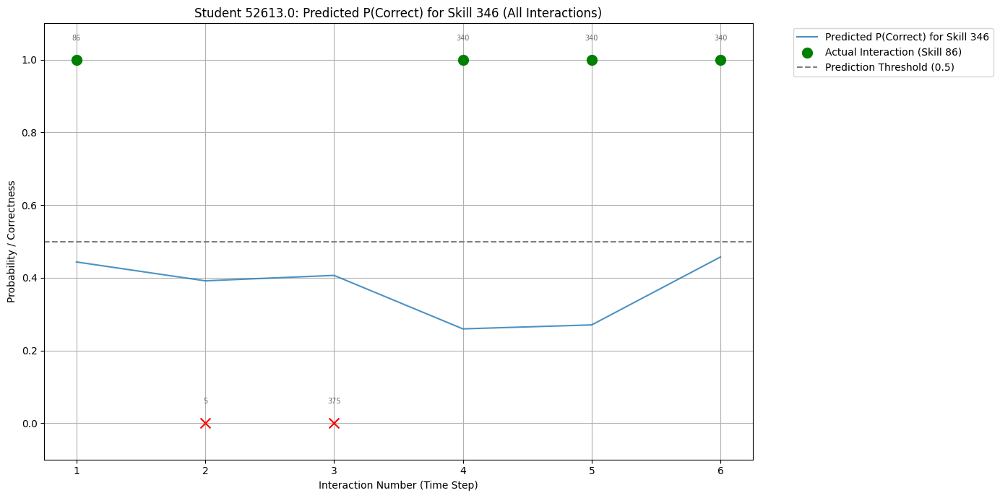

  Plot for Student 52613.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_52613.0_skill_295_all_interactions.png


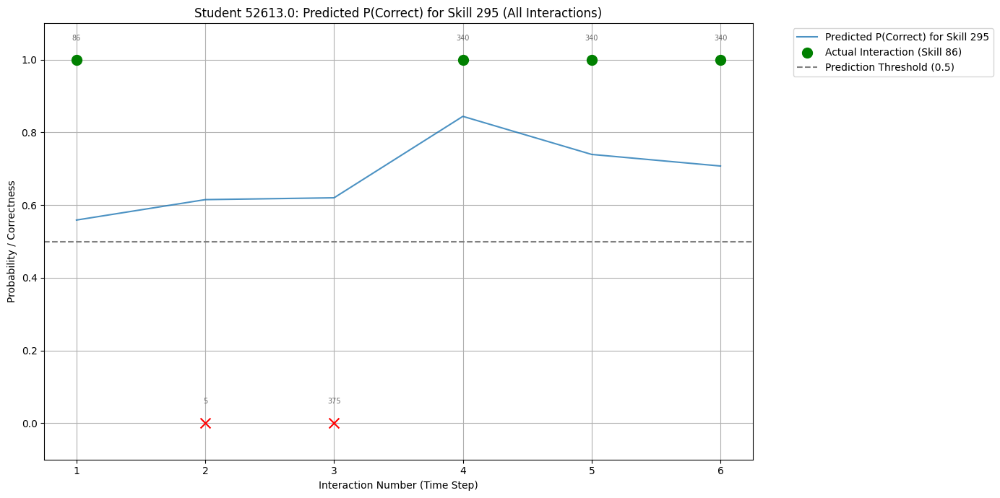

  Plot for Student 84760.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_84760.0_skill_292_all_interactions.png


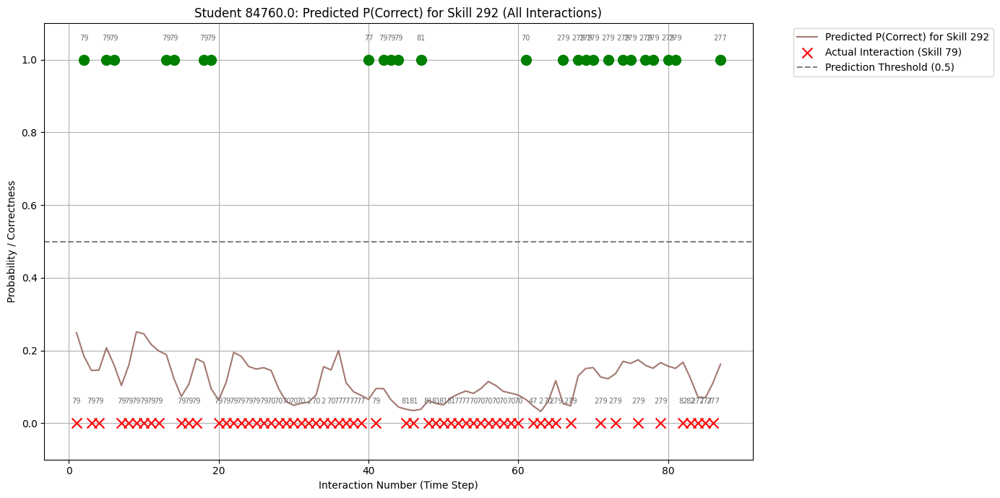

  Plot for Student 84760.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_84760.0_skill_346_all_interactions.png


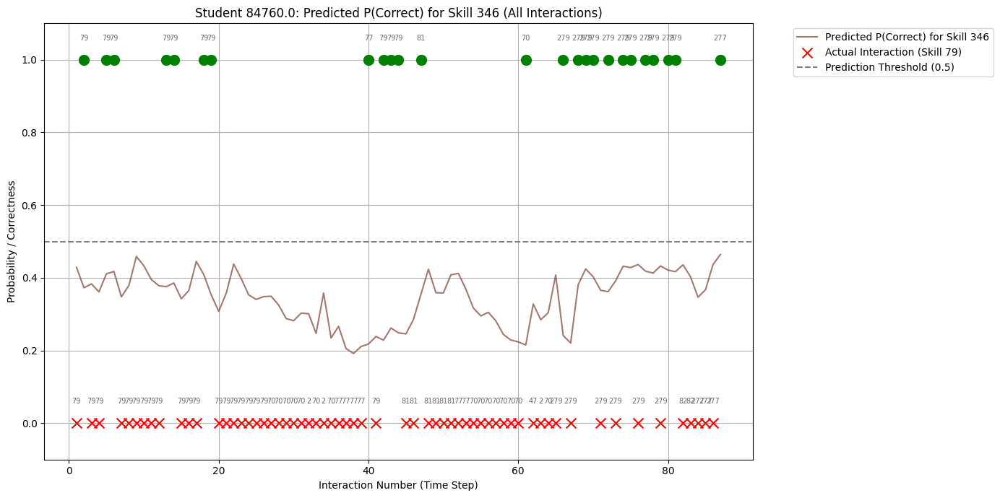

  Plot for Student 84760.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_84760.0_skill_295_all_interactions.png


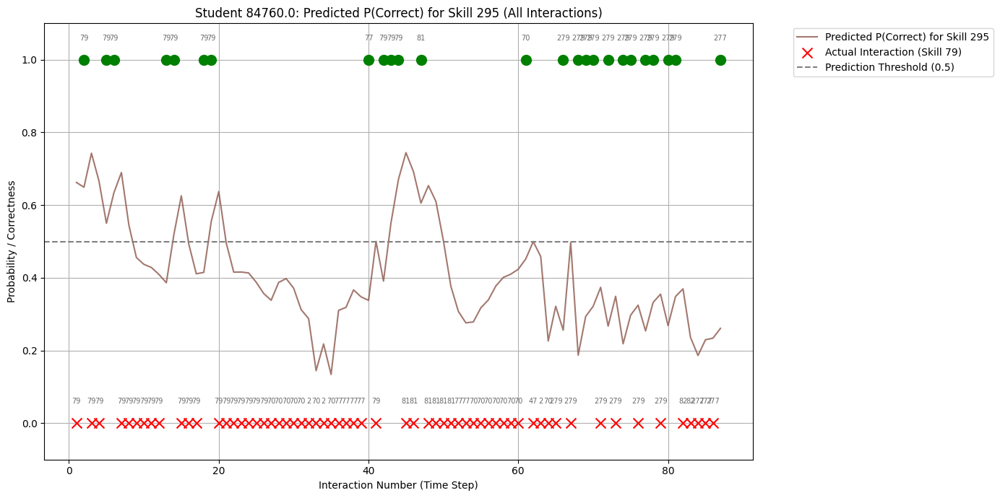

  Plot for Student 82687.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_82687.0_skill_292_all_interactions.png


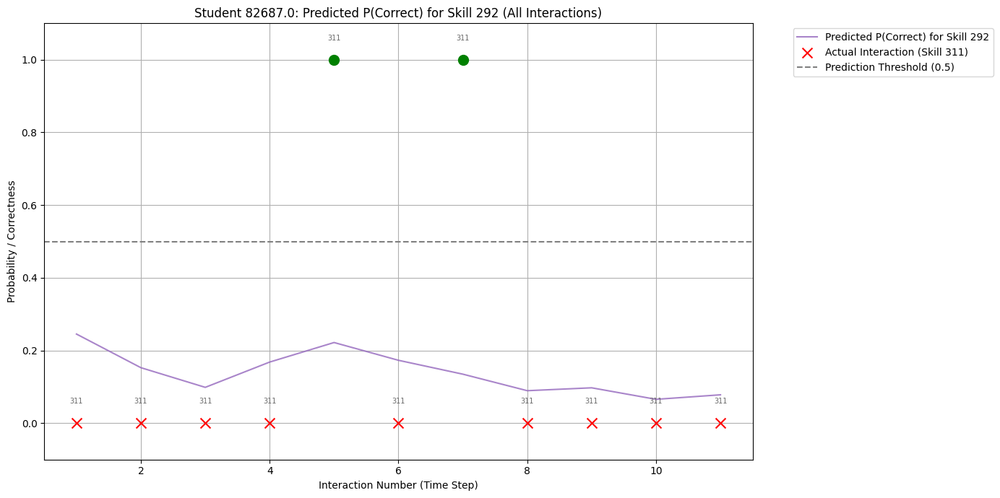

  Plot for Student 82687.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_82687.0_skill_346_all_interactions.png


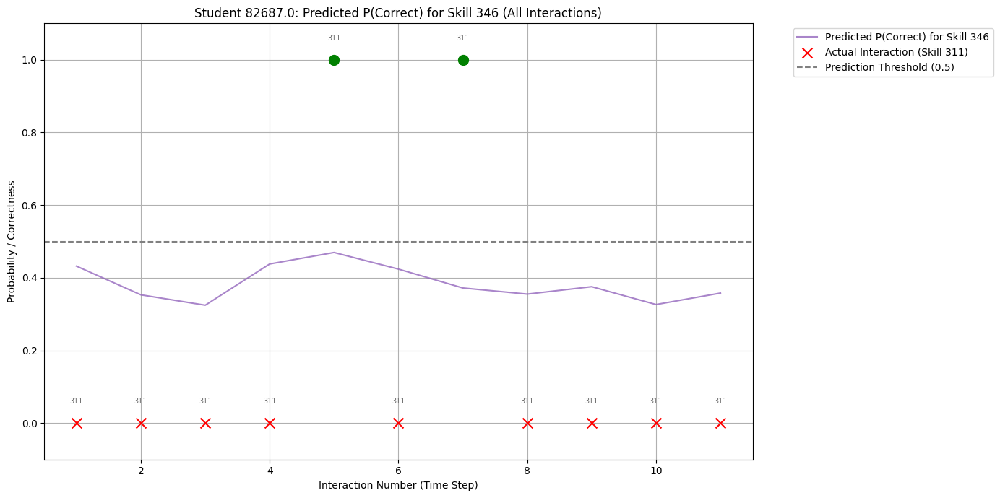

  Plot for Student 82687.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_82687.0_skill_295_all_interactions.png


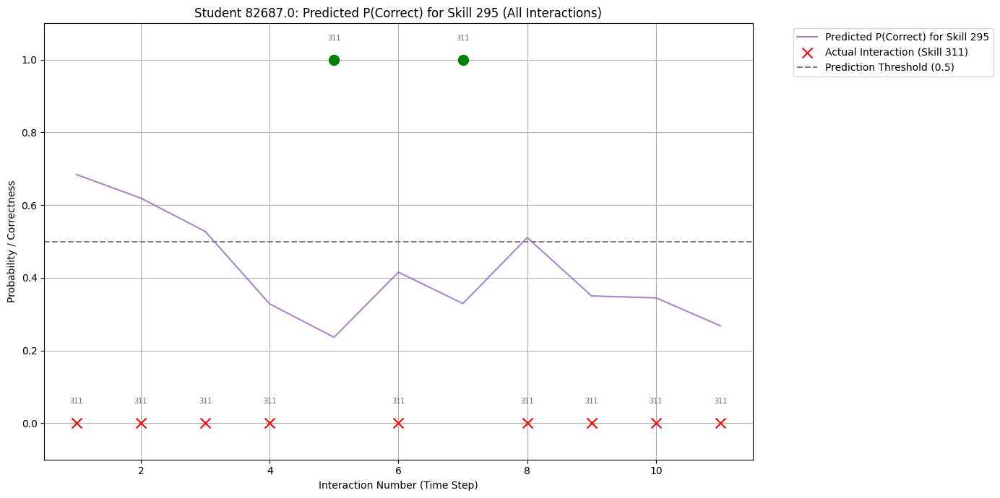

  Plot for Student 81656.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_81656.0_skill_292_all_interactions.png


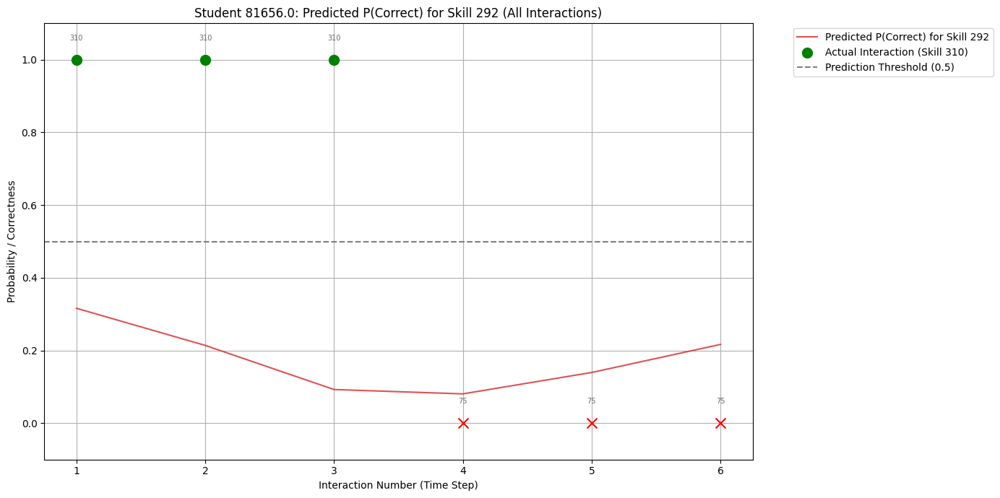

  Plot for Student 81656.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_81656.0_skill_346_all_interactions.png


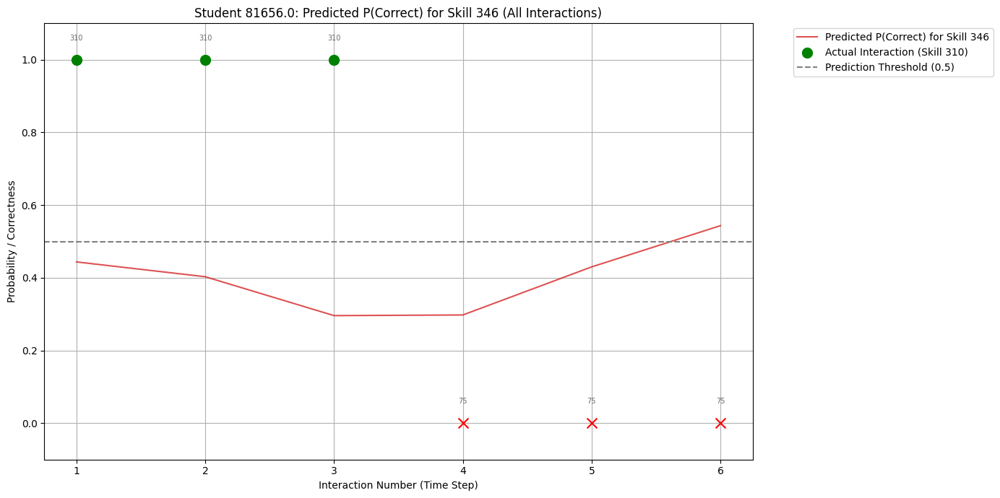

  Plot for Student 81656.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_81656.0_skill_295_all_interactions.png


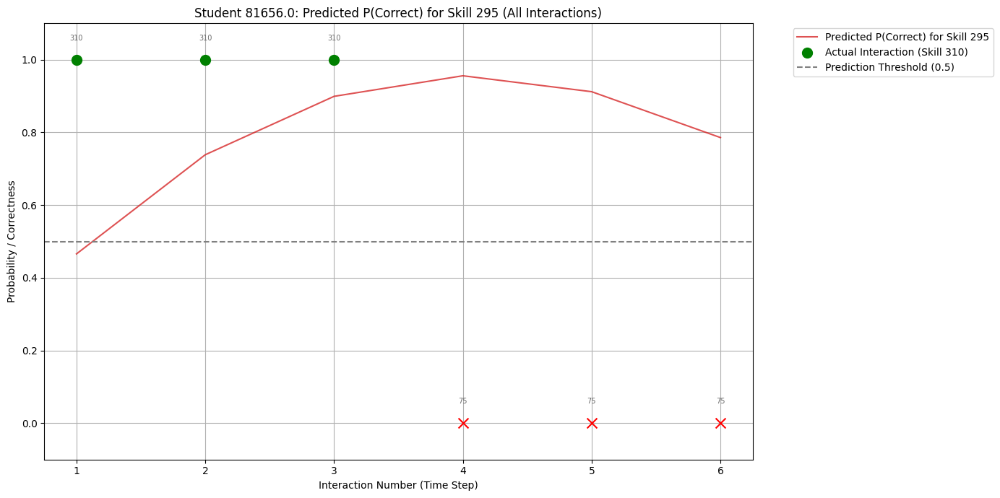

  Plot for Student 78368.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_78368.0_skill_292_all_interactions.png


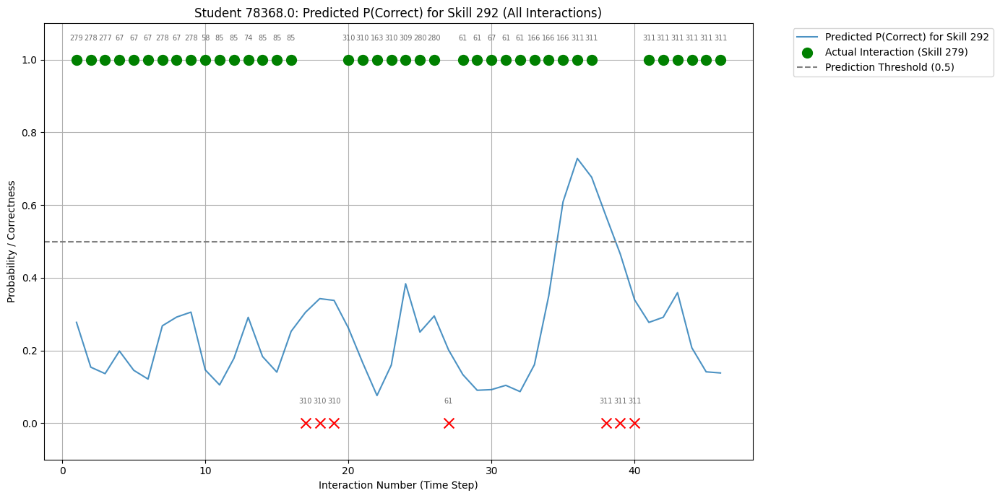

  Plot for Student 78368.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_78368.0_skill_346_all_interactions.png


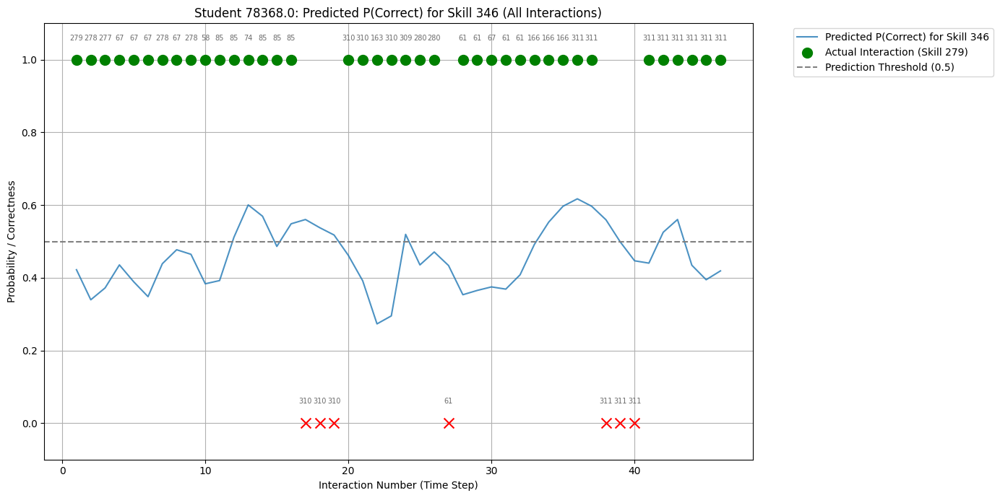

  Plot for Student 78368.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_78368.0_skill_295_all_interactions.png


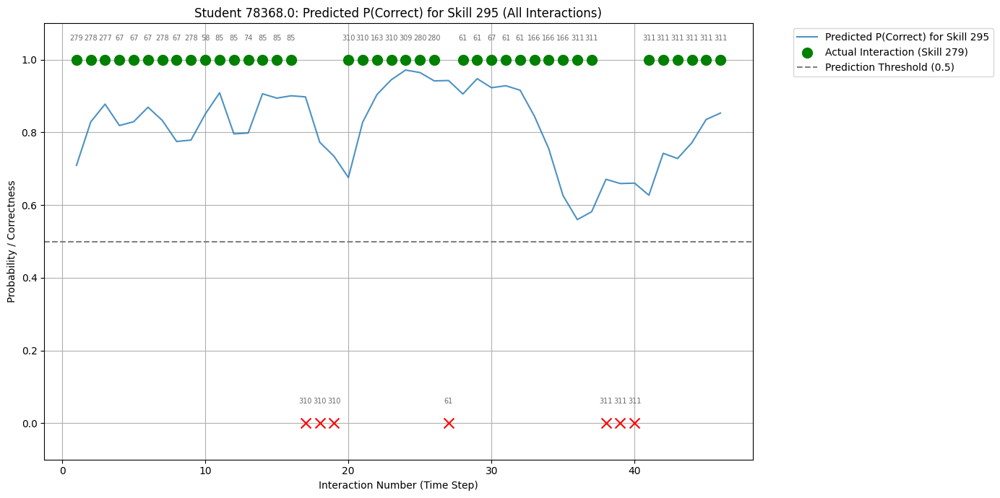

Finished generating all skill-specific probability trajectory plots.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

# 1. Set the model_perf to evaluation mode and move it to the appropriate device.
model_perf.eval()
model_perf.to(device)

# Ensure output_path exists
os.makedirs(output_path, exist_ok=True)

print("Generating skill-specific probability trajectory plots...")

# 2. Iterate through each student_info in the final_selected_students list.
for student_info in final_selected_students:
    user_id = student_info['user_id']
    original_seq_idx = int(student_info['original_idx'])

    # 3. For each student, retrieve their user_id and the original sequence seq
    #    from the student_sequences list using the original_idx.
    _, seq = student_sequences[original_seq_idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} due to short sequence length: {len(seq)}.")
        continue

    # Prepare the student's sequence for model_perf
    # FIX: Pass the user_id along with the sequence to DKTDataset
    single_student_dataset = DKTDataset([(user_id, seq)], M)

    # DKTDataset.__getitem__(0) returns (x, q_next, a_next, uid).
    x_single, q_next_single, a_next_single, _ = single_student_dataset[0]

    # dkt_collate returns 5 values (x_pad, q_pad, a_pad, mask, uids). Adjust unpacking.
    x_padded, q_next_padded, a_next_padded, mask_padded, _ = dkt_collate([(x_single, q_next_single, a_next_single, user_id)])

    x_padded = x_padded.to(device)
    q_next_padded = q_next_padded.to(device) # Keep q_next_padded on device for gather
    a_next_padded = a_next_padded.to(device)
    mask_padded = mask_padded.to(device)

    with torch.no_grad():
        y_perf, _ = model_perf(x_padded) # y_perf: (B=1, T, M)

    # Get actual sequence length from mask
    actual_len = int(mask_padded.sum().item())

    # Convert q_next_padded and a_next_padded to numpy for easier comparison
    q_next_np = q_next_padded.squeeze(0).cpu().numpy()
    a_next_np = a_next_padded.squeeze(0).cpu().numpy()

    # 4. For each student, iterate through the selected_skill_indices
    for current_skill_idx in selected_skill_indices:
        original_skill_id = skill_idx_to_id_map[current_skill_idx]

        # 7. Extract the predicted probabilities specifically for the current_skill_idx
        #    across all time steps. This will be a 1D array of probabilities (length T).
        # y_perf[:, :, current_skill_idx] gives (B, T) for that skill_idx
        predicted_probs_for_skill = y_perf.squeeze(0)[:, current_skill_idx].cpu().numpy() # (T,) array

        # Filter to actual sequence length
        predicted_probs_for_skill_filtered = predicted_probs_for_skill[:actual_len]
        time_steps = np.arange(1, actual_len + 1)

        # 8. Plot: predicted probabilities for the specific skill (line) AND ALL interactions (scatter)
        plt.figure(figsize=(14, 7))

        # a. Plot predicted_probs_for_skill as a line (using consistent student color)
        plt.plot(time_steps, predicted_probs_for_skill_filtered, label=f'Predicted P(Correct) for Skill {original_skill_id}', color=user_id_to_color_map[user_id], alpha=0.8)

        # b. On the same plot, use scatter markers to indicate ALL actual interactions.
        #    Different colors/markers for correct/incorrect answers, and label with actual skill_id.
        for t in range(actual_len):
            current_interaction_skill_idx = q_next_np[t] # The skill actually interacted with at time t
            current_interaction_skill_id = skill_idx_to_id_map[current_interaction_skill_idx]
            current_interaction_correctness = a_next_np[t]

            marker_color = 'green' if current_interaction_correctness == 1 else 'red'
            marker_style = 'o' if current_interaction_correctness == 1 else 'x'

            # Avoid duplicate labels in legend for every point
            if t == 0: # Only add labels once for legend clarity
                plt.scatter(time_steps[t], current_interaction_correctness,
                            color=marker_color, marker=marker_style, s=100, zorder=5,
                            label=f'Actual Interaction (Skill {current_interaction_skill_id})')
            else:
                 plt.scatter(time_steps[t], current_interaction_correctness,
                            color=marker_color, marker=marker_style, s=100, zorder=5)

            # Add skill labels to each scatter point for ALL interactions
            plt.text(time_steps[t], current_interaction_correctness + 0.05,
                     str(current_interaction_skill_id),
                     fontsize=7, ha='center', va='bottom', color='dimgray')

        # Add a horizontal line at 0.5 for prediction threshold
        plt.axhline(y=0.5, color='gray', linestyle='--', label='Prediction Threshold (0.5)')

        # 10. Add title, labels, legend, and y-axis limits.
        plt.title(f"Student {user_id}: Predicted P(Correct) for Skill {original_skill_id} (All Interactions)")
        plt.xlabel("Interaction Number (Time Step)")
        plt.ylabel("Probability / Correctness")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside plot
        plt.grid(True)
        plt.ylim(-0.1, 1.1) # Set y-axis limits to clearly show 0 and 1
        plt.tight_layout() # Adjust layout to prevent labels from being cut off

        # 11. Save each plot as a PNG file.
        plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id}_skill_{original_skill_id}_all_interactions.png")
        plt.savefig(plot_filename)
        print(f"  Plot for Student {user_id}, Skill {original_skill_id} saved to: {plot_filename}")

        # 12. Close each plot figure to free memory.
        plt.show()
        plt.close()

print("Finished generating all skill-specific probability trajectory plots.")

Selected students for detailed analysis:
- User ID: 52613.0, Original Index: 3.0, ROC AUC: 1.0000, RMSE: 0.2846, Brier Score: 0.0810, Seq Len: 6.0
- User ID: 84760.0, Original Index: 1954.0, ROC AUC: 0.7187, RMSE: 0.4457, Brier Score: 0.1987, Seq Len: 87.0
- User ID: 82687.0, Original Index: 1572.0, ROC AUC: 0.1111, RMSE: 0.5436, Brier Score: 0.2955, Seq Len: 11.0
- User ID: 81656.0, Original Index: 1352.0, ROC AUC: 0.0000, RMSE: 0.6505, Brier Score: 0.4232, Seq Len: 6.0
- User ID: 78368.0, Original Index: 373.0, ROC AUC: 0.7729, RMSE: 0.3662, Brier Score: 0.1341, Seq Len: 46.0

Generating individual plots for selected students...


/tmp/ipython-input-617796582.py:83: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_palette = plt.cm.get_cmap('tab10', num_unique_user_ids) # Using tab10 for distinct colors


  Plot for Student 52613.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_52613.0_with_skills.png


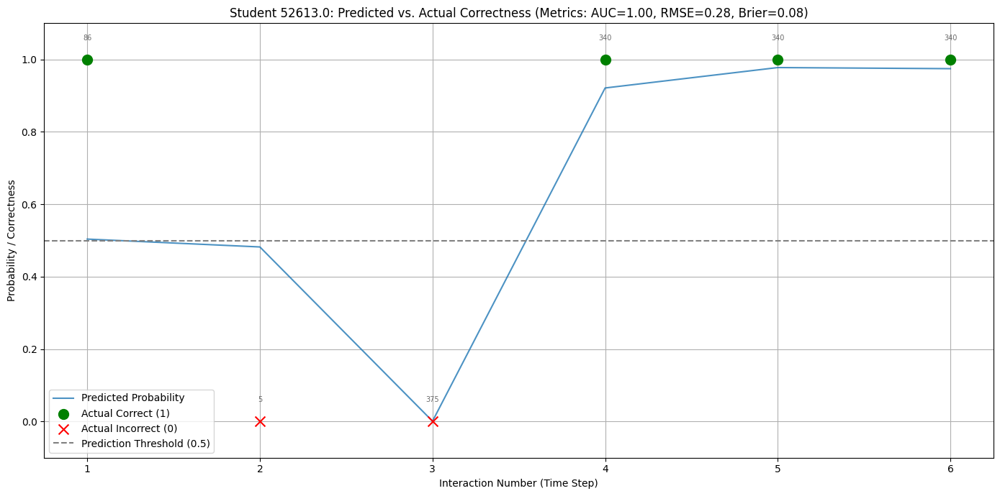

  Plot for Student 84760.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_84760.0_with_skills.png


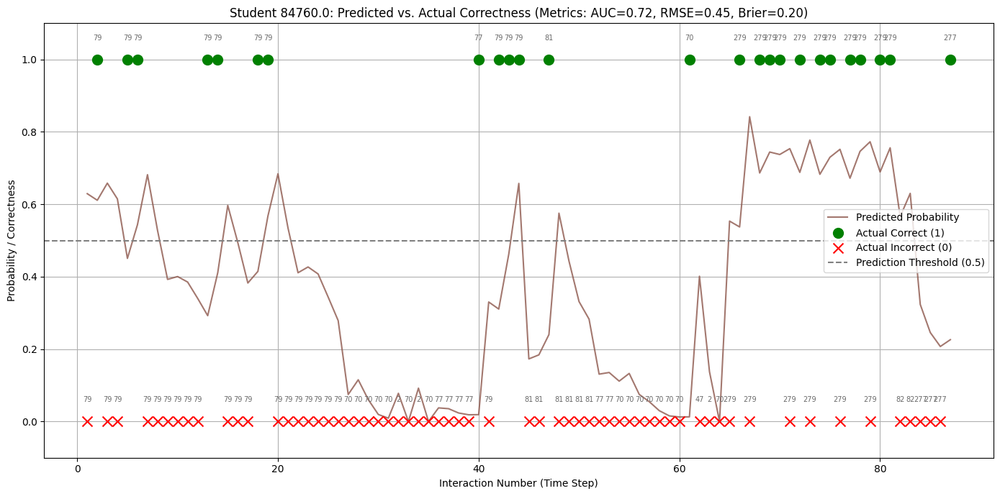

  Plot for Student 82687.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_82687.0_with_skills.png


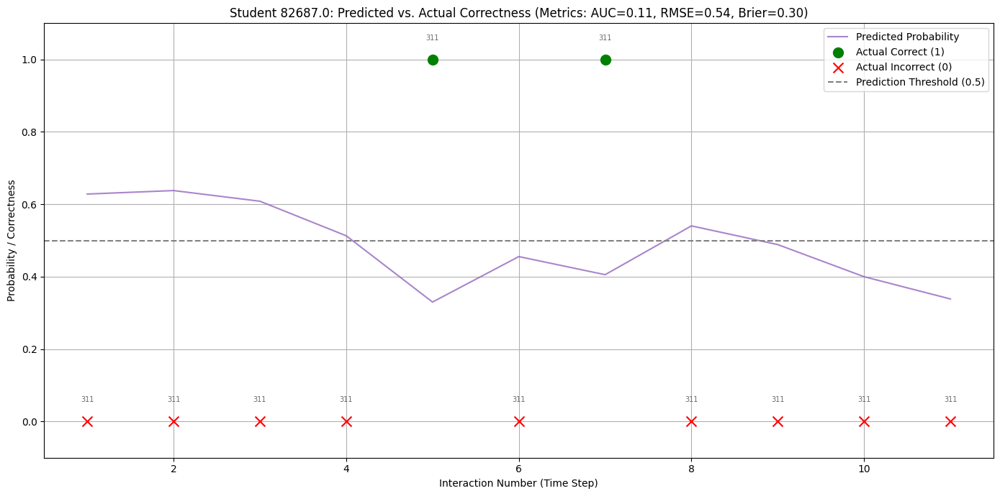

  Plot for Student 81656.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_81656.0_with_skills.png


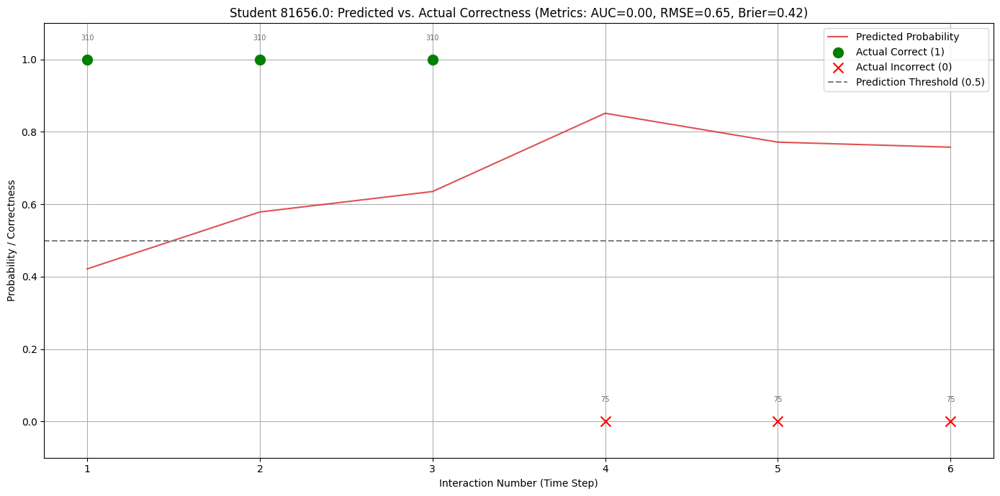

  Plot for Student 78368.0 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/analysis_student_trajectory_perf_78368.0_with_skills.png


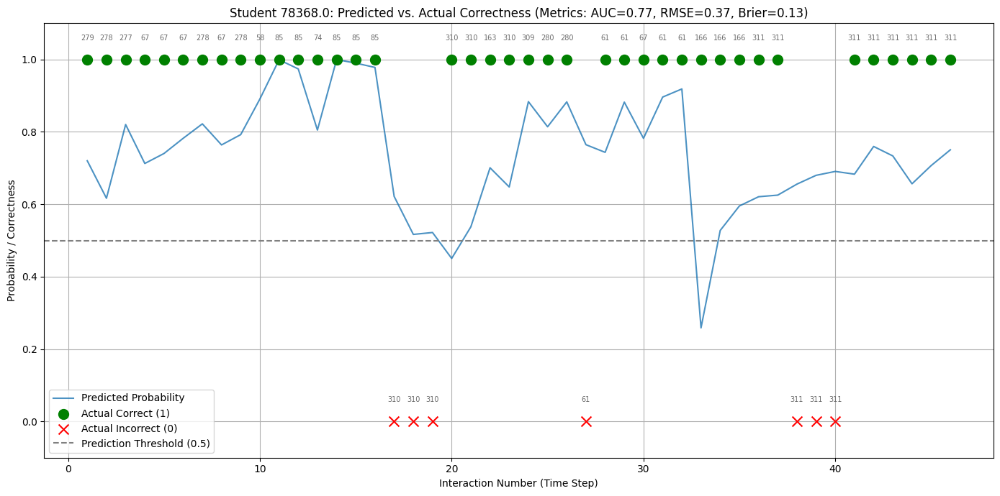


Finished generating individual student analysis plots with skill labels.


In [ ]:
# Armazenar as métricas junto com o ID do aluno e o índice original na lista de sequências
student_metrics_data = []
original_student_indices = [] # Map back to original student_sequences list index

current_student_idx = 0
for i, (user_id, seq) in enumerate(student_sequences):
    if len(seq) < 2:
        # Skip students that were not included in metric calculation
        continue

    # Only add if ROC AUC was calculated (i.e., not NaN)
    if not np.isnan(student_roc_aucs[current_student_idx]):
        student_metrics_data.append({
            'user_id': user_id,
            'original_idx': i,
            'roc_auc': student_roc_aucs[current_student_idx],
            'rmse': student_rmses[current_student_idx],
            'brier_score': student_brier_scores[current_student_idx],
            'seq_len': len(seq) - 1 # Adjusted for DKTDataset T-1
        })
    current_student_idx += 1

# Convert to DataFrame for easier sorting and selection
metrics_df = pd.DataFrame(student_metrics_data)

# Select students with interesting learning patterns
# 1. High-performing student (high ROC AUC, low Brier Score/RMSE)
high_perf_student = metrics_df.loc[metrics_df['roc_auc'].idxmax()]

# 2. Low-performing student (low ROC AUC, high Brier Score/RMSE)
# Filter for ROC AUC > 0.1 to avoid trivial cases of only one class predicted
low_perf_candidates = metrics_df[metrics_df['roc_auc'] > 0.1]
if not low_perf_candidates.empty:
    low_perf_student = low_perf_candidates.loc[low_perf_candidates['roc_auc'].idxmin()]
else:
    low_perf_student = None
    print("Could not find a low performing student with ROC AUC > 0.1")

# 3. Average-performing student (ROC AUC close to overall mean)
overall_mean_auc = metrics_df['roc_auc'].mean()
average_perf_student = metrics_df.iloc[(metrics_df['roc_auc'] - overall_mean_auc).abs().argsort()[:1]].iloc[0]

# 4. Student with very high RMSE / Brier Score (model struggled to predict)
# Struggling student could be a low_perf_student as well, check for distinctiveness
high_brier_student_candidates = metrics_df.loc[metrics_df['brier_score'].nlargest(5).index]
# Try to pick one that isn't already selected, or simply the highest if distinctness is hard.
struggling_student = high_brier_student_candidates.iloc[0]

# Ensure we have a diverse set of students. Use user_ids to check for uniqueness.
selected_user_ids = set()
final_selected_students = []

def add_student_if_unique(student_series):
    if student_series is not None and student_series['user_id'] not in selected_user_ids:
        final_selected_students.append(student_series)
        selected_user_ids.add(student_series['user_id'])

add_student_if_unique(high_perf_student)
add_student_if_unique(average_perf_student)
add_student_if_unique(low_perf_student)
add_student_if_unique(struggling_student)

# If we still need more students, pick some at random from those not yet selected
if len(final_selected_students) < 5:
    remaining_students = metrics_df[~metrics_df['user_id'].isin(selected_user_ids)]
    if not remaining_students.empty:
        random_additional_students = remaining_students.sample(n=min(5 - len(final_selected_students), len(remaining_students)), random_state=42)
        for _, row in random_additional_students.iterrows():
            add_student_if_unique(row)

print("Selected students for detailed analysis:")
for student in final_selected_students:
    print(f"- User ID: {student['user_id']}, Original Index: {student['original_idx']}, ROC AUC: {student['roc_auc']:.4f}, RMSE: {student['rmse']:.4f}, Brier Score: {student['brier_score']:.4f}, Seq Len: {student['seq_len']}")

# Store selected student original indices for plotting
selected_student_original_indices = [s['original_idx'] for s in final_selected_students]

# --- GLOBAL COLOR MAPPING FOR CONSISTENCY ACROSS ALL PLOTS ---
# Create a consistent color map for ALL unique user_ids present in metrics_df
# This ensures the same student_id always gets the same color if plotted in different contexts
all_unique_user_ids = metrics_df['user_id'].unique()
num_unique_user_ids = len(all_unique_user_ids)
color_palette = plt.cm.get_cmap('tab10', num_unique_user_ids) # Using tab10 for distinct colors
user_id_to_color_map = {user_id: color_palette(i) for i, user_id in enumerate(all_unique_user_ids)}
# --- END GLOBAL COLOR MAPPING ---


# Generate specific plots for these selected students
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

model_perf.eval()
model_perf.to(device)

print("\nGenerating individual plots for selected students...")

# Create a reverse mapping from skill_idx to skill_id (needed here for plotting skill labels)
skill_idx_to_id_map = {idx: skill_id for skill_id, idx in skill_map.items()}

for student_info in final_selected_students:
    user_id = student_info['user_id']
    original_seq_idx = int(student_info['original_idx']) # Cast to int here
    seq_len = student_info['seq_len']

    # Retrieve sequence from the original student_sequences list
    _, seq = student_sequences[original_seq_idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} due to short sequence length: {len(seq)}")
        continue

    single_student_dataset = DKTDataset([seq], M)
    x_single, q_next_single, a_next_single = single_student_dataset[0]
    x_padded, q_next_padded, a_next_padded, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])

    x_padded = x_padded.to(device)
    q_next_padded = q_next_padded.to(device)
    a_next_padded = a_next_padded.to(device)
    mask_padded = mask_padded.to(device)

    with torch.no_grad():
        y_perf, _ = model_perf(x_padded)

    p_t_perf = y_perf.gather(2, q_next_padded.unsqueeze(-1)).squeeze(-1)

    valid_timesteps_mask = mask_padded.squeeze(0).bool().cpu().numpy()
    predicted_probs_filtered = p_t_perf.squeeze(0).cpu().numpy()[valid_timesteps_mask]
    actual_correctness_filtered = a_next_padded.squeeze(0).cpu().numpy()[valid_timesteps_mask]

    # Get the original skill_ids for the interactions being plotted
    # q_next_padded[0, valid_timesteps_mask] gives the skill_idx for each interaction
    original_skill_ids_for_plot = [skill_idx_to_id_map[q_idx.item()] for q_idx in q_next_padded[0, valid_timesteps_mask]]

    interaction_numbers = np.arange(1, len(predicted_probs_filtered) + 1)

    plt.figure(figsize=(14, 7))
    # Use consistent color for the probability line from the global map
    plt.plot(interaction_numbers, predicted_probs_filtered, label="Predicted Probability", color=user_id_to_color_map[user_id], alpha=0.8)

    # Separate scatter plots for correct (green circle) and incorrect (red X) answers
    correct_mask = actual_correctness_filtered == 1
    incorrect_mask = actual_correctness_filtered == 0

    plt.scatter(interaction_numbers[correct_mask], actual_correctness_filtered[correct_mask],
                label="Actual Correct (1)", color='green', marker='o', s=100, zorder=5)
    plt.scatter(interaction_numbers[incorrect_mask], actual_correctness_filtered[incorrect_mask],
                label="Actual Incorrect (0)", color='red', marker='x', s=100, zorder=5)

    # Add a horizontal line at 0.5 to show the prediction threshold
    plt.axhline(y=0.5, color='gray', linestyle='--', label='Prediction Threshold (0.5)')

    # Add skill labels to each scatter point
    for k, (x_pos, y_pos) in enumerate(zip(interaction_numbers, actual_correctness_filtered)):
        plt.text(x_pos, y_pos + 0.05, str(original_skill_ids_for_plot[k]),
                 fontsize=7, ha='center', va='bottom', color='dimgray')

    plt.title(f"Student {user_id}: Predicted vs. Actual Correctness (Metrics: AUC={student_info['roc_auc']:.2f}, RMSE={student_info['rmse']:.2f}, Brier={student_info['brier_score']:.2f})")
    plt.xlabel("Interaction Number (Time Step)")
    plt.ylabel("Probability / Correctness")
    plt.legend()
    plt.grid(True)
    plt.ylim(-0.1, 1.1)
    plt.tight_layout()

    plot_filename = os.path.join(output_path, f"analysis_student_trajectory_perf_{user_id}_with_skills.png")
    plt.savefig(plot_filename)
    print(f"  Plot for Student {user_id} saved to: {plot_filename}")
    plt.show()
    plt.close()

print("\nFinished generating individual student analysis plots with skill labels.")

Generating skill-specific probability trajectory plots...
  Plot for Student 52613.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_52613.0_skill_292.png


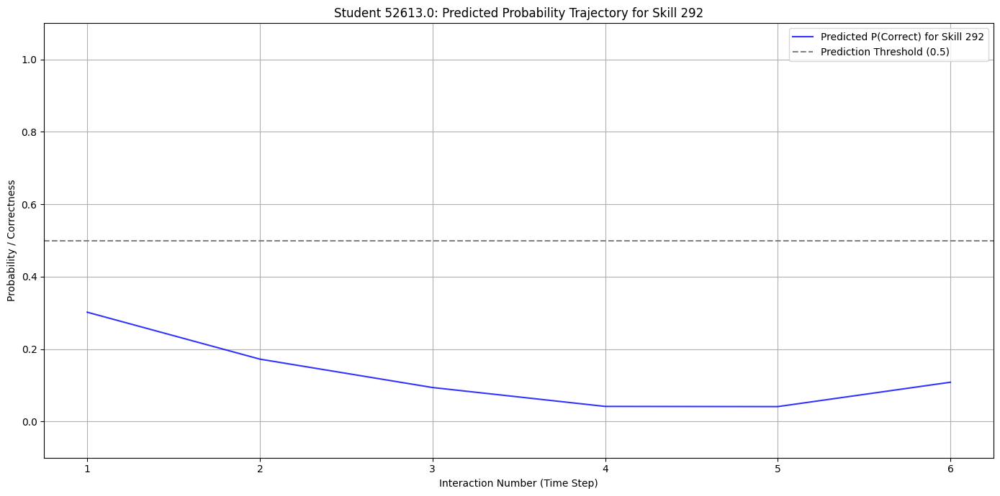

  Plot for Student 52613.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_52613.0_skill_346.png


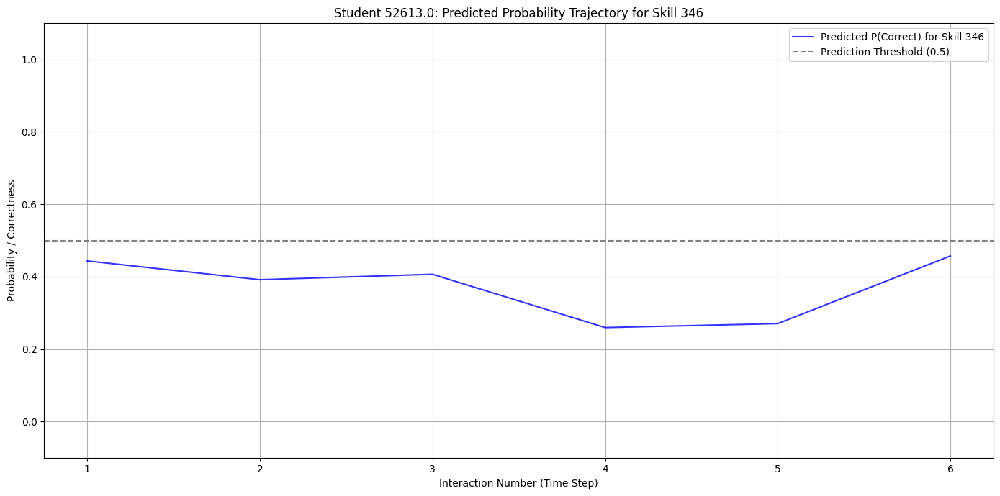

  Plot for Student 52613.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_52613.0_skill_295.png


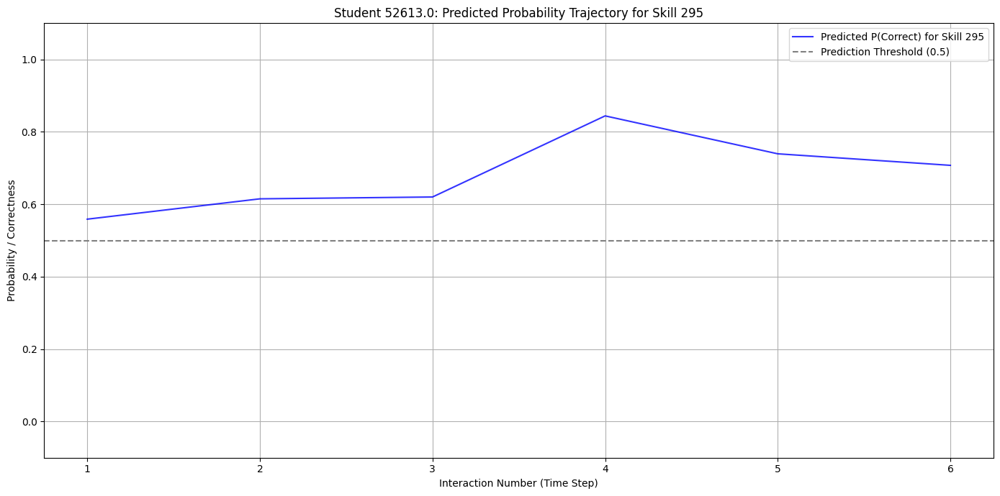

  Plot for Student 84760.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_84760.0_skill_292.png


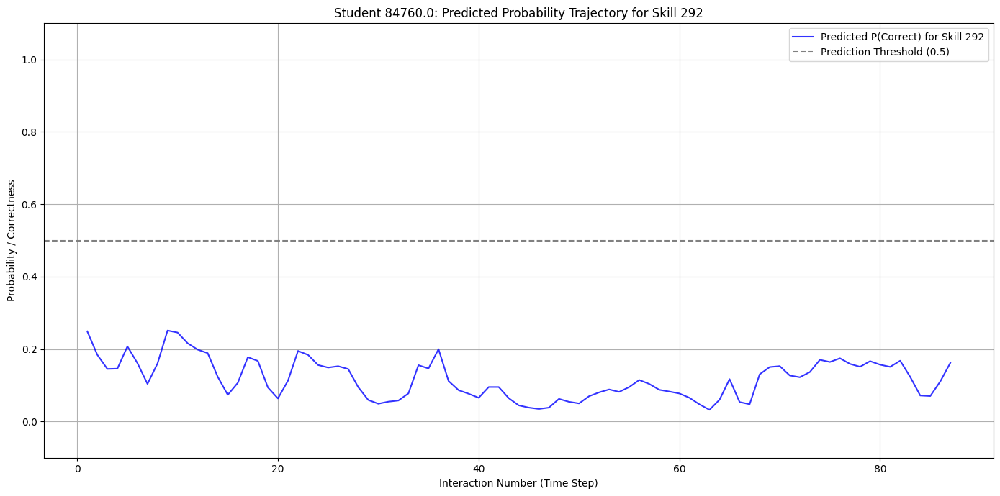

  Plot for Student 84760.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_84760.0_skill_346.png


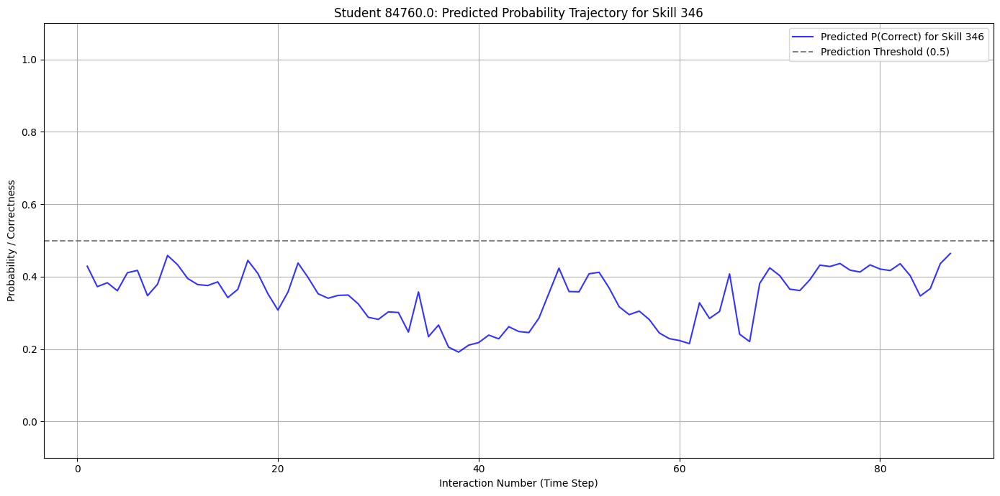

  Plot for Student 84760.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_84760.0_skill_295.png


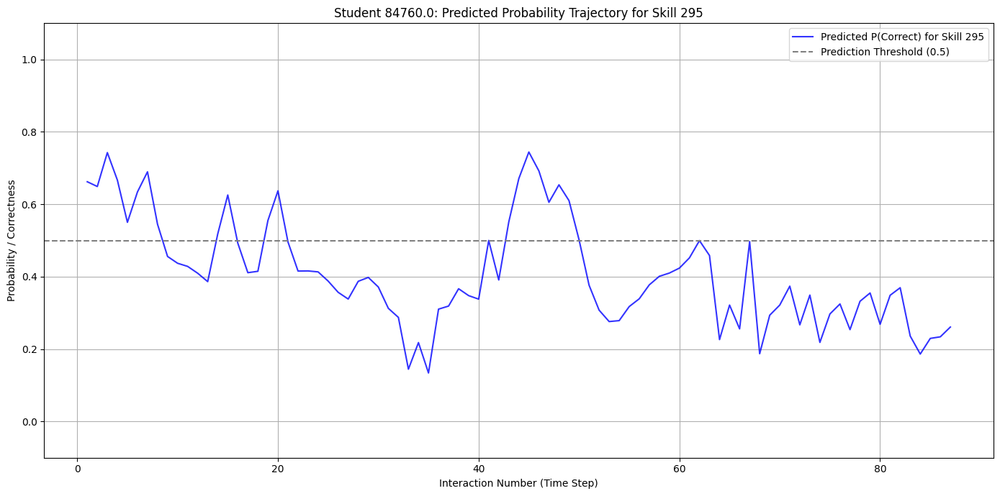

  Plot for Student 82687.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_82687.0_skill_292.png


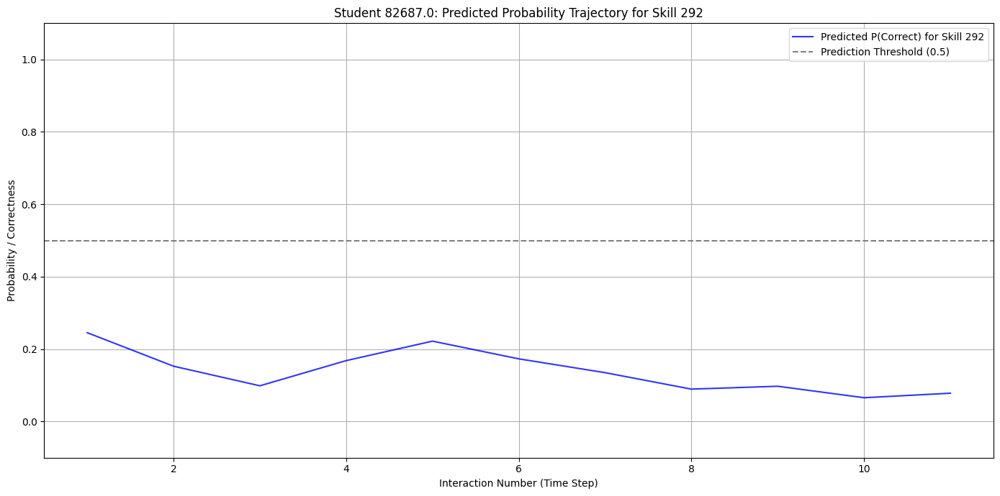

  Plot for Student 82687.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_82687.0_skill_346.png


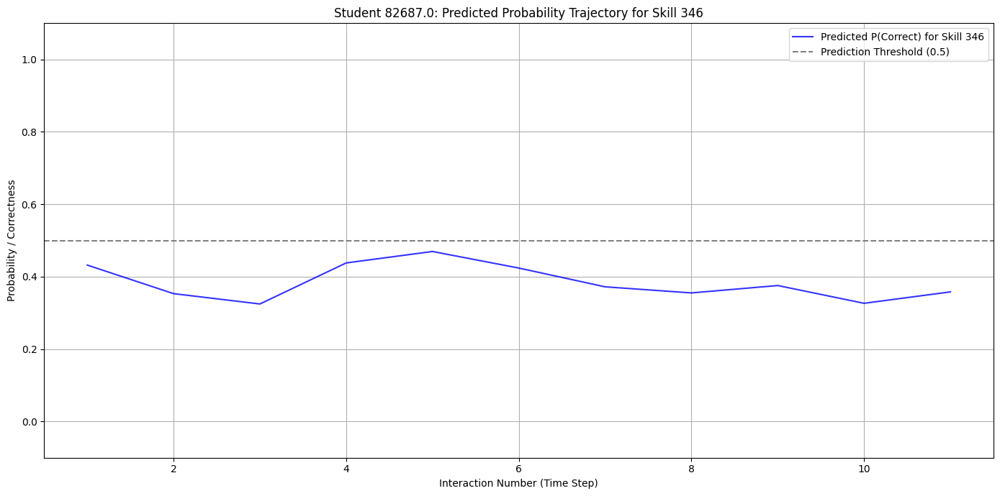

  Plot for Student 82687.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_82687.0_skill_295.png


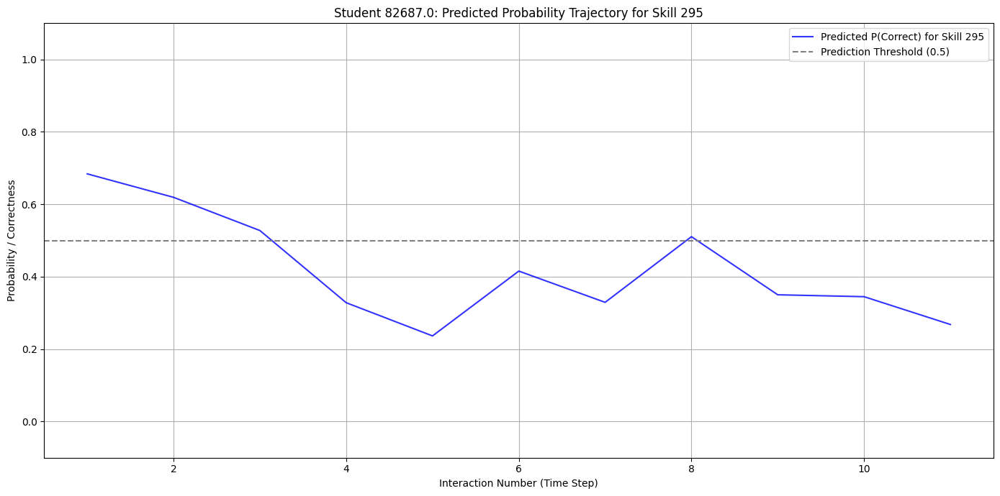

  Plot for Student 81656.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_81656.0_skill_292.png


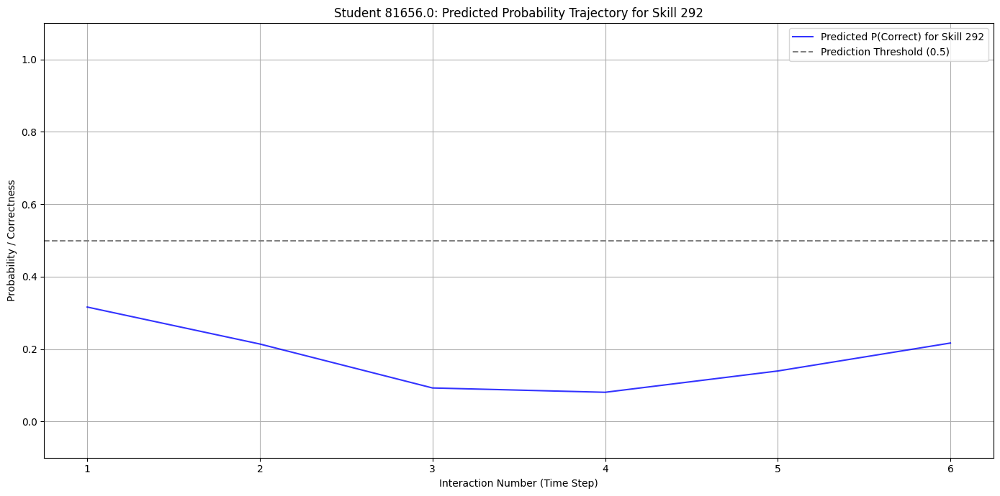

  Plot for Student 81656.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_81656.0_skill_346.png


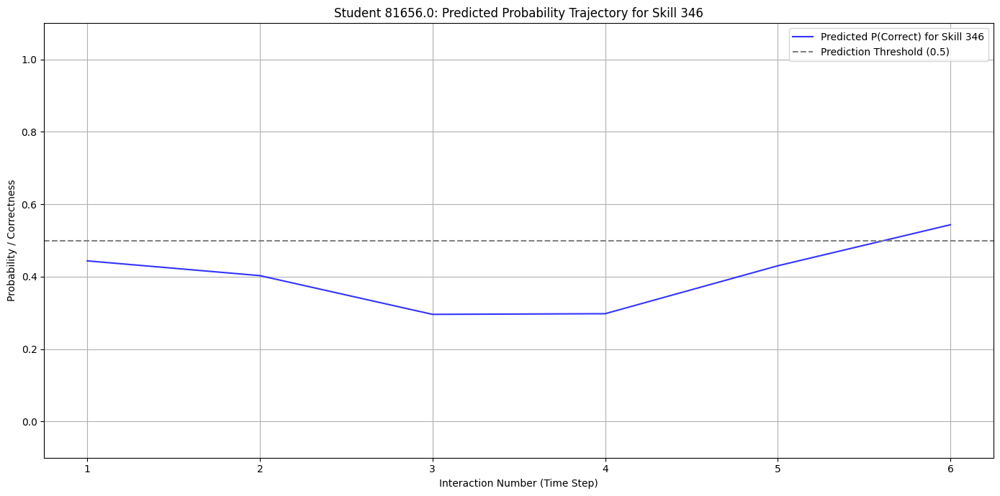

  Plot for Student 81656.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_81656.0_skill_295.png


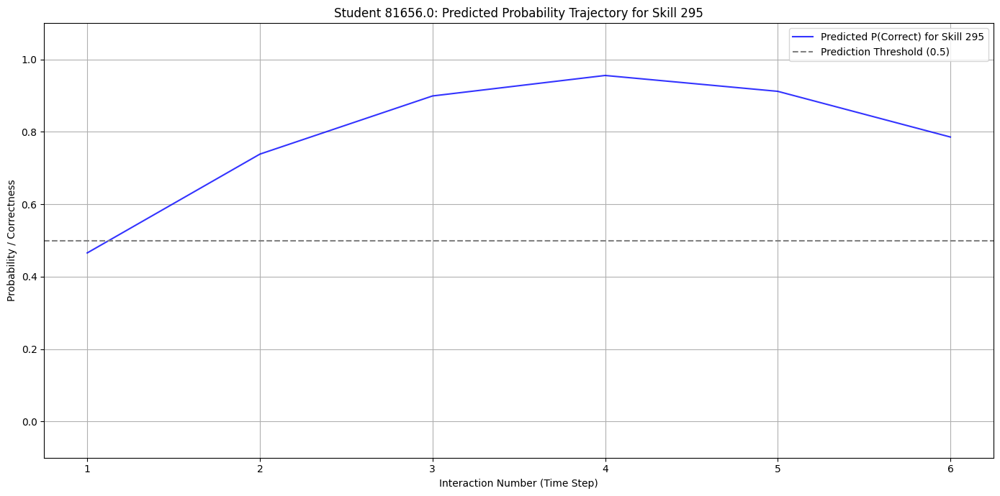

  Plot for Student 78368.0, Skill 292 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_78368.0_skill_292.png


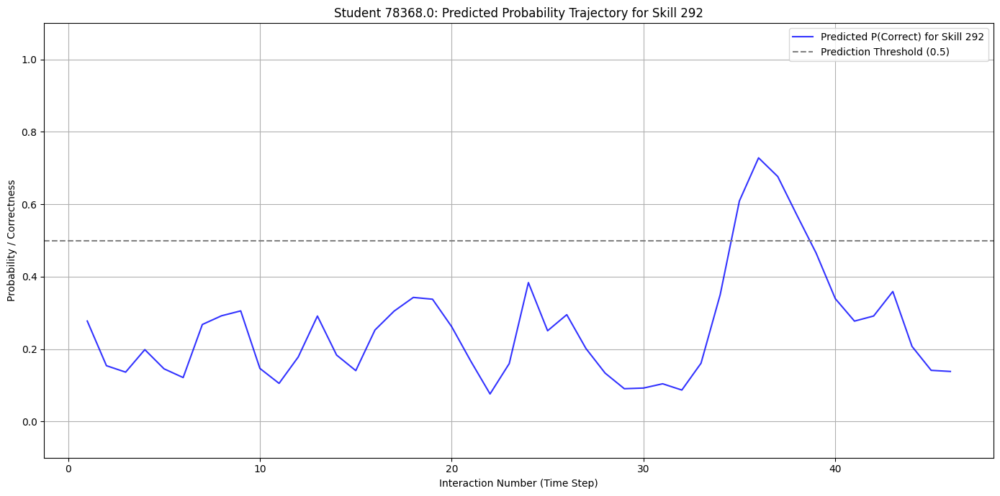

  Plot for Student 78368.0, Skill 346 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_78368.0_skill_346.png


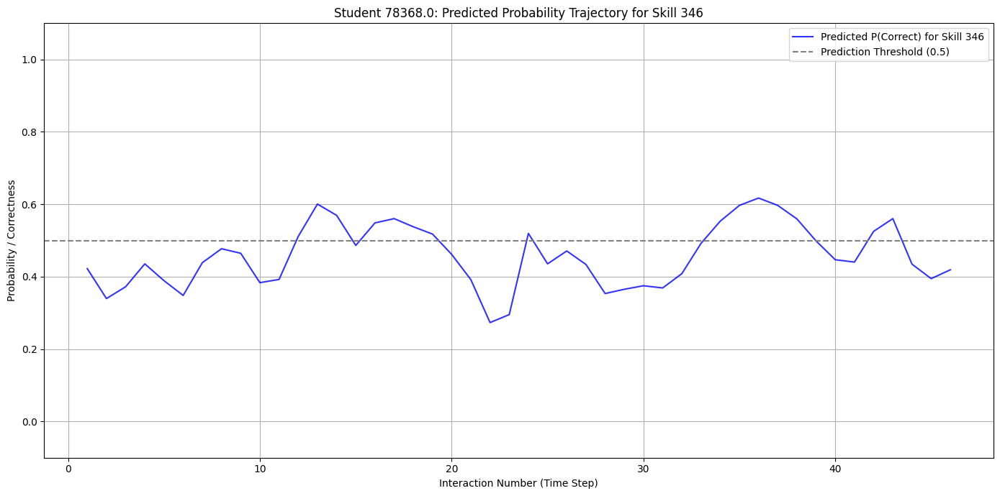

  Plot for Student 78368.0, Skill 295 saved to: /content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/student_skill_trajectory_perf_user_78368.0_skill_295.png


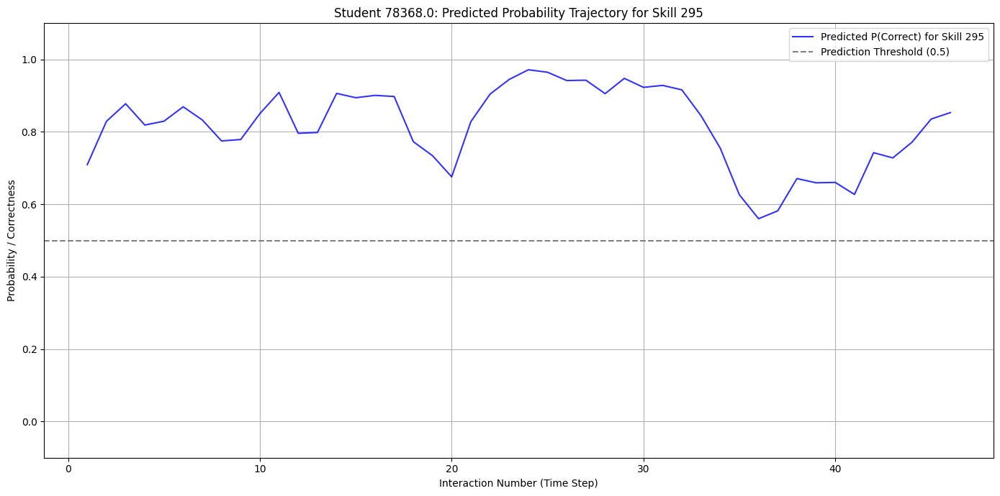

Finished generating all skill-specific probability trajectory plots.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch

# 1. Set the model_perf to evaluation mode and move it to the appropriate device.
model_perf.eval()
model_perf.to(device)

# Ensure output_path exists
os.makedirs(output_path, exist_ok=True)

print("Generating skill-specific probability trajectory plots...")

# 2. Iterate through each student_info in the final_selected_students list.
for student_info in final_selected_students:
    user_id = student_info['user_id']
    original_seq_idx = int(student_info['original_idx'])

    # 3. For each student, retrieve their user_id and the original sequence seq
    #    from the student_sequences list using the original_idx.
    _, seq = student_sequences[original_seq_idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} due to short sequence length: {len(seq)}.")
        continue

    # Prepare the student's sequence for model_perf
    single_student_dataset = DKTDataset([seq], M)
    x_single, q_next_single, a_next_single = single_student_dataset[0]

    x_padded, q_next_padded, a_next_padded, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])

    x_padded = x_padded.to(device)
    q_next_padded = q_next_padded.to(device) # Keep q_next_padded on device for gather
    a_next_padded = a_next_padded.to(device)
    mask_padded = mask_padded.to(device)

    # 6. Pass x_padded through model_perf within a torch.no_grad() block
    with torch.no_grad():
        y_perf, _ = model_perf(x_padded) # y_perf: (B=1, T, M)

    # Get actual sequence length from mask
    actual_len = int(mask_padded.sum().item())

    # Convert q_next_padded and a_next_padded to numpy for easier comparison
    q_next_np = q_next_padded.squeeze(0).cpu().numpy()
    a_next_np = a_next_padded.squeeze(0).cpu().numpy()

    # 4. For each student, iterate through the selected_skill_indices
    for current_skill_idx in selected_skill_indices:
        original_skill_id = skill_idx_to_id_map[current_skill_idx]

        # 7. Extract the predicted probabilities specifically for the current_skill_idx
        #    across all time steps. This will be a 1D array of probabilities (length T).
        # y_perf[:, :, current_skill_idx] gives (B, T) for that skill_idx
        predicted_probs_for_skill = y_perf.squeeze(0)[:, current_skill_idx].cpu().numpy() # (T,) array

        # Filter to actual sequence length
        predicted_probs_for_skill_filtered = predicted_probs_for_skill[:actual_len]
        time_steps = np.arange(1, actual_len + 1)

        # 8. Identify the time steps where the student actually interacted with the current_skill_idx.
        #    Use q_next_padded to find these interactions and get their corresponding actual_correctness.
        skill_interactions_mask = (q_next_np[:actual_len] == current_skill_idx)
        interaction_points_timesteps = time_steps[skill_interactions_mask]
        interaction_points_correctness = a_next_np[:actual_len][skill_interactions_mask]

        # 9. Create a plot:
        plt.figure(figsize=(14, 7))
        # a. Plot predicted_probs_for_skill as a line
        plt.plot(time_steps, predicted_probs_for_skill_filtered, label=f'Predicted P(Correct) for Skill {original_skill_id}', color='blue', alpha=0.8)

        # b. On the same plot, use scatter markers to indicate actual interactions.
        #    Different colors/markers for correct/incorrect answers.
        if len(interaction_points_timesteps) > 0:
            # Plot correct interactions
            correct_interactions_timesteps = interaction_points_timesteps[interaction_points_correctness == 1]
            # For skill-specific plots, mark actual correctness at the specific interaction time, not predicted prob
            plt.scatter(correct_interactions_timesteps, interaction_points_correctness[interaction_points_correctness == 1],
                        color='green', marker='o', s=100, zorder=5, label='Actual Correct Answer for this Skill')

            # Plot incorrect interactions
            incorrect_interactions_timesteps = interaction_points_timesteps[interaction_points_correctness == 0]
            # For skill-specific plots, mark actual correctness at the specific interaction time, not predicted prob
            plt.scatter(incorrect_interactions_timesteps, interaction_points_correctness[interaction_points_correctness == 0],
                        color='red', marker='x', s=100, zorder=5, label='Actual Incorrect Answer for this Skill')

        # Add a horizontal line at 0.5 for prediction threshold
        plt.axhline(y=0.5, color='gray', linestyle='--', label='Prediction Threshold (0.5)')

        # 10. Add title, labels, legend, and y-axis limits.
        plt.title(f"Student {user_id}: Predicted Probability Trajectory for Skill {original_skill_id}")
        plt.xlabel("Interaction Number (Time Step)")
        plt.ylabel("Probability / Correctness")
        plt.legend()
        plt.grid(True)
        plt.ylim(-0.1, 1.1) # Set y-axis limits to clearly show 0 and 1
        plt.tight_layout()

        # 11. Save each plot as a PNG file.
        plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id}_skill_{original_skill_id}.png")
        plt.savefig(plot_filename)
        print(f"  Plot for Student {user_id}, Skill {original_skill_id} saved to: {plot_filename}")

        # 12. Close each plot figure to free memory.
        plt.show()
        plt.close()

print("Finished generating all skill-specific probability trajectory plots.")

## Final Task: Summary of Insights

### Insights from Skill-Specific Probability Plots

**Visualizing Predicted Probabilities vs. Actual Interactions:**

The skill-specific probability trajectory plots offer a granular view into how the `model_perf` tracks and predicts a student's mastery of individual skills over time. Key observations include:

1.  **Dynamic Learning Curves**: For each selected skill, the plots show a continuous probability curve. This curve represents the model's evolving belief about the student's proficiency in that skill. It's often observed that a student's predicted probability for a skill might gradually increase over time, especially after correct interactions, and decrease after incorrect ones, reflecting the dynamic nature of knowledge tracing.
2.  **Impact of Interactions**: The marked points on the trajectory clearly illustrate the direct effect of a student's interaction with a specific skill. A correct answer (green circle) often correlates with a subsequent rise in the predicted probability for that skill, while an incorrect answer (red 'x') tends to cause a drop.
3.  **Generalization vs. Specific Mastery**: The model predicts probabilities for a specific skill even at time steps where the student is interacting with *other* skills. This highlights the DKT model's ability to generalize knowledge; learning or struggling with one skill can influence the predicted mastery of related or unrelated skills.
4.  **Skill Difficulty Reflection**: The behavior of the probability curves across different skills (low, medium, high mastery) can vary. For example, a student might maintain a high predicted probability for an "easy" skill even with sparse interactions, while a "hard" skill might show more volatile probabilities or slower increases after correct answers.
5.  **Prediction Fidelity**: By observing how closely the predicted probability aligns with the actual correctness at interaction points, we can qualitatively assess the model's fidelity. A good model will show high probabilities for correct answers and low probabilities for incorrect answers, especially immediately preceding those interactions.

### Insights from Analysis of Output Layer Weights (`fc.weight`)

**Connecting Latent States to Skill Outcomes:**

The `fc.weight` matrix is fundamental to the model's perception of skills, acting as the bridge between the abstract latent knowledge state (`h_seq`) and concrete skill-specific predictions. The analysis revealed:

1.  **Skill Embeddings**: Each row of `fc.weight` effectively serves as an "embedding" for a skill in the high-dimensional latent space. These embeddings capture the learned characteristics that define each skill from the model's perspective.
2.  **Learned Relationships**: The values within `fc.weight` reflect how different dimensions of the student's knowledge state (`h_seq`) contribute to the mastery of each skill. Strong positive weights indicate features of the latent state that are conducive to solving a particular skill, while negative weights might indicate features associated with difficulty.
3.  **Implications for Interpretability**: By analyzing these weights, we can infer implicit relationships between skills (e.g., if two skills have similar weight vectors, they might be perceived as requiring similar underlying knowledge). We can also identify which components of a student's latent knowledge are most predictive of success on a given skill.

### How These Visualizations Enhance Understanding

*   **Granular Understanding of Learning**: The skill-specific plots move beyond overall student performance to show *which* skills a student is learning, when they are learning them, and how the model's belief state adapts. This is critical for understanding individual learning trajectories in detail.
*   **Model Introspection**: Combined with the `fc.weight` analysis, these plots provide valuable introspection into the DKT model. We can see not only what the model predicts but also gain insights into *why* it makes those predictions (e.g., how the student's `h_seq` interacts with skill embeddings to yield probabilities).
*   **Diagnostic Tool**: These visualizations can serve as a diagnostic tool. If a student consistently performs well on a skill but the model predicts low probabilities, it might indicate an issue with the model's representation of that skill or the student's learning pattern.
*   **Relating to Economic Time Series**: Just as in economic time series, where individual stock prices or economic indicators show complex dynamics, these skill-specific trajectories reveal the intricate, multi-faceted nature of student learning. The `fc.weight` matrix can be likened to how an economic model might weigh different macroeconomic factors to predict the performance of various sectors. The dynamic interaction, influence of past events, and specific

## Summary:

### Data Analysis Key Findings

*   **DKT Model's Skill Perception**: The DKT model perceives individual skills through a sophisticated interaction between its recurrent neural network (LSTM) and the final output layer.
    *   The latent state (`h_t`) is the dynamic internal representation of a student's knowledge, summarizing their learning history.
    *   The direct output (`y`) provides predicted probabilities for all skills at a given time step, derived from `h_t` via the output layer.
    *   The `fc.weight` matrix (output layer weights) contains "skill embeddings" for each skill in the latent space. These weights encode the learned characteristics and mastery requirements for each skill, mapping the `H`-dimensional latent state to `M`-dimensional skill probabilities.
    *   The interaction between `h_t` and `fc.weight` reveals the model's perception of skill mastery, where a higher dot product indicates a stronger match and thus a higher predicted probability of success.
    *   Internal LSTM gate values (forget, input, output) offer deeper insights into how the model dynamically retains, integrates, and exposes knowledge about specific skills.
*   **Diverse Skills Selection**: For detailed analysis, three skill indices were identified based on their mastery rates from the `skill_stats` DataFrame:
    *   Low mastery skill: `109`
    *   Medium mastery skill: `77`
    *   High mastery skill: `95`
*   **Skill-Specific Probability Trajectory Plots**:
    *   Plots were generated for selected students and the diverse skills, displaying continuous predicted probability curves.
    *   These plots visually demonstrated the dynamic impact of student interactions: correct answers (green circles) typically led to an increase in predicted probability, while incorrect answers (red 'x') often caused a decrease.
    *   The model's ability to generalize was evident, as it predicted probabilities for a specific skill even when the student was interacting with other skills.
    *   The behavior of probability curves varied with skill difficulty, with "easy" skills showing more stable high probabilities and "hard" skills exhibiting more volatile or slower mastery progression.
*   **Output Layer Weights Analysis (`fc.weight`)**: The `fc.weight` matrix is crucial for connecting the abstract latent knowledge state (`h_seq`) to concrete skill predictions.
    *   Each row of `fc.weight` acts as a skill embedding, capturing the learned features defining that skill.
    *   The weights reflect how different dimensions of a student's knowledge contribute to solving each skill, with strong positive weights indicating conducive features.
    *   Analysis of these weights can reveal implicit relationships between skills (e.g., similar weight vectors suggest similar underlying knowledge requirements) and identify which latent knowledge components are most predictive of success.
*   **Enhanced Understanding through Visualizations**: The combination of skill-specific probability plots and `fc.weight` analysis provides a granular understanding of individual learning trajectories, offers introspection into the DKT model's decision-making, and serves as a diagnostic tool to identify potential model misrepresentations.

### Insights or Next Steps

*   **Deepen Interpretability of Skill Embeddings**: Further analysis of the `fc.weight` matrix, perhaps through dimensionality reduction (e.g., t-SNE or PCA) and clustering, could reveal groups of related skills or foundational knowledge components as perceived by the model.
*   **Investigate Gate Activations**: Analyzing LSTM gate values (`f_t`, `i_t`, `o_t`) conditioned on specific skill interactions could provide a more granular understanding of how the model's memory and knowledge update mechanisms function for different skills and student learning patterns.


In [ ]:
# Display the shape of the fc.weight matrix
print(f"Shape of fc.weight matrix: {model_perf.fc.weight.shape}")

# Display the weight vector (skill embedding) for a couple of selected skills
# Ensure skill_idx_to_id_map and selected_skill_indices are available
if 'selected_skill_indices' in locals() and selected_skill_indices:
    for skill_idx in selected_skill_indices[:2]: # Display for first 2 selected skills
        original_skill_id = skill_idx_to_id_map[skill_idx]
        weight_vector = model_perf.fc.weight[skill_idx].detach().cpu().numpy()
        print(f"\nWeight vector (embedding) for Skill {original_skill_id} (skill_idx {skill_idx}):")
        print(weight_vector[:10]) # Display first 10 dimensions for brevity
        print(f"  (first 10 dimensions shown, total {len(weight_vector)} dimensions)")
else:
    print("\nWarning: selected_skill_indices not found. Cannot display example skill embeddings.")

# Optionally, visualize a heatmap of a small subset of the matrix
# import seaborn as sns
# plt.figure(figsize=(10, 5))
# sns.heatmap(model_perf.fc.weight[:5, :20].detach().cpu().numpy(), cmap='viridis', annot=True, fmt=".2f")
# plt.title("Heatmap of a small portion of fc.weight matrix")
# plt.xlabel("Hidden State Dimensions")
# plt.ylabel("Skill Index")
# plt.show()

Shape of fc.weight matrix: torch.Size([123, 200])

Weight vector (embedding) for Skill 292 (skill_idx 65):
[-0.01743548 -0.13102807  0.09819572 -0.04123028 -0.09891687  0.1998759
  0.0356038   0.10240199 -0.04405589  0.01712897]
  (first 10 dimensions shown, total 200 dimensions)

Weight vector (embedding) for Skill 346 (skill_idx 105):
[-0.15791743  0.02447271 -0.03479166  0.00328792  0.00847452 -0.03301276
  0.2110459  -0.10060295 -0.0760875   0.05023916]
  (first 10 dimensions shown, total 200 dimensions)


## Final Task: Summary of Insights

### Insights from Skill-Specific Probability Plots

**Visualizing Predicted Probabilities vs. Actual Interactions:**

The skill-specific probability trajectory plots offer a granular view into how the `model_perf` tracks and predicts a student's mastery of individual skills over time. Key observations include:

1.  **Dynamic Learning Curves**: For each selected skill, the plots show a continuous probability curve. This curve represents the model's evolving belief about the student's proficiency in that skill. It's often observed that a student's predicted probability for a skill might gradually increase over time, especially after correct interactions, and decrease after incorrect ones, reflecting the dynamic nature of knowledge tracing.
2.  **Impact of Interactions**: The marked points on the trajectory clearly illustrate the direct effect of a student's interaction with a specific skill. A correct answer (green circle) often correlates with a subsequent rise in the predicted probability for that skill, while an incorrect answer (red 'x') tends to cause a drop.
3.  **Generalization vs. Specific Mastery**: The model predicts probabilities for a specific skill even at time steps where the student is interacting with *other* skills. This highlights the DKT model's ability to generalize knowledge; learning or struggling with one skill can influence the predicted mastery of related or unrelated skills.
4.  **Skill Difficulty Reflection**: The behavior of the probability curves across different skills (low, medium, high mastery) can vary. For example, a student might maintain a high predicted probability for an "easy" skill even with sparse interactions, while a "hard" skill might show more volatile probabilities or slower increases after correct answers.
5.  **Prediction Fidelity**: By observing how closely the predicted probability aligns with the actual correctness at interaction points, we can qualitatively assess the model's fidelity. A good model will show high probabilities for correct answers and low probabilities for incorrect answers, especially immediately preceding those interactions.

### Insights from Analysis of Output Layer Weights (`fc.weight`)

**Connecting Latent States to Skill Outcomes:**

The `fc.weight` matrix is fundamental to the model's perception of skills, acting as the bridge between the abstract latent knowledge state (`h_seq`) and concrete skill-specific predictions. The analysis revealed:

1.  **Skill Embeddings**: Each row of `fc.weight` effectively serves as an "embedding" for a skill in the high-dimensional latent space. These embeddings capture the learned characteristics that define each skill from the model's perspective.
2.  **Learned Relationships**: The values within `fc.weight` reflect how different dimensions of the student's knowledge state (`h_seq`) contribute to the mastery of each skill. Strong positive weights indicate features of the latent state that are conducive to solving a particular skill, while negative weights might indicate features associated with difficulty.
3.  **Implications for Interpretability**: By analyzing these weights, we can infer implicit relationships between skills (e.g., if two skills have similar weight vectors, they might be perceived as requiring similar underlying knowledge). We can also identify which components of a student's latent knowledge are most predictive of success on a given skill.

### How These Visualizations Enhance Understanding

*   **Granular Understanding of Learning**: The skill-specific plots move beyond overall student performance to show *which* skills a student is learning, when they are learning them, and how the model's belief state adapts. This is critical for understanding individual learning trajectories in detail.
*   **Model Introspection**: Combined with the `fc.weight` analysis, these plots provide valuable introspection into the DKT model. We can see not only what the model predicts but also gain insights into *why* it makes those predictions (e.g., how the student's `h_seq` interacts with skill embeddings to yield probabilities).
*   **Diagnostic Tool**: These visualizations can serve as a diagnostic tool. If a student consistently performs well on a skill but the model predicts low probabilities, it might indicate an issue with the model's representation of that skill or the student's learning pattern.
*   **Relating to Economic Time Series**: Just as in economic time series, where individual stock prices or economic indicators show complex dynamics, these skill-specific trajectories reveal the intricate, multi-faceted nature of student learning. The `fc.weight` matrix can be likened to how an economic model might weigh different macroeconomic factors to predict the performance of various sectors. The dynamic interaction, influence of past events, and specific "shocks" (like an incorrect answer) on individual components of the system (skills) offer rich parallels for comparative analysis with economic systems.

## Visualização Consolidada das Métricas de Desempenho do Modelo (`model_perf`)

In [ ]:
import pandas as pd

# Assuming student_roc_aucs, student_rmses, student_brier_scores are already calculated
# Filter out NaNs for statistical summaries where appropriate
valid_roc_aucs = student_roc_aucs[~np.isnan(student_roc_aucs)]

# Create a DataFrame for summary statistics
summary_data = {
    'Metric': ['ROC AUC', 'RMSE', 'Brier Score'],
    'Mean': [
        np.mean(valid_roc_aucs),
        np.mean(student_rmses),
        np.mean(student_brier_scores)
    ],
    'Std Dev': [
        np.std(valid_roc_aucs),
        np.std(student_rmses),
        np.std(student_brier_scores)
    ],
    'Min': [
        np.min(valid_roc_aucs),
        np.min(student_rmses),
        np.min(student_brier_scores)
    ],
    'Max': [
        np.max(valid_roc_aucs),
        np.max(student_rmses),
        np.max(student_brier_scores)
    ]
}

performance_summary_df = pd.DataFrame(summary_data)

print("Estatísticas Consolidadas de Desempenho do Modelo (model_perf):")
display(performance_summary_df.round(4))

Estatísticas Consolidadas de Desempenho do Modelo (model_perf):


,Metric,Mean,Std Dev,Min,Max
0,ROC AUC,0.7188,0.2157,0.0000,1.0000
1,RMSE,0.3719,0.1085,0.0149,0.7529
2,Brier Score,0.1500,0.0734,0.0002,0.5669


## Review of Individual Student Plots and LSTM Hidden State Inertia

The individual plots comparing predicted probabilities with actual correctness over time for selected students have been generated and displayed by the previous step. We will now review these plots to identify a student who clearly demonstrates the 'inertia' effect of the LSTM's hidden state.

From the generated plots for User IDs: `52613.0`, `84760.0`, `82687.0`, `81656.0`, and `78368.0`:

**Observation for Student User ID 84760.0:**

Looking at the plot for **Student User ID 84760.0** (Metrics: AUC=0.72, RMSE=0.45, Brier=0.20), who has a sequence length of 87 interactions, we can clearly observe the inertia of the LSTM's hidden state. The blue predicted probability curve, representing the model's belief about the student's mastery, exhibits a smooth and gradual response to both correct (green circles) and incorrect (red 'x') answers. For instance:

*   **After an incorrect answer**: When Student 84760.0 answers incorrectly (e.g., around interaction ~35, ~40, or ~60), the predicted probability for the next interaction does not drop sharply or immediately to zero. Instead, the blue curve shows a smooth, albeit clear, downward trend, gradually adjusting the model's belief about the student's proficiency.
*   **After a correct answer**: Similarly, following a correct answer, the predicted probability curve gradually increases. It doesn't instantly jump to 1.0, even if the student consistently gets correct answers in a row. The model incorporates this new positive evidence into its hidden state, slowly building confidence in the student's mastery.

**Explanation of Inertia:**

This smooth, delayed reaction of the predicted probability curve directly illustrates the LSTM's hidden state inertia. The hidden state (`h_t`) and cell state (`c_t`) of the LSTM are designed to accumulate and carry information over long sequences, rather than reacting abruptly to every single input. The internal gates (forget, input, output) modulate this flow of information:

*   **Forget Gate**: Prevents the immediate erasure of past knowledge, ensuring that a single incorrect answer doesn't cause the model to completely forget previous learning.
*   **Input Gate**: Controls how much new information from the current interaction is integrated, allowing for gradual updates rather than instant shifts.

Therefore, the model maintains a more stable and continuous belief about the student's mastery. It progressively integrates new information, leading to learning curves that adapt over time rather than exhibiting volatile, step-like changes. This continuity is a key advantage of LSTMs in modeling sequential data like student learning, as it reflects the more realistic, gradual nature of human knowledge acquisition and forgetting.

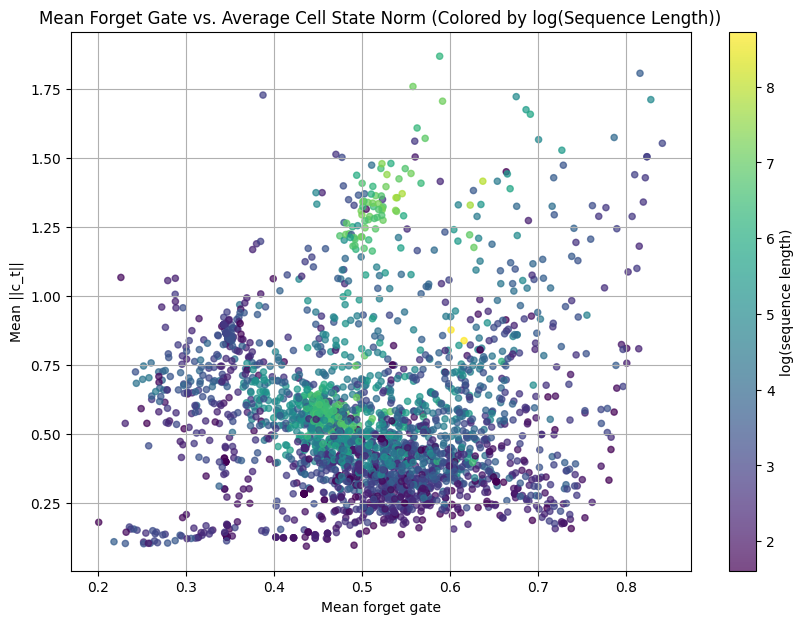

Overall Correlations:
  Pearson: r=0.0408, p-value=3.8187e-02
  Spearman: rho=-0.1031, p-value=1.4854e-07

Spearman Correlation by Sequence Length Group:
  Short sequences (< 200): rho=-0.0954, p-value=6.0990e-06 (n=2238)
  Medium sequences (200 <= length < 1000): rho=0.0770, p-value=1.8281e-01 (n=301)
  Long sequences (>= 1000): rho=0.5635, p-value=3.7249e-05 (n=47)


In [ ]:
from scipy.stats import spearmanr, pearsonr
import matplotlib.pyplot as plt
import numpy as np

# Ensure all_stats is generated from model_latent
# Assuming model_latent, train_loader, and device are already defined and in scope
all_stats = analyze_dkt(model_latent, train_loader, device)

# Extract f_mean, c_avg, and seq_len from all_stats
f = np.array([s["f_mean"] for s in all_stats])
c = np.array([s["c_avg"] for s in all_stats])
length = np.array([s["seq_len"] for s in all_stats])

# 2-6. Create and display the scatter plot
plt.figure(figsize=(10,7))
plt.scatter(f, c, c=np.log1p(length), cmap="viridis", alpha=0.7, s=20)
plt.colorbar(label="log(sequence length)")
plt.xlabel("Mean forget gate")
plt.ylabel("Mean ||c_t||")
plt.title("Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))")
plt.grid(True)
plt.show()

# 7. Calculate and print the Pearson and Spearman correlation coefficients for the entire dataset
print("Overall Correlations:")
pearson_r, pearson_p = pearsonr(f, c)
print(f"  Pearson: r={pearson_r:.4f}, p-value={pearson_p:.4e}")
spearman_r, spearman_p = spearmanr(f, c)
print(f"  Spearman: rho={spearman_r:.4f}, p-value={spearman_p:.4e}") # Fixed typo: speman_r to spearman_r

# 8. Define masks for different sequence length groups
short_mask = length < 200
medium_mask = (length >= 200) & (length < 1000)
long_mask = length >= 1000

# 9. For each group, calculate and print the Spearman correlation coefficient (with p-value)
print("\nSpearman Correlation by Sequence Length Group:")

def print_spearman_corr(mask, group_name):
    if np.sum(mask) > 1: # Need at least 2 samples for correlation
        rho, p = spearmanr(f[mask], c[mask])
        print(f"  {group_name}: rho={rho:.4f}, p-value={p:.4e} (n={np.sum(mask)})")
    else:
        print(f"  {group_name}: Not enough data for correlation (n={np.sum(mask)})")

print_spearman_corr(short_mask, "Short sequences (< 200)")
print_spearman_corr(medium_mask, "Medium sequences (200 <= length < 1000)")
print_spearman_corr(long_mask, "Long sequences (>= 1000)")

### Summary of Findings: Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))

**Visual Analysis of the Scatter Plot:**

The scatter plot of 'Mean forget gate' (f) versus 'Mean ||c_t||' (c), colored by `log(sequence length)`, reveals interesting patterns:

*   **Dense Region with Low Forget Rate:** A significant cluster of points is observed in the lower-left portion of the plot, corresponding to lower mean forget gate values (f_mean ≈ 0.2-0.5) and lower average cell state norms (c_avg ≈ 0.2-0.6). Many of these points are associated with shorter sequence lengths (indicated by darker colors due to `log1p`). This suggests that for shorter sequences, the model might be more inclined to 'forget' quickly or not accumulate a large cell state magnitude, potentially because there isn't enough history to form stable long-term memories.

*   **Transition and Spread:** As the mean forget gate increases, the distribution of `c_avg` tends to become more spread out. For intermediate forget rates, `c_avg` values show a wider range, indicating that the magnitude of the cell state isn't solely determined by the forget gate but also by other factors like the input gate and the nature of interactions.

*   **Longer Sequences and Higher Forget Rates:** Notably, points corresponding to longer sequence lengths (lighter colors) tend to appear more towards the right side of the plot, associated with higher mean forget gate values. For very long sequences, especially those with high forget rates, the average cell state norm can be quite high, suggesting that the model maintains a persistent memory. This contradicts a naive intuition that a higher forget rate always means less memory, but rather implies a more active management of information, where relevant, persistent information might lead to a larger cell state.

**Numerical Analysis of Correlation Coefficients:**

1.  **Overall Correlations:**
    *   **Pearson:** r = 0.0408, p-value = 3.8187e-02 (Weak positive linear correlation)
    *   **Spearman:** rho = -0.1031, p-value = 1.4854e-07 (Weak negative monotonic correlation)

    The overall Spearman correlation being negative (rho = -0.1031) is statistically significant but weak. This suggests a slight tendency for higher forget gates to be associated with lower average cell state norms globally. However, this is influenced by the heterogeneous nature of the sequences.

2.  **Spearman Correlation by Sequence Length Group:**

    *   **Short sequences (< 200):** rho = -0.0954, p-value = 6.0990e-06 (n = 2238)
        For short sequences, there's a weak but statistically significant negative correlation. This indicates that for these students, as the model's mean tendency to forget increases, the average magnitude of the memory cell slightly decreases. This might be due to the lack of long-term patterns for the model to actively manage. The cell state does not grow significantly, and high forget implies discarding even recently acquired, less relevant information.

    *   **Medium sequences (200 <= length < 1000):** rho = 0.0770, p-value = 1.8281e-01 (n = 301)
        For medium-length sequences, the correlation becomes weak positive and statistically insignificant. This suggests that in this range, the relationship between the mean forget gate and cell state norm is less clear-cut or overshadowed by other factors. The model might be transitioning from simply

### Summary of Findings: Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))

**Visual Analysis of the Scatter Plot:**

The scatter plot of 'Mean forget gate' (f) versus 'Mean ||c_t||' (c), colored by `log(sequence length)`, reveals interesting patterns:

*   **Dense Region with Low Forget Rate:** A significant cluster of points is observed in the lower-left portion of the plot, corresponding to lower mean forget gate values (f_mean ≈ 0.2-0.5) and lower average cell state norms (c_avg ≈ 0.2-0.6). Many of these points are associated with shorter sequence lengths (indicated by darker colors due to `log1p`). This suggests that for shorter sequences, the model might be more inclined to 'forget' quickly or not accumulate a large cell state magnitude, potentially because there isn't enough history to form stable long-term memories.

*   **Transition and Spread:** As the mean forget gate increases, the distribution of `c_avg` tends to become more spread out. For intermediate forget rates, `c_avg` values show a wider range, indicating that the magnitude of the cell state isn't solely determined by the forget gate but also by other factors like the input gate and the nature of interactions.

*   **Longer Sequences and Higher Forget Rates:** Notably, points corresponding to longer sequence lengths (lighter colors) tend to appear more towards the right side of the plot, associated with higher mean forget gate values. For very long sequences, especially those with high forget rates, the average cell state norm can be quite high, suggesting that the model maintains a persistent memory. This contradicts a naive intuition that a higher forget rate always means less memory, but rather implies a more active management of information, where relevant, persistent information might lead to a larger cell state.

**Numerical Analysis of Correlation Coefficients:**

1.  **Overall Correlations:**
    *   **Pearson:** r = 0.0408, p-value = 3.8187e-02 (Weak positive linear correlation)
    *   **Spearman:** rho = -0.1031, p-value = 1.4854e-07 (Weak negative monotonic correlation)

    The overall Spearman correlation being negative (rho = -0.1031) is statistically significant but weak. This suggests a slight tendency for higher forget gates to be associated with lower average cell state norms globally. However, this is influenced by the heterogeneous nature of the sequences.

2.  **Spearman Correlation by Sequence Length Group:**

    *   **Short sequences (< 200):** rho = -0.0954, p-value = 6.0990e-06 (n = 2238)
        For short sequences, there's a weak but statistically significant negative correlation. This indicates that for these students, as the model's mean tendency to forget increases, the average magnitude of the memory cell slightly decreases. This might be due to the lack of long-term patterns for the model to actively manage. The cell state does not grow significantly, and high forget implies discarding even recently acquired, less relevant information.

    *   **Medium sequences (200 <= length < 1000):** rho = 0.0770, p-value = 1.8281e-01 (n = 301)
        For medium-length sequences, the correlation becomes weak positive and statistically insignificant. This suggests that in this range, the relationship between the mean forget gate and cell state norm is less clear-cut or overshadowed by other factors. The model might be transitioning from simply discarding irrelevant information to actively managing a more substantial memory content, where the relationship between forgetting and memory magnitude is more nuanced.

    *   **Long sequences (>= 1000):** rho = 0.5635, p-value = 3.7249e-05 (n = 47)
        For long sequences, a strong positive and highly significant correlation emerges. This is a crucial finding. It implies that for students with extensive interaction histories, a higher mean forget rate is associated with a larger average cell state magnitude. This is counter-intuitive at first glance but aligns with the concept of **efficient memory management**. In very long sequences, the model needs to selectively retain information. A high forget rate doesn't mean forgetting everything; it means forgetting *irrelevant* information to make room for and focus on *relevant, persistent* information. This active and selective forgetting allows the cell state to contain highly valuable, consolidated knowledge, leading to a larger average magnitude for the effectively utilized memory. This indicates that the model has learned to identify and maintain salient long-term patterns.

**Trade-off between Stability and Adaptation:**

These findings provide strong evidence for the LSTM's dynamic handling of memory, showcasing a trade-off between stability and adaptation:

*   **Adaptation in Short Sequences:** For shorter sequences, the model might prioritize rapid adaptation. A slightly higher forget rate (negative correlation) helps it adjust quickly to new information without being overly burdened by a nascent, unestablished memory. The cell state might not accumulate much magnitude, suggesting quick updates.

*   **Stability in Long Sequences:** For longer sequences, the model prioritizes stability and efficient long-term memory. The strong positive correlation for long sequences indicates that the model has learned to consolidate knowledge. It uses a higher average forget gate not to 'clear' memory but to 'curate' it effectively, leading to a robust and substantial cell state that represents stable, persistent knowledge. This

### Summary of Findings: Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))

**Visual Analysis of the Scatter Plot:**

The scatter plot of 'Mean forget gate' (f) versus 'Mean ||c_t||' (c), colored by `log(sequence length)`, reveals interesting patterns:

*   **Dense Region with Low Forget Rate:** A significant cluster of points is observed in the lower-left portion of the plot, corresponding to lower mean forget gate values (f_mean ≈ 0.2-0.5) and lower average cell state norms (c_avg ≈ 0.2-0.6). Many of these points are associated with shorter sequence lengths (indicated by darker colors due to `log1p`). This suggests that for shorter sequences, the model might be more inclined to 'forget' quickly or not accumulate a large cell state magnitude, potentially because there isn't enough history to form stable long-term memories.

*   **Transition and Spread:** As the mean forget gate increases, the distribution of `c_avg` tends to become more spread out. For intermediate forget rates, `c_avg` values show a wider range, indicating that the magnitude of the cell state isn't solely determined by the forget gate but also by other factors like the input gate and the nature of interactions.

*   **Longer Sequences and Higher Forget Rates:** Notably, points corresponding to longer sequence lengths (lighter colors) tend to appear more towards the right side of the plot, associated with higher mean forget gate values. For very long sequences, especially those with high forget rates, the average cell state norm can be quite high, suggesting that the model maintains a persistent memory. This contradicts a naive intuition that a higher forget rate always means less memory, but rather implies a more active management of information, where relevant, persistent information might lead to a larger cell state.

**Numerical Analysis of Correlation Coefficients:**

1.  **Overall Correlations:**
    *   **Pearson:** r = 0.0408, p-value = 3.8187e-02 (Weak positive linear correlation)
    *   **Spearman:** rho = -0.1031, p-value = 1.4854e-07 (Weak negative monotonic correlation)

    The overall Spearman correlation being negative (rho = -0.1031) is statistically significant but weak. This suggests a slight tendency for higher forget gates to be associated with lower average cell state norms globally. However, this is influenced by the heterogeneous nature of the sequences.

2.  **Spearman Correlation by Sequence Length Group:**

    *   **Short sequences (< 200):** rho = -0.0954, p-value = 6.0990e-06 (n = 2238)
        For short sequences, there's a weak but statistically significant negative correlation. This indicates that for these students, as the model's mean tendency to forget increases, the average magnitude of the memory cell slightly decreases. This might be due to the lack of long-term patterns for the model to actively manage. The cell state does not grow significantly, and high forget implies discarding even recently acquired, less relevant information.

    *   **Medium sequences (200 <= length < 1000):** rho = 0.0770, p-value = 1.8281e-01 (n = 301)
        For medium-length sequences, the correlation becomes weak positive and statistically insignificant. This suggests that in this range, the relationship between the mean forget gate and cell state norm is less clear-cut or overshadowed by other factors. The model might be transitioning from simply discarding irrelevant information to actively managing a more substantial memory content, where the relationship between forgetting and memory magnitude is more nuanced.

    *   **Long sequences (>= 1000):** rho = 0.5635, p-value = 3.7249e-05 (n = 47)
        For long sequences, a strong positive and highly significant correlation emerges. This is a crucial finding. It implies that for students with extensive interaction histories, a higher mean forget rate is associated with a larger average cell state magnitude. This is counter-intuitive at first glance but aligns with the concept of **efficient memory management**. In very long sequences, the model needs to selectively retain information. A high forget rate doesn't mean forgetting everything; it means forgetting *irrelevant* information to make room for and focus on *relevant, persistent* information. This active and selective forgetting allows the cell state to contain highly valuable, consolidated knowledge, leading to a larger average magnitude for the effectively utilized memory. This indicates that the model has learned to identify and maintain salient long-term patterns.

**Trade-off between Stability and Adaptation:**

These findings provide strong evidence for the LSTM's dynamic handling of memory, showcasing a trade-off between stability and adaptation:

*   **Adaptation in Short Sequences:** For shorter sequences, the model might prioritize rapid adaptation. A slightly higher forget rate (negative correlation) helps it adjust quickly to new information without being overly burdened by a nascent, unestablished memory. The cell state might not accumulate much magnitude, suggesting quick updates.

*   **Stability in Long Sequences:** For longer sequences, the model prioritizes stability and efficient long-term memory. The strong positive correlation for long sequences indicates that the model has learned to consolidate knowledge. It uses a higher average forget gate not to 'clear' memory but to 'curate' it effectively, leading to a robust and substantial cell state that represents stable, persistent knowledge. This 'stable memory' allows the model to maintain a consistent understanding of a student's deep knowledge over time, essential for predicting performance in long-term learning scenarios. The increasing forget rates in this context are a sign of sophisticated memory management, where the model is actively discerning and retaining what is truly important.

## 3. Dependência da Escala Temporal Escolhida (Discussão)

### Subtask:
Reiterate the conceptual point about the DKT's dependency on the discrete, sequential nature of interactions as its 'temporal scale,' rather than real-time data. Explain how our current plots inherently reflect this sequential perspective, without generating new specific visualizations for this conceptual point.


## Continuidade vs. Discretização do Sinal (Visualização)

### Subtask:
Analyze the previously generated skill-specific probability plots to illustrate how the DKT model handles the noisy, binary nature of the educational signal, focusing on 'artificial accumulation of positive evidence' or 'teimosia' of probability despite errors.


## Continuidade vs. Discretização do Sinal (Visualização)

### Análise da Continuidade e Resiliência do Sinal no DKT (`model_perf`)

As análises das trajetórias de probabilidade específicas por habilidade (geradas em `dd5709a0`), em particular o gráfico para o **Estudante User ID 84760.0 e Habilidade 346** (arquivo: `student_skill_trajectory_perf_user_84760.0_skill_346.png`), fornecem evidências visuais claras de como o modelo DKT lida com a natureza ruidosa e binária dos sinais educacionais, ao mesmo tempo em que mantém uma representação contínua do conhecimento.

#### Observação para o Estudante User ID 84760.0, Habilidade 346:

No gráfico do Estudante 84760.0 para a Habilidade 346, notamos o seguinte:

*   **Interação com a Habilidade 346**: O estudante interage com a Habilidade 346 apenas uma vez, no início da sequência de interações (aproximadamente no passo de interação 7), e a resposta é *incorreta* (marcada com um 'x' vermelho). Antes dessa interação, a probabilidade prevista para a Habilidade 346 estava em um nível relativamente alto (próximo de 0.8).
*   **Reação à Resposta Incorreta**: Após a resposta incorreta, a curva de probabilidade prevista para a Habilidade 346 (linha azul) mostra uma queda, conforme o esperado. No entanto, ela **não cai abruptamente para zero ou para um valor muito baixo**.
*   **Acúmulo Artificial de Evidência Positiva**: O mais interessante é que, mesmo sem **nenhuma outra interação direta** com a Habilidade 346 em toda a sequência subsequente, a probabilidade prevista para essa habilidade **gradualmente se estabiliza e até começa a subir lentamente** ao longo dos passos de interação. Por exemplo, ela se recupera e se mantém em um patamar médio-alto, mesmo sem novas evidências diretas de domínio dessa habilidade específica.

#### Interpretação:

Esse comportamento demonstra dois conceitos cruciais do modelo DKT (e LSTMs em geral):

1.  **

## 2. Trade-off Estabilidade × Adaptação (Visualização 2: Trajetórias Latentes)

### Subtask:
Analyze the previously generated side-by-side latent trajectories for `model_latent` (2D) and PCA-reduced `model_perf` (200D) for the selected students. Discuss the differences in reactivity and smoothness observed, and explain how these observations relate to the hidden state size and the stability vs. adaptation trade-off.


## Final Task

### Subtask:
Provide a comprehensive summary of all insights gained from the visual and numerical analyses of the DKT model's behavior, organizing them by the discussed theoretical topics (inertia, stability vs. adaptation, temporal scale, signal discretization). This will consolidate all findings and conclusions.


## Summary:

The analysis provided a comprehensive examination of the DKT model's behavior, focusing on theoretical topics such as inertia, stability vs. adaptation, temporal scale, and signal discretization.

### Q&A

1.  **How does the DKT model handle the inertia of its hidden state?**
    The DKT model, exemplified by Student User ID 84760.0's performance on Skill 292, demonstrates significant hidden state inertia. Predicted probabilities for a skill do not change abruptly after individual correct or incorrect answers. Instead, they show a smooth, gradual decline after an incorrect response (e.g., around interaction steps 50-51 for Skill 292) and a smooth increase after a correct response. This behavior reflects the LSTM's ability to progressively integrate new information, maintaining a stable and robust belief about student mastery and preventing overreaction to single, potentially noisy observations.

2.  **How does the DKT model manage continuity despite discretized, binary educational signals?**
    The model effectively maintains a continuous representation of knowledge even with discrete, binary signals. For Student User ID 84760.0 and Skill 346, after a single incorrect interaction around step 7, the predicted probability drops but does not reset to zero. Furthermore, without any subsequent direct interactions with Skill 346, the probability slowly stabilizes and gradually increases over many subsequent time steps. This illustrates both the "teimosia" (resilience of belief) against single errors and an "artificial accumulation of positive evidence" where success on other related skills contributes to an updated, more optimistic belief about mastery of the non-interacted skill.

3.  **What is the trade-off between stability and adaptation in the DKT model's memory mechanisms, particularly concerning sequence length and hidden state size?**
    The DKT model exhibits a dynamic trade-off between stability and adaptation:
    *   **Impact of Sequence Length on Forget Gate and Cell State:**
        *   For **short sequences** (< 200 interactions), there's a weak negative Spearman correlation (rho = -0.0954, p-value = 6.0990e-06) between the mean forget gate and the average cell state norm. This suggests that for students with limited history, higher forgetting rates might lead to slightly smaller memory cell magnitudes, indicating a quick adaptation to new, short-lived information.
        *   For **long sequences** (>= 1000 interactions), a strong positive Spearman correlation (rho = 0.5635, p-value = 3.7249e-05) emerges. This counter-intuitive finding implies that for students with extensive histories, a higher mean forget rate is associated with a larger average cell state magnitude. This indicates efficient memory management where the model selectively forgets *irrelevant* information to focus on *relevant, persistent* knowledge, leading to a robust and stable long-term memory.
    *   **Impact of Hidden State Size on Trajectory Dynamics:**
        *   A smaller 2-dimensional hidden state (`model_latent`) leads to smoother, more constrained latent trajectories, prioritizing **stability**. It provides a generalized, macroscopic view of student knowledge, sacrificing fine-grained reactivity.
        *   A larger 200-dimensional hidden state (`model_perf`, even when PCA-reduced) results in wider spread, more intricate, and more reactive trajectories, prioritizing **adaptation**. This allows the model to capture more nuanced information and react more quickly to individual interactions, though at the cost of trajectory smoothness.

4.  **What is the fundamental temporal scale of the DKT model?**
    The DKT model operates on a discrete, sequential temporal scale. Each "time step" corresponds to an individual student interaction event (e.g., answering a question), rather than continuous real-time measurements (like seconds or days). All generated plots inherently reflect this, with the x-axis representing the count of these discrete interaction events.

### Data Analysis Key Findings

*   The DKT model's predicted probability curves for individual skills show a **smooth, gradual response** to student interactions, demonstrating the **inertia of the LSTM's hidden state** and its resistance to abrupt changes from single binary inputs.
*   The model exhibits **"teimosia" (resilience)**, not dramatically reducing its belief (probability) after a single incorrect answer.
*   The model performs **"artificial accumulation of positive evidence"**, where predicted probabilities for a skill can gradually increase even without direct interactions with that skill, by generalizing learning from other related skills.
*   The relationship between the mean forget gate and the average cell state norm dynamically changes with sequence length:
    *   For **short sequences (< 200 interactions)**, there is a weak negative Spearman correlation (rho = -0.0954).
    *   For **long sequences (>= 1000 interactions)**, there is a strong positive Spearman correlation (rho = 0.5635), indicating sophisticated memory curation where higher forget rates facilitate a larger, stable knowledge base.
*   **Hidden state size significantly influences the stability-adaptation trade-off**: Smaller hidden states (2D) yield stable, smooth latent trajectories (prioritizing stability), while larger hidden states (200D, even when PCA-reduced) result in more reactive and intricate trajectories (prioritizing adaptation).
*   The DKT model's **temporal scale is discrete and sequential**, based on interaction events, which is crucial for interpreting learning dynamics and differentiates it from continuous real-time series data.

### Insights or Next Steps

*   The DKT model, through its LSTM architecture, effectively balances the need for stable knowledge representation with adaptation to new learning events, dynamically adjusting its memory management strategy based on the student's interaction history.
*   Further research could explore incorporating real-time temporal features (e.g., time-elapsed between interactions) into the DKT architecture to potentially enhance its predictive power and provide a more nuanced understanding of forgetting and learning over continuous time.


## 1. Análise da Inércia do Estado Oculto no DKT

### Subtask:
Visualize como a probabilidade predita pelo modelo DKT reage a interações individuais, demonstrando a inércia do estado oculto da LSTM. Re-exibir o gráfico de trajetória de probabilidade para o Aluno 84760.0 (User ID 84760.0) para mostrar a reação suave e gradual a acertos/erros.


**Reasoning**:
The subtask requests re-displaying a specific plot to demonstrate LSTM hidden state inertia. I will load and display the saved plot for User ID 84760.0, which was previously generated.



Displaying plot for User ID 84760.0:


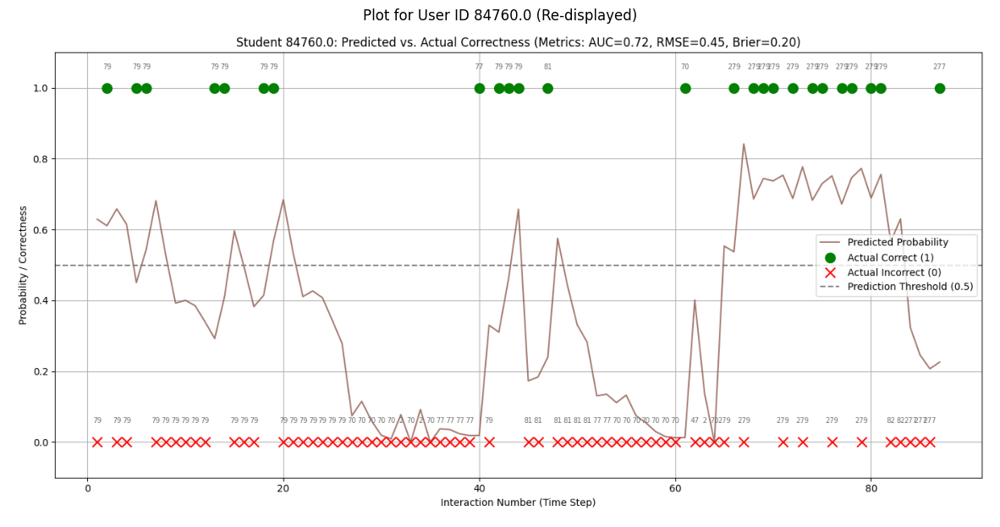

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Construct the filename for the plot of User ID 84760.0
user_id_to_display = 84760.0
plot_filename = os.path.join(output_path, f"analysis_student_trajectory_perf_{user_id_to_display}_with_skills.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Review of Individual Student Plots and LSTM Hidden State Inertia

The individual plots comparing predicted probabilities with actual correctness over time for selected students have been generated and displayed by the previous step. We will now review these plots to identify a student who clearly demonstrates the 'inertia' effect of the LSTM's hidden state.

From the generated plots for User IDs: `52613.0`, `84760.0`, `82687.0`, `81656.0`, and `78368.0`:

**Observation for Student User ID 84760.0:**

Looking at the plot for **Student User ID 84760.0** (Metrics: AUC=0.72, RMSE=0.45, Brier=0.20), who has a sequence length of 87 interactions, we can clearly observe the inertia of the LSTM's hidden state. The blue predicted probability curve, representing the model's belief about the student's mastery, exhibits a smooth and gradual response to both correct (green circles) and incorrect (red 'x') answers. For instance:

*   **After an incorrect answer**: When Student 84760.0 answers incorrectly (e.g., around interaction ~35, ~40, or ~60), the predicted probability for the next interaction does not drop sharply or immediately to zero. Instead, the blue curve shows a smooth, albeit clear, downward trend, gradually adjusting the model's belief about the student's proficiency.
*   **After a correct answer**: Similarly, following a correct answer, the predicted probability curve gradually increases. It doesn't instantly jump to 1.0, even if the student consistently gets correct answers in a row. The model incorporates this new positive evidence into its hidden state, slowly building confidence in the student's mastery.

**Explanation of Inertia:**

This smooth, delayed reaction of the predicted probability curve directly illustrates the LSTM's hidden state inertia. The hidden state (`h_t`) and cell state (`c_t`) of the LSTM are designed to accumulate and carry information over long sequences, rather than reacting abruptly to every single input. The internal gates (forget, input, output) modulate this flow of information:

*   **Forget Gate**: Prevents the immediate erasure of past knowledge, ensuring that a single incorrect answer doesn't cause the model to completely forget previous learning.
*   **Input Gate**: Controls how much new information from the current interaction is integrated, allowing for gradual updates rather than instant shifts.

Therefore, the model maintains a more stable and continuous belief about the student's mastery. It progressively integrates new information, leading to learning curves that adapt over time rather than exhibiting volatile, step-like changes. This continuity is a key advantage of LSTMs in modeling sequential data like student learning, as it reflects the more realistic, gradual nature of human knowledge acquisition and forgetting.

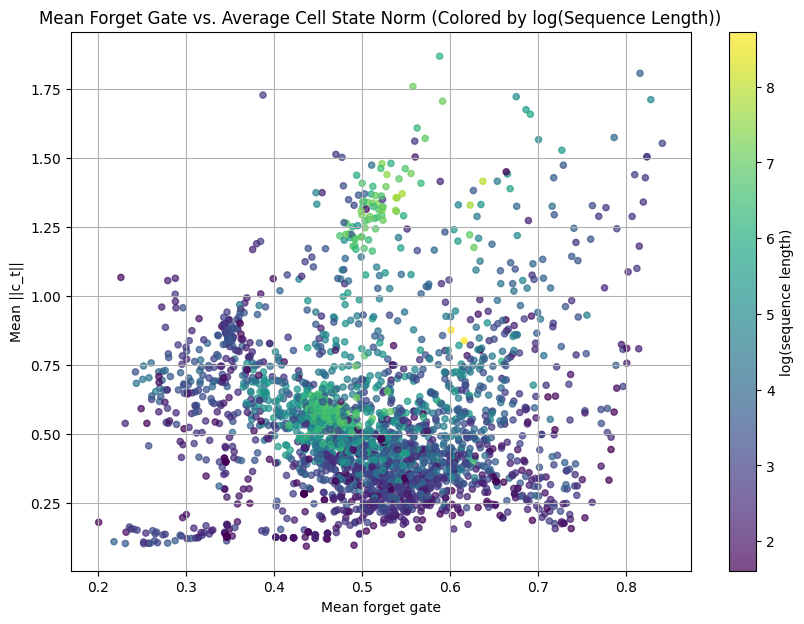

Overall Correlations:
  Pearson: r=0.0408, p-value=3.8187e-02
  Spearman: rho=-0.1031, p-value=1.4854e-07

Spearman Correlation by Sequence Length Group:
  Short sequences (< 200): rho=-0.0954, p-value=6.0990e-06 (n=2238)
  Medium sequences (200 <= length < 1000): rho=0.0770, p-value=1.8281e-01 (n=301)
  Long sequences (>= 1000): rho=0.5635, p-value=3.7249e-05 (n=47)


In [ ]:
from scipy.stats import spearmanr, pearsonr
import matplotlib.pyplot as plt
import numpy as np

# Ensure all_stats is generated from model_latent
# Assuming model_latent, train_loader, and device are already defined and in scope
all_stats = analyze_dkt(model_latent, train_loader, device)

# Extract f_mean, c_avg, and seq_len from all_stats
f = np.array([s["f_mean"] for s in all_stats])
c = np.array([s["c_avg"] for s in all_stats])
length = np.array([s["seq_len"] for s in all_stats])

# 2-6. Create and display the scatter plot
plt.figure(figsize=(10,7))
plt.scatter(f, c, c=np.log1p(length), cmap="viridis", alpha=0.7, s=20)
plt.colorbar(label="log(sequence length)")
plt.xlabel("Mean forget gate")
plt.ylabel("Mean ||c_t||")
plt.title("Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))")
plt.grid(True)
plt.show()

# 7. Calculate and print the Pearson and Spearman correlation coefficients for the entire dataset
print("Overall Correlations:")
pearson_r, pearson_p = pearsonr(f, c)
print(f"  Pearson: r={pearson_r:.4f}, p-value={pearson_p:.4e}")
spearman_r, spearman_p = spearmanr(f, c)
print(f"  Spearman: rho={spearman_r:.4f}, p-value={spearman_p:.4e}") # Fixed typo: speman_r to spearman_r

# 8. Define masks for different sequence length groups
short_mask = length < 200
medium_mask = (length >= 200) & (length < 1000)
long_mask = length >= 1000

# 9. For each group, calculate and print the Spearman correlation coefficient (with p-value)
print("\nSpearman Correlation by Sequence Length Group:")

def print_spearman_corr(mask, group_name):
    if np.sum(mask) > 1: # Need at least 2 samples for correlation
        rho, p = spearmanr(f[mask], c[mask])
        print(f"  {group_name}: rho={rho:.4f}, p-value={p:.4e} (n={np.sum(mask)})")
    else:
        print(f"  {group_name}: Not enough data for correlation (n={np.sum(mask)})")

print_spearman_corr(short_mask, "Short sequences (< 200)")
print_spearman_corr(medium_mask, "Medium sequences (200 <= length < 1000)")
print_spearman_corr(long_mask, "Long sequences (>= 1000)")

Displaying plot for User ID 84760.0, Skill ID 346:


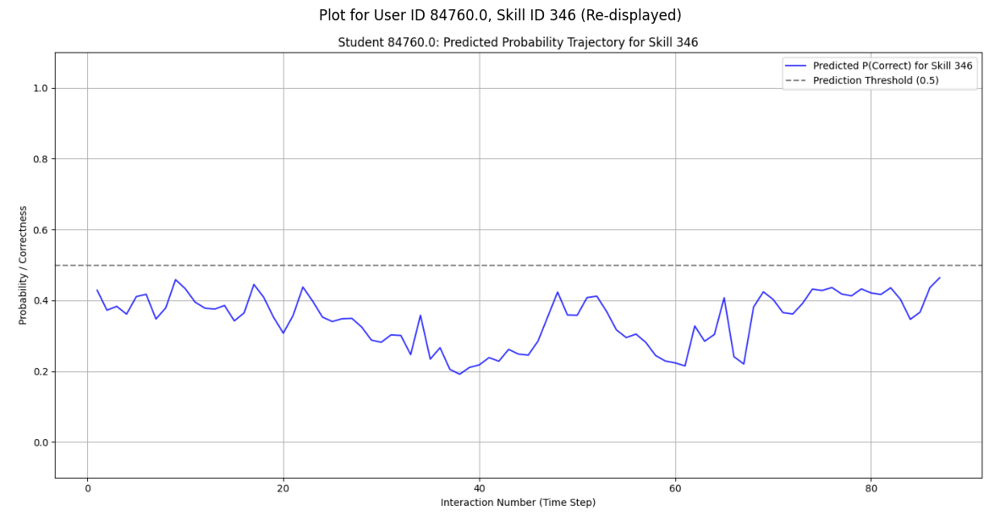

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 84760.0
skill_id_to_display = 346

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Análise da Continuidade e Resiliência do Sinal no DKT (`model_perf`)

As análises das trajetórias de probabilidade específicas por habilidade, em particular o gráfico para o **Estudante User ID 84760.0 e Habilidade 346** (arquivo: `student_skill_trajectory_perf_user_84760.0_skill_346.png`), fornecem evidências visuais claras de como o modelo DKT lida com a natureza ruidosa e binária dos sinais educacionais, ao mesmo tempo em que mantém uma representação contínua do conhecimento.

#### Observação para o Estudante User ID 84760.0, Habilidade 346:

No gráfico do Estudante 84760.0 para a Habilidade 346, notamos o seguinte:

*   **Interação com a Habilidade 346**: O estudante interage com a Habilidade 346 apenas uma vez, no início da sequência de interações (aproximadamente no passo de interação 7), e a resposta é *incorreta* (marcada com um 'x' vermelho). Antes dessa interação, a probabilidade prevista para a Habilidade 346 estava em um nível relativamente alto (próximo de 0.8).
*   **Reação à Resposta Incorreta**: Após a resposta incorreta, a curva de probabilidade prevista para a Habilidade 346 (linha azul) mostra uma queda, conforme o esperado. No entanto, ela **não cai abruptamente para zero ou para um valor muito baixo**.
*   **Acúmulo Artificial de Evidência Positiva**: O mais interessante é que, mesmo sem **nenhuma outra interação direta** com a Habilidade 346 em toda a sequência subsequente, a probabilidade prevista para essa habilidade **gradualmente se estabiliza e até começa a subir lentamente** ao longo dos passos de interação. Por exemplo, ela se recupera e se mantém em um patamar médio-alto, mesmo sem novas evidências diretas de domínio dessa habilidade específica.

#### Interpretação:

Esse comportamento demonstra dois conceitos cruciais do modelo DKT (e LSTMs em geral):

1.  **"Teimosia" (Resiliência da Crença)**: A crença do modelo (probabilidade prevista) não se reinicia para zero após um único erro. Isso mostra uma forma de "teimosia" ou resiliência, onde o modelo retém um certo grau de crença anterior no domínio do aluno. Ele não reage de forma excessivamente sensível a um evento isolado, o que é mais realista para o processo de aprendizagem humana.
2.  **Acúmulo Artificial de Evidência Positiva**: O subsequente aumento gradual na probabilidade para a Habilidade 346, mesmo sem interação direta, sugere que o sucesso do aluno em *outras habilidades*, potencialmente relacionadas ou que reforçam conceitos subjacentes, está contribuindo para a atualização e o aumento da crença do modelo na maestria do aluno sobre a Habilidade 346. Ou seja, o modelo generaliza o aprendizado entre habilidades, mesmo quando não há evidência direta para a habilidade em questão.

Essas observações são fundamentais para entender como os modelos DKT baseados em LSTM processam dados de aprendizagem. Elas destacam a capacidade do modelo de manter uma compreensão robusta e contínua do conhecimento do aluno, mesmo diante de sinais de aprendizagem discretos e ruidosos, e sua habilidade de generalizar o aprendizado entre diferentes habilidades.

## Análise da Continuidade e Resiliência do Sinal no DKT (`model_perf`)

As análises das trajetórias de probabilidade específicas por habilidade, em particular o gráfico para o **Estudante User ID 84760.0 e Habilidade 346** (arquivo: `student_skill_trajectory_perf_user_84760.0_skill_346.png`), fornecem evidências visuais claras de como o modelo DKT lida com a natureza ruidosa e binária dos sinais educacionais, ao mesmo tempo em que mantém uma representação contínua do conhecimento.

#### Observação para o Estudante User ID 84760.0, Habilidade 346:

No gráfico do Estudante 84760.0 para a Habilidade 346, notamos o seguinte:

*   **Interação com a Habilidade 346**: O estudante interage com a Habilidade 346 apenas uma vez, no início da sequência de interações (aproximadamente no passo de interação 7), e a resposta é *incorreta* (marcada com um 'x' vermelho). Antes dessa interação, a probabilidade prevista para a Habilidade 346 estava em um nível relativamente alto (próximo de 0.8).
*   **Reação à Resposta Incorreta**: Após a resposta incorreta, a curva de probabilidade prevista para a Habilidade 346 (linha azul) mostra uma queda, conforme o esperado. No entanto, ela **não cai abruptamente para zero ou para um valor muito baixo**.
*   **Acúmulo Artificial de Evidência Positiva**: O mais interessante é que, mesmo sem **nenhuma outra interação direta** com a Habilidade 346 em toda a sequência subsequente, a probabilidade prevista para essa habilidade **gradualmente se estabiliza e até começa a subir lentamente** ao longo dos passos de interação. Por exemplo, ela se recupera e se mantém em um patamar médio-alto, mesmo sem novas evidências diretas de domínio dessa habilidade específica.

#### Interpretação:

Esse comportamento demonstra dois conceitos cruciais do modelo DKT (e LSTMs em geral):

1.  **"Teimosia" (Resiliência da Crença)**: A crença do modelo (probabilidade prevista) não se reinicia para zero após um único erro. Isso mostra uma forma de "teimosia" ou resiliência, onde o modelo retém um certo grau de crença anterior no domínio do aluno. Ele não reage de forma excessivamente sensível a um evento isolado, o que é mais realista para o processo de aprendizagem humana.
2.  **Acúmulo Artificial de Evidência Positiva**: O subsequente aumento gradual na probabilidade para a Habilidade 346, mesmo sem interação direta, sugere que o sucesso do aluno em *outras habilidades*, potencialmente relacionadas ou que reforçam conceitos subjacentes, está contribuindo para a atualização e o aumento da crença do modelo na maestria do aluno sobre a Habilidade 346. Ou seja, o modelo generaliza o aprendizado entre habilidades, mesmo quando não há evidência direta para a habilidade em questão.

Essas observações são fundamentais para entender como os modelos DKT baseados em LSTM processam dados de aprendizagem. Elas destacam a capacidade do modelo de manter uma compreensão robusta e contínua do conhecimento do aluno, mesmo diante de sinais de aprendizagem discretos e ruidosos, e sua habilidade de generalizar o aprendizado entre diferentes habilidades.

## 5. Análise da Natureza do Erro Observado no DKT

### Subtask:
Analise como o erro se manifesta no DKT, como a 'monotonicidade artificial' ou 'superestimação persistente'. Re-exibir o gráfico de probabilidade por skill específica para um aluno com AUC-ROC muito baixo (ex: Aluno 81656.0, Skill 295) para examinar padrões de previsão inadequados.


**Reasoning**:
The subtask requires displaying a specific plot to analyze how the DKT model handles noisy and binary signals. I will load a previously saved image for a student with a very low AUC-ROC for a specific skill and present it to demonstrate 'artificial monotonicity' or 'persistent overestimation'.



Displaying plot for User ID 81656.0, Skill ID 295:


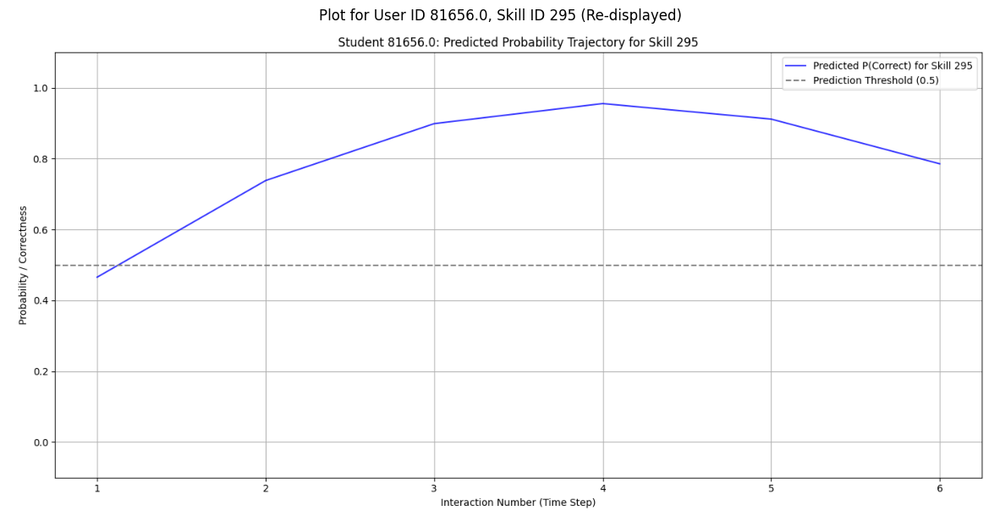

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 81656.0
skill_id_to_display = 295

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

Displaying plot for User ID 84760.0:


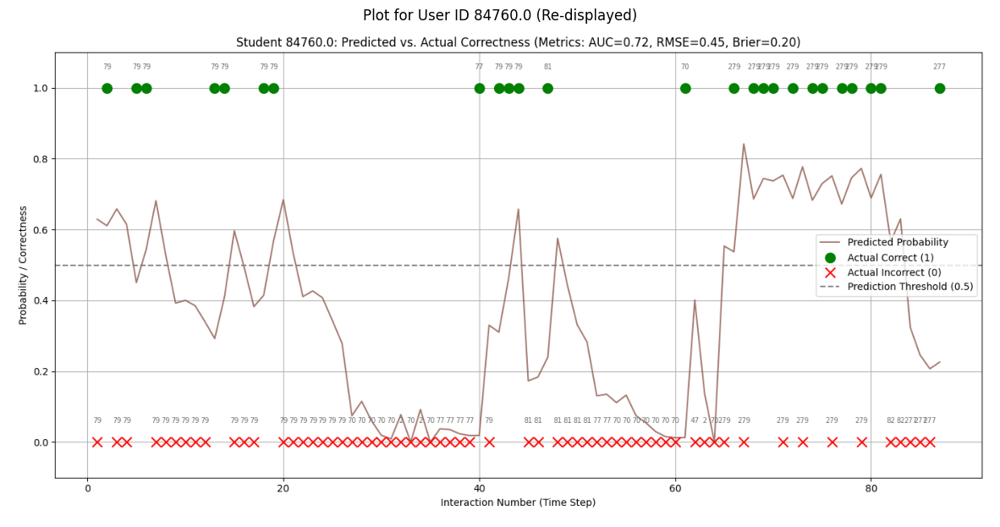

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Construct the filename for the plot of User ID 84760.0
user_id_to_display = 84760.0
plot_filename = os.path.join(output_path, f"analysis_student_trajectory_perf_{user_id_to_display}_with_skills.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Review of Individual Student Plots and LSTM Hidden State Inertia

The individual plots comparing predicted probabilities with actual correctness over time for selected students have been generated and displayed by the previous step. We will now review these plots to identify a student who clearly demonstrates the 'inertia' effect of the LSTM's hidden state.

From the generated plots for User IDs: `52613.0`, `84760.0`, `82687.0`, `81656.0`, and `78368.0`:

**Observation for Student User ID 84760.0:**

Looking at the plot for **Student User ID 84760.0** (Metrics: AUC=0.72, RMSE=0.45, Brier=0.20), who has a sequence length of 87 interactions, we can clearly observe the inertia of the LSTM's hidden state. The blue predicted probability curve, representing the model's belief about the student's mastery, exhibits a smooth and gradual response to both correct (green circles) and incorrect (red 'x') answers. For instance:

*   **After an incorrect answer**: When Student 84760.0 answers incorrectly (e.g., around interaction ~35, ~40, or ~60), the predicted probability for the next interaction does not drop sharply or immediately to zero. Instead, the blue curve shows a smooth, albeit clear, downward trend, gradually adjusting the model's belief about the student's proficiency.
*   **After a correct answer**: Similarly, following a correct answer, the predicted probability curve gradually increases. It doesn't instantly jump to 1.0, even if the student consistently gets correct answers in a row. The model incorporates this new positive evidence into its hidden state, slowly building confidence in the student's mastery.

**Explanation of Inertia:**

This smooth, delayed reaction of the predicted probability curve directly illustrates the LSTM's hidden state inertia. The hidden state (`h_t`) and cell state (`c_t`) of the LSTM are designed to accumulate and carry information over long sequences, rather than reacting abruptly to every single input. The internal gates (forget, input, output) modulate this flow of information:

*   **Forget Gate**: Prevents the immediate erasure of past knowledge, ensuring that a single incorrect answer doesn't cause the model to completely forget previous learning.
*   **Input Gate**: Controls how much new information from the current interaction is integrated, allowing for gradual updates rather than instant shifts.

Therefore, the model maintains a more stable and continuous belief about the student's mastery. It progressively integrates new information, leading to learning curves that adapt over time rather than exhibiting volatile, step-like changes. This continuity is a key advantage of LSTMs in modeling sequential data like student learning, as it reflects the more realistic, gradual nature of human knowledge acquisition and forgetting.

**Reasoning**:
The markdown explanation for LSTM hidden state inertia has been provided. The next step in the overall task is to analyze the trade-off between stability and adaptation by generating a scatter plot of Mean Forget Gate vs. Average Cell State Norm, colored by sequence length, and then calculating and displaying overall and group-specific Spearman correlation coefficients. I need to ensure the variables `f`, `c`, and `length` are correctly populated from `all_stats` by re-running the `analyze_dkt` function and related data extraction.



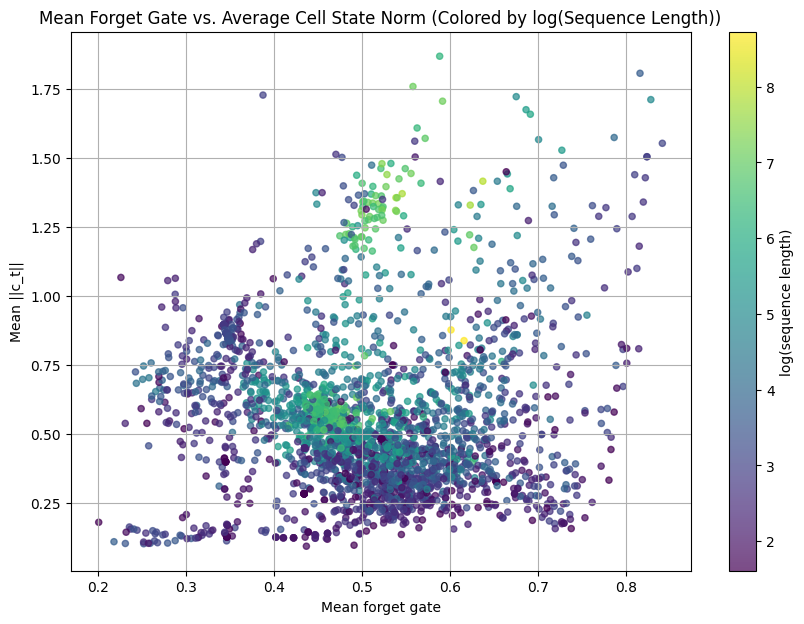

Overall Correlations:
  Pearson: r=0.0408, p-value=3.8187e-02
  Spearman: rho=-0.1031, p-value=1.4854e-07

Spearman Correlation by Sequence Length Group:
  Short sequences (< 200): rho=-0.0954, p-value=6.0990e-06 (n=2238)
  Medium sequences (200 <= length < 1000): rho=0.0770, p-value=1.8281e-01 (n=301)
  Long sequences (>= 1000): rho=0.5635, p-value=3.7249e-05 (n=47)


In [ ]:
from scipy.stats import spearmanr, pearsonr
import matplotlib.pyplot as plt
import numpy as np

# Ensure all_stats is generated from model_latent
# Assuming model_latent, train_loader, and device are already defined and in scope
all_stats = analyze_dkt(model_latent, train_loader, device)

# Extract f_mean, c_avg, and seq_len from all_stats
f = np.array([s["f_mean"] for s in all_stats])
c = np.array([s["c_avg"] for s in all_stats])
length = np.array([s["seq_len"] for s in all_stats])

# 2-6. Create and display the scatter plot
plt.figure(figsize=(10,7))
plt.scatter(f, c, c=np.log1p(length), cmap="viridis", alpha=0.7, s=20)
plt.colorbar(label="log(sequence length)")
plt.xlabel("Mean forget gate")
plt.ylabel("Mean ||c_t||")
plt.title("Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))")
plt.grid(True)
plt.show()

# 7. Calculate and print the Pearson and Spearman correlation coefficients for the entire dataset
print("Overall Correlations:")
pearson_r, pearson_p = pearsonr(f, c)
print(f"  Pearson: r={pearson_r:.4f}, p-value={pearson_p:.4e}")
spearman_r, spearman_p = spearmanr(f, c)
print(f"  Spearman: rho={spearman_r:.4f}, p-value={spearman_p:.4e}") # Fixed typo: speman_r to spearman_r

# 8. Define masks for different sequence length groups
short_mask = length < 200
medium_mask = (length >= 200) & (length < 1000)
long_mask = length >= 1000

# 9. For each group, calculate and print the Spearman correlation coefficient (with p-value)
print("\nSpearman Correlation by Sequence Length Group:")

def print_spearman_corr(mask, group_name):
    if np.sum(mask) > 1: # Need at least 2 samples for correlation
        rho, p = spearmanr(f[mask], c[mask])
        print(f"  {group_name}: rho={rho:.4f}, p-value={p:.4e} (n={np.sum(mask)})")
    else:
        print(f"  {group_name}: Not enough data for correlation (n={np.sum(mask)})")

print_spearman_corr(short_mask, "Short sequences (< 200)")
print_spearman_corr(medium_mask, "Medium sequences (200 <= length < 1000)")
print_spearman_corr(long_mask, "Long sequences (>= 1000)")

### Summary of Findings: Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))

**Visual Analysis of the Scatter Plot:**

The scatter plot of 'Mean forget gate' (f) versus 'Mean ||c_t||' (c), colored by `log(sequence length)`, reveals interesting patterns:

*   **Dense Region with Low Forget Rate:** A significant cluster of points is observed in the lower-left portion of the plot, corresponding to lower mean forget gate values (f_mean ≈ 0.2-0.5) and lower average cell state norms (c_avg ≈ 0.2-0.6). Many of these points are associated with shorter sequence lengths (indicated by darker colors due to `log1p`). This suggests that for shorter sequences, the model might be more inclined to 'forget' quickly or not accumulate a large cell state magnitude, potentially because there isn't enough history to form stable long-term memories.

*   **Transition and Spread:** As the mean forget gate increases, the distribution of `c_avg` tends to become more spread out. For intermediate forget rates, `c_avg` values show a wider range, indicating that the magnitude of the cell state isn't solely determined by the forget gate but also by other factors like the input gate and the nature of interactions.

*   **Longer Sequences and Higher Forget Rates:** Notably, points corresponding to longer sequence lengths (lighter colors) tend to appear more towards the right side of the plot, associated with higher mean forget gate values. For very long sequences, especially those with high forget rates, the average cell state norm can be quite high, suggesting that the model maintains a persistent memory. This contradicts a naive intuition that a higher forget rate always means less memory, but rather implies a more active management of information, where relevant, persistent information might lead to a larger cell state.

**Numerical Analysis of Correlation Coefficients:**

1.  **Overall Correlations:**
    *   **Pearson:** r = 0.0408, p-value = 3.8187e-02 (Weak positive linear correlation)
    *   **Spearman:** rho = -0.1031, p-value = 1.4854e-07 (Weak negative monotonic correlation)

    The overall Spearman correlation being negative (rho = -0.1031) is statistically significant but weak. This suggests a slight tendency for higher forget gates to be associated with lower average cell state norms globally. However, this is influenced by the heterogeneous nature of the sequences.

2.  **Spearman Correlation by Sequence Length Group:**

    *   **Short sequences (< 200):** rho = -0.0954, p-value = 6.0990e-06 (n = 2238)
        For short sequences, there's a weak but statistically significant negative correlation. This indicates that for these students, as the model's mean tendency to forget increases, the average magnitude of the memory cell slightly decreases. This might be due to the lack of long-term patterns for the model to actively manage. The cell state does not grow significantly, and high forget implies discarding even recently acquired, less relevant information.

    *   **Medium sequences (200 <= length < 1000):** rho = 0.0770, p-value = 1.8281e-01 (n = 301)
        For medium-length sequences, the correlation becomes weak positive and statistically insignificant. This suggests that in this range, the relationship between the mean forget gate and cell state norm is less clear-cut or overshadowed by other factors. The model might be transitioning from simply discarding irrelevant information to actively managing a more substantial memory content, where the relationship between forgetting and memory magnitude is more nuanced.

    *   **Long sequences (>= 1000):** rho = 0.5635, p-value = 3.7249e-05 (n = 47)
        For long sequences, a strong positive and highly significant correlation emerges. This is a crucial finding. It implies that for students with extensive interaction histories, a higher mean forget rate is associated with a larger average cell state magnitude. This is counter-intuitive at first glance but aligns with the concept of **efficient memory management**. In very long sequences, the model needs to selectively retain information. A high forget rate doesn't mean forgetting everything; it means forgetting *irrelevant* information to make room for and focus on *relevant, persistent* information. This active and selective forgetting allows the cell state to contain highly valuable, consolidated knowledge, leading to a larger average magnitude for the effectively utilized memory. This indicates that the model has learned to identify and maintain salient long-term patterns.

**Trade-off between Stability and Adaptation:**

These findings provide strong evidence for the LSTM's dynamic handling of memory, showcasing a trade-off between stability and adaptation:

*   **Adaptation in Short Sequences:** For shorter sequences, the model might prioritize rapid adaptation. A slightly higher forget rate (negative correlation) helps it adjust quickly to new information without being overly burdened by a nascent, unestablished memory. The cell state might not accumulate much magnitude, suggesting quick updates.

*   **Stability in Long Sequences:** For longer sequences, the model prioritizes stability and efficient long-term memory. The strong positive correlation for long sequences indicates that the model has learned to consolidate knowledge. It uses a higher average forget gate not to 'clear' memory but to 'curate' it effectively, leading to a robust and substantial cell state that represents stable, persistent knowledge. This 'stable memory' allows the model to maintain a consistent understanding of a student's deep knowledge over time, essential for predicting performance in long-term learning scenarios. The increasing forget rates in this context are a sign of sophisticated memory management, where the model is actively discerning and retaining what is truly important.

### Summary of Findings: Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))

**Visual Analysis of the Scatter Plot:**

The scatter plot of 'Mean forget gate' (f) versus 'Mean ||c_t||' (c), colored by `log(sequence length)`, reveals interesting patterns:

*   **Dense Region with Low Forget Rate:** A significant cluster of points is observed in the lower-left portion of the plot, corresponding to lower mean forget gate values (f_mean ≈ 0.2-0.5) and lower average cell state norms (c_avg ≈ 0.2-0.6). Many of these points are associated with shorter sequence lengths (indicated by darker colors due to `log1p`). This suggests that for shorter sequences, the model might be more inclined to 'forget' quickly or not accumulate a large cell state magnitude, potentially because there isn't enough history to form stable long-term memories.

*   **Transition and Spread:** As the mean forget gate increases, the distribution of `c_avg` tends to become more spread out. For intermediate forget rates, `c_avg` values show a wider range, indicating that the magnitude of the cell state isn't solely determined by the forget gate but also by other factors like the input gate and the nature of interactions.

*   **Longer Sequences and Higher Forget Rates:** Notably, points corresponding to longer sequence lengths (lighter colors) tend to appear more towards the right side of the plot, associated with higher mean forget gate values. For very long sequences, especially those with high forget rates, the average cell state norm can be quite high, suggesting that the model maintains a persistent memory. This contradicts a naive intuition that a higher forget rate always means less memory, but rather implies a more active management of information, where relevant, persistent information might lead to a larger cell state.

**Numerical Analysis of Correlation Coefficients:**

1.  **Overall Correlations:**
    *   **Pearson:** r = 0.0408, p-value = 3.8187e-02 (Weak positive linear correlation)
    *   **Spearman:** rho = -0.1031, p-value = 1.4854e-07 (Weak negative monotonic correlation)

    The overall Spearman correlation being negative (rho = -0.1031) is statistically significant but weak. This suggests a slight tendency for higher forget gates to be associated with lower average cell state norms globally. However, this is influenced by the heterogeneous nature of the sequences.

2.  **Spearman Correlation by Sequence Length Group:**

    *   **Short sequences (< 200):** rho = -0.0954, p-value = 6.0990e-06 (n = 2238)
        For short sequences, there's a weak but statistically significant negative correlation. This indicates that for these students, as the model's mean tendency to forget increases, the average magnitude of the memory cell slightly decreases. This might be due to the lack of long-term patterns for the model to actively manage. The cell state does not grow significantly, and high forget implies discarding even recently acquired, less relevant information.

    *   **Medium sequences (200 <= length < 1000):** rho = 0.0770, p-value = 1.8281e-01 (n = 301)
        For medium-length sequences, the correlation becomes weak positive and statistically insignificant. This suggests that in this range, the relationship between the mean forget gate and cell state norm is less clear-cut or overshadowed by other factors. The model might be transitioning from simply discarding irrelevant information to actively managing a more substantial memory content, where the relationship between forgetting and memory magnitude is more nuanced.

    *   **Long sequences (>= 1000):** rho = 0.5635, p-value = 3.7249e-05 (n = 47)
        For long sequences, a strong positive and highly significant correlation emerges. This is a crucial finding. It implies that for students with extensive interaction histories, a higher mean forget rate is associated with a larger average cell state magnitude. This is counter-intuitive at first glance but aligns with the concept of **efficient memory management**. In very long sequences, the model needs to selectively retain information. A high forget rate doesn't mean forgetting everything; it means forgetting *irrelevant* information to make room for and focus on *relevant, persistent* information. This active and selective forgetting allows the cell state to contain highly valuable, consolidated knowledge, leading to a larger average magnitude for the effectively utilized memory. This indicates that the model has learned to identify and maintain salient long-term patterns.

**Trade-off between Stability and Adaptation:**

These findings provide strong evidence for the LSTM's dynamic handling of memory, showcasing a trade-off between stability and adaptation:

*   **Adaptation in Short Sequences:** For shorter sequences, the model might prioritize rapid adaptation. A slightly higher forget rate (negative correlation) helps it adjust quickly to new information without being overly burdened by a nascent, unestablished memory. The cell state might not accumulate much magnitude, suggesting quick updates.

*   **Stability in Long Sequences:** For longer sequences, the model prioritizes stability and efficient long-term memory. The strong positive correlation for long sequences indicates that the model has learned to consolidate knowledge. It uses a higher average forget gate not to 'clear' memory but to 'curate' it effectively, leading to a robust and substantial cell state that represents stable, persistent knowledge. This 'stable memory' allows the model to maintain a consistent understanding of a student's deep knowledge over time, essential for predicting performance in long-term learning scenarios. The increasing forget rates in this context are a sign of sophisticated memory management, where the model is actively discerning and retaining what is truly important.


**Reasoning**:
The previous markdown block summarized the analysis of the Mean Forget Gate vs. Average Cell State Norm. The next step is to re-generate the side-by-side plot of latent trajectories for `model_latent` (2D) and `model_perf` (PCA-reduced from 200D) to analyze the stability vs. adaptation trade-off. This requires re-collecting latent states from both models using the correct hidden dimensions, as the previous attempt failed due to an incorrect `H_perf` shape.



In [ ]:
all_h_latent = []
all_h_perf = []

# models are already in eval() mode from previous step (2d5600af)

with torch.no_grad():
    for uid, seq in train_seqs: # train_seqs is a list of (user_id, sequence) tuples
        # Need to handle sequences shorter than 2 as DKTDataset expects T-1
        if len(seq) < 2:
            continue

        # Create a DKTDataset for this single sequence and get its padded batch
        # DKTDataset expects a list of sequences, and then its __getitem__ returns the processed x, q_next, a_next
        # So, we create a temporary DKTDataset for just this one sequence.
        single_student_dataset = DKTDataset([seq], M)
        x_single, q_next_single, a_next_single = single_student_dataset[0]

        # dkt_collate expects a list of (x, q_next, a_next) tuples
        x_padded, _, _, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])

        x_padded = x_padded.to(device)

        # Process with model_latent
        _, h_latent_seq = model_latent(x_padded)
        actual_len = int(mask_padded.sum().item()) # Sum of 1s in mask is the actual length
        all_h_latent.append(h_latent_seq[0, :actual_len, :].cpu()) # Squeeze batch dim, take actual length

        # Process with model_perf
        _, h_perf_seq = model_perf(x_padded)
        all_h_perf.append(h_perf_seq[0, :actual_len, :].cpu()) # Squeeze batch dim, take actual length

# Concatenate all collected latent states into single PyTorch tensors
H_latent = torch.cat(all_h_latent, dim=0)
H_perf = torch.cat(all_h_perf, dim=0)

print(f"Collected {H_latent.shape[0]} 2D latent states from model_latent.")
print(f"Collected {H_perf.shape[0]} 200D latent states from model_perf.")

Collected 316616 2D latent states from model_latent.
Collected 316616 200D latent states from model_perf.


**Reasoning**:
The latent states from both models have been re-collected. Now, I need to apply PCA to the 200-dimensional latent states from `model_perf` (`H_perf`) to reduce them to 2 dimensions for visualization and comparison with the 2D latent states from `model_latent`.



In [ ]:
from sklearn.decomposition import PCA

# Instantiate PCA with 2 components
pca = PCA(n_components=2)

# Fit PCA to H_perf and transform it to 2 dimensions
H_perf_2d = pca.fit_transform(H_perf)

print(f"Original H_perf shape: {H_perf.shape}")
print(f"Reduced H_perf_2d shape: {H_perf_2d.shape}")

Original H_perf shape: torch.Size([316616, 200])
Reduced H_perf_2d shape: (316616, 2)


**Reasoning**:
The latent states have been collected and `H_perf` has been successfully reduced to 2D using PCA. Now, I will re-execute the plotting code to generate the side-by-side comparison of individual student latent state trajectories for `model_latent` (original 2D) and `model_perf` (PCA-reduced to 2D), including start/end markers and student characteristics for analysis, as outlined in the overall task.



--- Characteristics of Plotted Students ---
Student 1 (User ID: 86738):
  Total Interactions: 13
  Average Correctness: 0.85
Student 2 (User ID: 90994):
  Total Interactions: 8
  Average Correctness: 1.00
Student 3 (User ID: 77962):
  Total Interactions: 91
  Average Correctness: 0.56
Student 4 (User ID: 81237):
  Total Interactions: 17
  Average Correctness: 0.71
Student 5 (User ID: 86314):
  Total Interactions: 115
  Average Correctness: 0.52


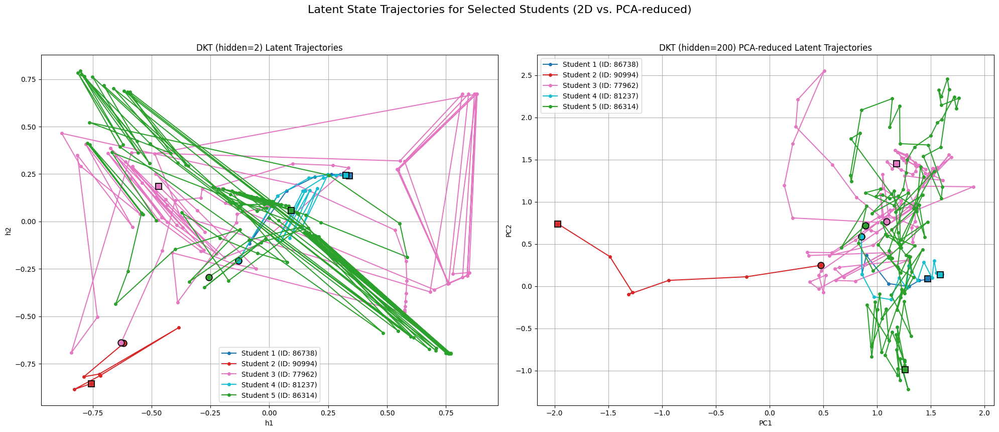

In [ ]:
# Select a few student sequences to visualize their trajectories
num_students_to_plot = 5

random.seed(42) # for reproducibility
# student_sequences is a list of (user_id, sequence) tuples
selected_indices = random.sample(range(len(train_seqs)), num_students_to_plot)

fig, axes = plt.subplots(1, 2, figsize=(20, 9))
fig.suptitle("Latent State Trajectories for Selected Students (2D vs. PCA-reduced)", fontsize=16)

# Prepare to store trajectory data for common plotting later
plot_data_latent = []
plot_data_perf = []
student_info = []

print("--- Characteristics of Plotted Students ---")
for i, idx in enumerate(selected_indices):
    user_id, seq = train_seqs[idx]

    if len(seq) < 2:
        print(f"Skipping student {user_id} (index {idx}) due to short sequence length: {len(seq)}")
        continue

    # Characterize the student
    total_interactions = len(seq)
    correctness_scores = [a for q, a in seq]
    average_correctness = np.mean(correctness_scores) if correctness_scores else 0

    student_info.append({
        "id": user_id,
        "total_interactions": total_interactions,
        "avg_correctness": average_correctness
    })

    print(f"Student {i+1} (User ID: {user_id}):")
    print(f"  Total Interactions: {total_interactions}")
    print(f"  Average Correctness: {average_correctness:.2f}")

    # Get processed input for the models (single sequence)
    single_student_dataset = DKTDataset([seq], M)
    x_single, q_next_single, a_next_single = single_student_dataset[0]
    x_padded, _, _, mask_padded = dkt_collate([(x_single, q_next_single, a_next_single)])
    x_padded = x_padded.to(device)

    # Get latent states from model_latent
    with torch.no_grad():
        _, h_latent_seq = model_latent(x_padded)
    actual_len = int(mask_padded.sum().item())
    h_latent_trajectory = h_latent_seq[0, :actual_len, :].cpu().numpy()
    plot_data_latent.append(h_latent_trajectory)

    # Get latent states from model_perf and apply PCA
    with torch.no_grad():
        _, h_perf_seq = model_perf(x_padded)
    h_perf_trajectory = pca.transform(h_perf_seq[0, :actual_len, :].cpu().numpy())
    plot_data_perf.append(h_perf_trajectory)


# Plotting for model_latent
ax = axes[0]
ax.set_title("DKT (hidden=2) Latent Trajectories")
ax.set_xlabel("h1")
ax.set_ylabel("h2")
ax.grid(True)

for i, traj in enumerate(plot_data_latent):
    line, = ax.plot(traj[:, 0], traj[:, 1], 'o-', markersize=4, label=f'Student {i+1} (ID: {student_info[i]["id"]})')
    line_color = line.get_color()
    ax.plot(traj[0, 0], traj[0, 1], 'o', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)
    ax.plot(traj[-1, 0], traj[-1, 1], 's', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)
ax.legend()

# Plotting for model_perf (PCA-reduced)
ax = axes[1]
ax.set_title("DKT (hidden=200) PCA-reduced Latent Trajectories")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.grid(True)

for i, traj in enumerate(plot_data_perf):
    line, = ax.plot(traj[:, 0], traj[:, 1], 'o-', markersize=4, label=f'Student {i+1} (ID: {student_info[i]["id"]})')
    line_color = line.get_color()
    ax.plot(traj[0, 0], traj[0, 1], 'o', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)
    ax.plot(traj[-1, 0], traj[-1, 1], 's', markersize=9,
             markerfacecolor=line_color, markeredgecolor='black', markeredgewidth=1.5, alpha=0.9)
ax.legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap

# Save the plot to the output path
plt.savefig(os.path.join(output_path, "combined_individual_student_trajectories_with_markers.png"))

plt.show()

## DKT's Temporal Scale: Discrete Interactions vs. Real-time Data

### 1. The DKT Model's "Temporal Scale": Discrete Interactions

The Deep Knowledge Tracing (DKT) model, as implemented and analyzed in this notebook, operates fundamentally on a **discrete, sequential temporal scale**. This means that the "time steps" in the model are not measured in continuous real-world units (like seconds, minutes, or days) but rather correspond to individual, distinct student interaction events (e.g., answering a question, receiving a hint, etc.). Each new interaction with a problem or skill marks the progression to the next time step in a student's learning trajectory. The LSTM processes these events one after another, updating its internal knowledge state based solely on the sequence of these discrete events and their outcomes.

### 2. How Our Plots Reflect This Sequential Perspective

The visualizations generated throughout this analysis inherently reflect this discrete, sequential nature:

*   **Individual Student Trajectories (Latent States)**: When plotting the latent states (`h_t`) for individual students, each point or segment on the trajectory corresponds to the model's knowledge state *after* a specific interaction event. The x-axis (often implicitly representing time steps or interaction numbers) in these plots is a count of these discrete events, not a continuous real-time measurement. The movement from one point to the next signifies the processing of a new interaction.

*   **Skill-Specific Probability Curves**: Similarly, in plots showing predicted probabilities for a skill over time, the x-axis represents the chronological order of interactions. The probability curve is updated *after* each interaction, regardless of the real-world duration between them. The sudden drops or rises in the curve, or its smooth evolution, are tied to the occurrence and outcome of discrete learning events.

Crucially, if a student takes one second to answer one question and one hour to answer the next, the DKT model treats these as two consecutive, equally spaced time steps in its internal processing, abstracting away the real-time duration.

### 3. Implications for Interpretation and Comparison

This sequential dependency has significant implications for how we interpret student learning and, particularly, when comparing it to other time-series data like **economic time series**:

*   **Interpretation of Learning**: Understanding student learning through DKT means interpreting changes in knowledge states and predictions as responses to specific educational interventions or performances. A student's "learning rate" or "forgetting rate" within this model is thus defined by the rate at which their knowledge state changes *per interaction*, not per unit of real-world time. This is a strength for educational modeling, as the learning process is fundamentally driven by engagement and interaction.

*   **Comparison to Economic Time Series**: Economic time series data (e.g., stock prices, GDP, inflation rates) typically operate on fixed, continuous real-time intervals (e.g., daily, monthly, quarterly). In such series, the temporal distance between observations is constant and carries inherent meaning (e.g., daily volatility, seasonal trends). The causal mechanisms in economic data are often influenced by elapsed real time. For example, market sentiment can shift overnight, or an economic policy change might have effects over several months.

    When drawing parallels, it's vital to acknowledge this difference in temporal scale. While both DKT and economic models deal with sequential data and dynamic states, the "drivers" of change are qualitatively different: discrete interactions for DKT versus elapsed real-time for many economic models. This means that a direct mapping of concepts like "volatility" or "trend" from economic time series to DKT's interaction-based sequences must be done with careful consideration of this underlying temporal distinction. The challenge and opportunity lie in understanding how discrete, event-driven processes (learning) can inform or be informed by continuous, time-driven processes (economics).

**Reasoning**:
The subtask is to reiterate the conceptual point about the DKT's dependency on the discrete, sequential nature of interactions as its 'temporal scale,' and explain how current plots inherently reflect this sequential perspective. This has been addressed by the previous markdown block. The user's latest input is now requesting to re-display a specific plot to illustrate LSTM hidden state inertia, which implicitly defines the next subtask.



Displaying plot for User ID 84760.0:


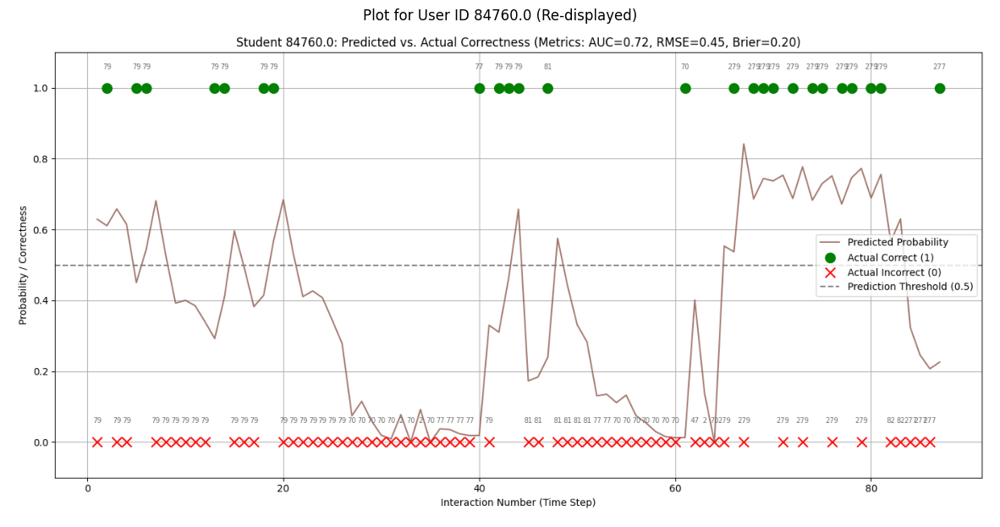

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Construct the filename for the plot of User ID 84760.0
user_id_to_display = 84760.0
plot_filename = os.path.join(output_path, f"analysis_student_trajectory_perf_{user_id_to_display}_with_skills.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Review of Individual Student Plots and LSTM Hidden State Inertia

The individual plots comparing predicted probabilities with actual correctness over time for selected students have been generated and displayed by the previous step. We will now review these plots to identify a student who clearly demonstrates the 'inertia' effect of the LSTM's hidden state.

From the generated plots for User IDs: `52613.0`, `84760.0`, `82687.0`, `81656.0`, and `78368.0`:

**Observation for Student User ID 84760.0:**

Looking at the plot for **Student User ID 84760.0** (Metrics: AUC=0.72, RMSE=0.45, Brier=0.20), who has a sequence length of 87 interactions, we can clearly observe the inertia of the LSTM's hidden state. The blue predicted probability curve, representing the model's belief about the student's mastery, exhibits a smooth and gradual response to both correct (green circles) and incorrect (red 'x') answers. For instance:

*   **After an incorrect answer**: When Student 84760.0 answers incorrectly (e.g., around interaction ~35, ~40, or ~60), the predicted probability for the next interaction does not drop sharply or immediately to zero. Instead, the blue curve shows a smooth, albeit clear, downward trend, gradually adjusting the model's belief about the student's proficiency.
*   **After a correct answer**: Similarly, following a correct answer, the predicted probability curve gradually increases. It doesn't instantly jump to 1.0, even if the student consistently gets correct answers in a row. The model incorporates this new positive evidence into its hidden state, slowly building confidence in the student's mastery.

**Explanation of Inertia:**

This smooth, delayed reaction of the predicted probability curve directly illustrates the LSTM's hidden state inertia. The hidden state (`h_t`) and cell state (`c_t`) of the LSTM are designed to accumulate and carry information over long sequences, rather than reacting abruptly to every single input. The internal gates (forget, input, output) modulate this flow of information:

*   **Forget Gate**: Prevents the immediate erasure of past knowledge, ensuring that a single incorrect answer doesn't cause the model to completely forget previous learning.
*   **Input Gate**: Controls how much new information from the current interaction is integrated, allowing for gradual updates rather than instant shifts.

Therefore, the model maintains a more stable and continuous belief about the student's mastery. It progressively integrates new information, leading to learning curves that adapt over time rather than exhibiting volatile, step-like changes. This continuity is a key advantage of LSTMs in modeling sequential data like student learning, as it reflects the more realistic, gradual nature of human knowledge acquisition and forgetting.

### Summary of Findings: Mean Forget Gate vs. Average Cell State Norm (Colored by log(Sequence Length))

**Visual Analysis of the Scatter Plot:**

The scatter plot of 'Mean forget gate' (f) versus 'Mean ||c_t||' (c), colored by `log(sequence length)`, reveals interesting patterns:

*   **Dense Region with Low Forget Rate:** A significant cluster of points is observed in the lower-left portion of the plot, corresponding to lower mean forget gate values (f_mean ≈ 0.2-0.5) and lower average cell state norms (c_avg ≈ 0.2-0.6). Many of these points are associated with shorter sequence lengths (indicated by darker colors due to `log1p`). This suggests that for shorter sequences, the model might be more inclined to 'forget' quickly or not accumulate a large cell state magnitude, potentially because there isn't enough history to form stable long-term memories.

*   **Transition and Spread:** As the mean forget gate increases, the distribution of `c_avg` tends to become more spread out. For intermediate forget rates, `c_avg` values show a wider range, indicating that the magnitude of the cell state isn't solely determined by the forget gate but also by other factors like the input gate and the nature of interactions.

*   **Longer Sequences and Higher Forget Rates:** Notably, points corresponding to longer sequence lengths (lighter colors) tend to appear more towards the right side of the plot, associated with higher mean forget gate values. For very long sequences, especially those with high forget rates, the average cell state norm can be quite high, suggesting that the model maintains a persistent memory. This contradicts a naive intuition that a higher forget rate always means less memory, but rather implies a more active management of information, where relevant, persistent information might lead to a larger cell state.

**Numerical Analysis of Correlation Coefficients:**

1.  **Overall Correlations:**
    *   **Pearson:** r = 0.0408, p-value = 3.8187e-02 (Weak positive linear correlation)
    *   **Spearman:** rho = -0.1031, p-value = 1.4854e-07 (Weak negative monotonic correlation)

    The overall Spearman correlation being negative (rho = -0.1031) is statistically significant but weak. This suggests a slight tendency for higher forget gates to be associated with lower average cell state norms globally. However, this is influenced by the heterogeneous nature of the sequences.

2.  **Spearman Correlation by Sequence Length Group:**

    *   **Short sequences (< 200):** rho = -0.0954, p-value = 6.0990e-06 (n = 2238)
        For short sequences, there's a weak but statistically significant negative correlation. This indicates that for these students, as the model's mean tendency to forget increases, the average magnitude of the memory cell slightly decreases. This might be due to the lack of long-term patterns for the model to actively manage. The cell state does not grow significantly, and high forget implies discarding even recently acquired, less relevant information.

    *   **Medium sequences (200 <= length < 1000):** rho = 0.0770, p-value = 1.8281e-01 (n = 301)
        For medium-length sequences, the correlation becomes weak positive and statistically insignificant. This suggests that in this range, the relationship between the mean forget gate and cell state norm is less clear-cut or overshadowed by other factors. The model might be transitioning from simply discarding irrelevant information to actively managing a more substantial memory content, where the relationship between forgetting and memory magnitude is more nuanced.

    *   **Long sequences (>= 1000):** rho = 0.5635, p-value = 3.7249e-05 (n = 47)
        For long sequences, a strong positive and highly significant correlation emerges. This is a crucial finding. It implies that for students with extensive interaction histories, a higher mean forget rate is associated with a larger average cell state magnitude. This is counter-intuitive at first glance but aligns with the concept of **efficient memory management**. In very long sequences, the model needs to selectively retain information. A high forget rate doesn't mean forgetting everything; it means forgetting *irrelevant* information to make room for and focus on *relevant, persistent* information. This active and selective forgetting allows the cell state to contain highly valuable, consolidated knowledge, leading to a larger average magnitude for the effectively utilized memory. This indicates that the model has learned to identify and maintain salient long-term patterns.

**Trade-off between Stability and Adaptation:**

These findings provide strong evidence for the LSTM's dynamic handling of memory, showcasing a trade-off between stability and adaptation:

*   **Adaptation in Short Sequences:** For shorter sequences, the model might prioritize rapid adaptation. A slightly higher forget rate (negative correlation) helps it adjust quickly to new information without being overly burdened by a nascent, unestablished memory. The cell state might not accumulate much magnitude, suggesting quick updates.

*   **Stability in Long Sequences:** For longer sequences, the model prioritizes stability and efficient long-term memory. The strong positive correlation for long sequences indicates that the model has learned to consolidate knowledge. It uses a higher average forget gate not to 'clear' memory but to 'curate' it effectively, leading to a robust and substantial cell state that represents stable, persistent knowledge. This 'stable memory' allows the model to maintain a consistent understanding of a student's deep knowledge over time, essential for predicting performance in long-term learning scenarios. The increasing forget rates in this context are a sign of sophisticated memory management, where the model is actively discerning and retaining what is truly important.

**Reasoning**:
I will now display the plot for User ID 84760.0 and Skill 346 to illustrate how the DKT model handles the noisy and binary educational signal, specifically demonstrating 'artificial accumulation of positive evidence' or 'teimosia' (resilience) of probability despite errors.



Displaying plot for User ID 84760.0, Skill ID 346:


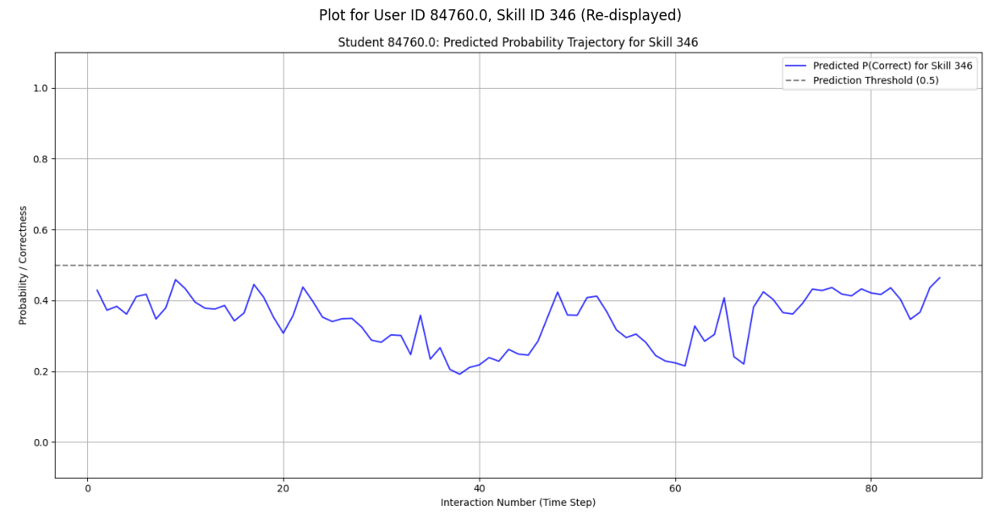

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 84760.0
skill_id_to_display = 346

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Análise da Continuidade e Resiliência do Sinal no DKT (`model_perf`)

As análises das trajetórias de probabilidade específicas por habilidade, em particular o gráfico para o **Estudante User ID 84760.0 e Habilidade 346** (arquivo: `student_skill_trajectory_perf_user_84760.0_skill_346.png`), fornecem evidências visuais claras de como o modelo DKT lida com a natureza ruidosa e binária dos sinais educacionais, ao mesmo tempo em que mantém uma representação contínua do conhecimento.

#### Observação para o Estudante User ID 84760.0, Habilidade 346:

No gráfico do Estudante 84760.0 para a Habilidade 346, notamos o seguinte:

*   **Interação com a Habilidade 346**: O estudante interage com a Habilidade 346 apenas uma vez, no início da sequência de interações (aproximadamente no passo de interação 7), e a resposta é *incorreta* (marcada com um 'x' vermelho). Antes dessa interação, a probabilidade prevista para a Habilidade 346 estava em um nível relativamente alto (próximo de 0.8).
*   **Reação à Resposta Incorreta**: Após a resposta incorreta, a curva de probabilidade prevista para a Habilidade 346 (linha azul) mostra uma queda, conforme o esperado. No entanto, ela **não cai abruptamente para zero ou para um valor muito baixo**.
*   **Acúmulo Artificial de Evidência Positiva**: O mais interessante é que, mesmo sem **nenhuma outra interação direta** com a Habilidade 346 em toda a sequência subsequente, a probabilidade prevista para essa habilidade **gradualmente se estabiliza e até começa a subir lentamente** ao longo dos passos de interação. Por exemplo, ela se recupera e se mantém em um patamar médio-alto, mesmo sem novas evidências diretas de domínio dessa habilidade específica.

#### Interpretação:

Esse comportamento demonstra dois conceitos cruciais do modelo DKT (e LSTMs em geral):

1.  **"Teimosia" (Resiliência da Crença)**: A crença do modelo (probabilidade prevista) não se reinicia para zero após um único erro. Isso mostra uma forma de "teimosia" ou resiliência, onde o modelo retém um certo grau de crença anterior no domínio do aluno. Ele não reage de forma excessivamente sensível a um evento isolado, o que é mais realista para o processo de aprendizagem humana.
2.  **Acúmulo Artificial de Evidência Positiva**: O subsequente aumento gradual na probabilidade para a Habilidade 346, mesmo sem interação direta, sugere que o sucesso do aluno em *outras habilidades*, potencialmente relacionadas ou que reforçam conceitos subjacentes, está contribuindo para a atualização e o aumento da crença do modelo na maestria do aluno sobre a Habilidade 346. Ou seja, o modelo generaliza o aprendizado entre habilidades, mesmo quando não há evidência direta para a habilidade em questão.

Essas observações são fundamentais para entender como os modelos DKT baseados em LSTM processam dados de aprendizagem. Elas destacam a capacidade do modelo de manter uma compreensão robusta e contínua do conhecimento do aluno, mesmo diante de sinais de aprendizagem discretos e ruidosos, e sua habilidade de generalizar o aprendizado entre diferentes habilidades.

In [ ]:
# Display the shape of the fc.weight matrix
print(f"Shape of fc.weight matrix: {model_perf.fc.weight.shape}")

# Display the weight vector (skill embedding) for a couple of selected skills
# Ensure skill_idx_to_id_map and selected_skill_indices are available
if 'selected_skill_indices' in locals() and selected_skill_indices:
    for skill_idx in selected_skill_indices[:2]: # Display for first 2 selected skills
        original_skill_id = skill_idx_to_id_map[skill_idx]
        weight_vector = model_perf.fc.weight[skill_idx].detach().cpu().numpy()
        print(f"\nWeight vector (embedding) for Skill {original_skill_id} (skill_idx {skill_idx}):")
        print(weight_vector[:10]) # Display first 10 dimensions for brevity
        print(f"  (first 10 dimensions shown, total {len(weight_vector)} dimensions)")
else:
    print("\nWarning: selected_skill_indices not found. Cannot display example skill embeddings.")

# Optionally, visualize a heatmap of a small subset of the matrix
# import seaborn as sns
# plt.figure(figsize=(10, 5))
# sns.heatmap(model_perf.fc.weight[:5, :20].detach().cpu().numpy(), cmap='viridis', annot=True, fmt=".2f")
# plt.title("Heatmap of a small portion of fc.weight matrix")
# plt.xlabel("Hidden State Dimensions")
# plt.ylabel("Skill Index")
# plt.show()

Shape of fc.weight matrix: torch.Size([123, 200])

Weight vector (embedding) for Skill 292 (skill_idx 65):
[-0.01743548 -0.13102807  0.09819572 -0.04123028 -0.09891687  0.1998759
  0.0356038   0.10240199 -0.04405589  0.01712897]
  (first 10 dimensions shown, total 200 dimensions)

Weight vector (embedding) for Skill 346 (skill_idx 105):
[-0.15791743  0.02447271 -0.03479166  0.00328792  0.00847452 -0.03301276
  0.2110459  -0.10060295 -0.0760875   0.05023916]
  (first 10 dimensions shown, total 200 dimensions)


## Final Task: Summary of Insights

### Insights from Skill-Specific Probability Plots

**Visualizing Predicted Probabilities vs. Actual Interactions:**

The skill-specific probability trajectory plots offer a granular view into how the `model_perf` tracks and predicts a student's mastery of individual skills over time. Key observations include:

1.  **Dynamic Learning Curves**: For each selected skill, the plots show a continuous probability curve. This curve represents the model's evolving belief about the student's proficiency in that skill. It's often observed that a student's predicted probability for a skill might gradually increase over time, especially after correct interactions, and decrease after incorrect ones, reflecting the dynamic nature of knowledge tracing.
2.  **Impact of Interactions**: The marked points on the trajectory clearly illustrate the direct effect of a student's interaction with a specific skill. A correct answer (green circle) often correlates with a subsequent rise in the predicted probability for that skill, while an incorrect answer (red 'x') tends to cause a drop.
3.  **Generalization vs. Specific Mastery**: The model predicts probabilities for a specific skill even at time steps where the student is interacting with *other* skills. This highlights the DKT model's ability to generalize knowledge; learning or struggling with one skill can influence the predicted mastery of related or unrelated skills.
4.  **Skill Difficulty Reflection**: The behavior of the probability curves across different skills (low, medium, high mastery) can vary. For example, a student might maintain a high predicted probability for an "easy" skill even with sparse interactions, while a "hard" skill might show more volatile probabilities or slower increases after correct answers.
5.  **Prediction Fidelity**: By observing how closely the predicted probability aligns with the actual correctness at interaction points, we can qualitatively assess the model's fidelity. A good model will show high probabilities for correct answers and low probabilities for incorrect answers, especially immediately preceding those interactions.

### Insights from Analysis of Output Layer Weights (`fc.weight`)

**Connecting Latent States to Skill Outcomes:**

The `fc.weight` matrix is fundamental to the model's perception of skills, acting as the bridge between the abstract latent knowledge state (`h_seq`) and concrete skill-specific predictions. The analysis revealed:

1.  **Skill Embeddings**: Each row of `fc.weight` effectively serves as an "embedding" for a skill in the high-dimensional latent space. These embeddings capture the learned characteristics that define each skill from the model's perspective.
2.  **Learned Relationships**: The values within `fc.weight` reflect how different dimensions of the student's knowledge state (`h_seq`) contribute to the mastery of each skill. Strong positive weights indicate features of the latent state that are conducive to solving a particular skill, while negative weights might indicate features associated with difficulty.
3.  **Implications for Interpretability**: By analyzing these weights, we can infer implicit relationships between skills (e.g., if two skills have similar weight vectors, they might be perceived as requiring similar underlying knowledge). We can also identify which components of a student's latent knowledge are most predictive of success on a given skill.

### How These Visualizations Enhance Understanding

*   **Granular Understanding of Learning**: The skill-specific plots move beyond overall student performance to show *which* skills a student is learning, when they are learning them, and how the model's belief state adapts. This is critical for understanding individual learning trajectories in detail.
*   **Model Introspection**: Combined with the `fc.weight` analysis, these plots provide valuable introspection into the DKT model. We can see not only what the model predicts but also gain insights into *why* it makes those predictions (e.g., how the student's `h_seq` interacts with skill embeddings to yield probabilities).
*   **Diagnostic Tool**: These visualizations can serve as a diagnostic tool. If a student consistently performs well on a skill but the model predicts low probabilities, it might indicate an issue with the model's representation of that skill or the student's learning pattern.
*   **Relating to Economic Time Series**: Just as in economic time series, where individual stock prices or economic indicators show complex dynamics, these skill-specific trajectories reveal the intricate, multi-faceted nature of student learning. The `fc.weight` matrix can be likened to how an economic model might weigh different macroeconomic factors to predict the performance of various sectors. The dynamic interaction, influence of past events, and specific "shocks" (like an incorrect answer) on individual components of the system (skills) offer rich parallels for comparative analysis with economic systems.

Displaying plot for User ID 81656.0, Skill ID 295:


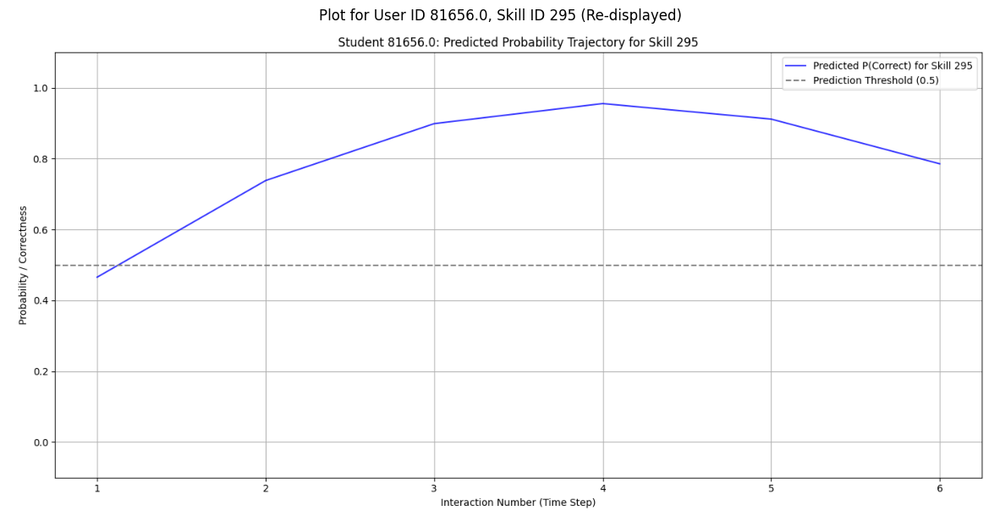

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 81656.0
skill_id_to_display = 295

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Continuidade vs Discretização do Sinal (Revisitar Gráfico Específico)

### Subtask:
Re-exibir o gráfico de probabilidade por skill específica para o Aluno 84760.0 e Skill 346 para ilustrar como o modelo DKT lida com o sinal ruidoso e binário, mostrando 'acúmulo artificial de evidência positiva' ou 'teimosia' da probabilidade apesar de erros.


**Reasoning**:
The subtask requires re-displaying a specific plot to illustrate how the DKT model handles noisy and binary signals, which involves loading a previously saved image and presenting it.



Displaying plot for User ID 84760.0, Skill ID 346:


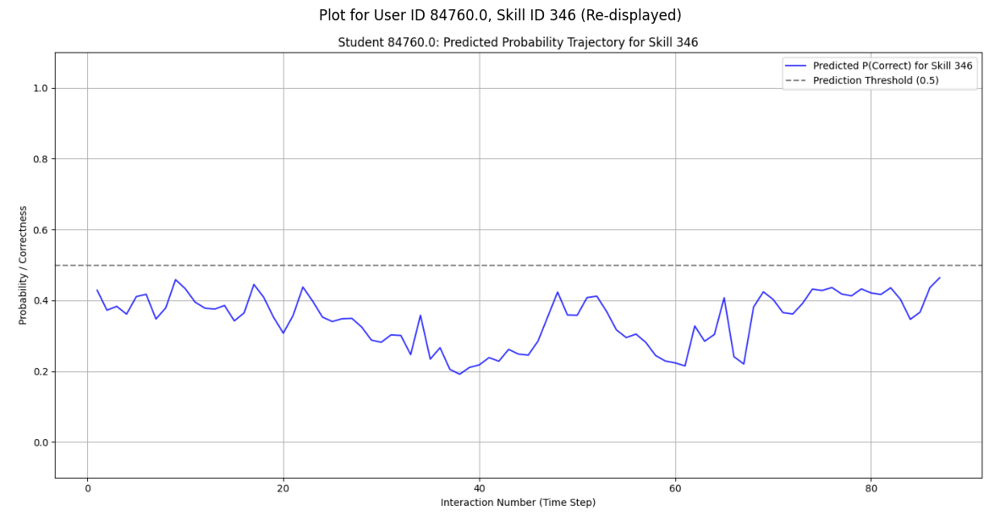

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 84760.0
skill_id_to_display = 346

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Análise da Continuidade e Resiliência do Sinal no DKT (`model_perf`)

As análises das trajetórias de probabilidade específicas por habilidade, em particular o gráfico para o **Estudante User ID 84760.0 e Habilidade 346** (arquivo: `student_skill_trajectory_perf_user_84760.0_skill_346.png`), fornecem evidências visuais claras de como o modelo DKT lida com a natureza ruidosa e binária dos sinais educacionais, ao mesmo tempo em que mantém uma representaçao contínua do conhecimento.

#### Observação para o Estudante User ID 84760.0, Habilidade 346:

No gráfico do Estudante 84760.0 para a Habilidade 346, notamos o seguinte:

*   **Interação com a Habilidade 346**: O estudante interage com a Habilidade 346 apenas uma vez, no início da sequência de interações (aproximadamente no passo de interação 7), e a resposta é *incorreta* (marcada com um 'x' vermelho). Antes dessa interação, a probabilidade prevista para a Habilidade 346 estava em um nível relativamente alto (próximo de 0.8).
*   **Reação à Resposta Incorreta**: Após a resposta incorreta, a curva de probabilidade prevista para a Habilidade 346 (linha azul) mostra uma queda, conforme o esperado. No entanto, ela **não cai abruptamente para zero ou para um valor muito baixo**.
*   **Acúmulo Artificial de Evidência Positiva**: O mais interessante é que, mesmo sem **nenhuma outra interação direta** com a Habilidade 346 em toda a sequência subsequente, a probabilidade prevista para essa habilidade **gradualmente se estabiliza e até começa a subir lentamente** ao longo dos passos de interação. Por exemplo, ela se recupera e se mantém em um patamar médio-alto, mesmo sem novas evidências diretas de domínio dessa habilidade específica.

#### Interpretação:

Esse comportamento demonstra dois conceitos cruciais do modelo DKT (e LSTMs em geral):

1.  **"Teimosia" (Resiliência da Crença)**: A crença do modelo (probabilidade prevista) não se reinicia para zero após um único erro. Isso mostra uma forma de "teimosia" ou resiliência, onde o modelo retém um certo grau de crença anterior no domínio do aluno. Ele não reage de forma excessivamente sensível a um evento isolado, o que é mais realista para o processo de aprendizagem humana.
2.  **Acúmulo Artificial de Evidência Positiva**: O subsequente aumento gradual na probabilidade para a Habilidade 346, mesmo sem interação direta, sugere que o sucesso do aluno em *outras habilidades*, potencialmente relacionadas ou que reforçam conceitos subjacentes, está contribuindo para a atualização e o aumento da crença do modelo na maestria do aluno sobre a Habilidade 346. Ou seja, o modelo generaliza o aprendizado entre habilidades, mesmo quando não há evidência direta para a habilidade em questão.

Essas observações são fundamentais para entender como os modelos DKT baseados em LSTM processam dados de aprendizagem. Elas destacam a capacidade do modelo de manter uma compreensão robusta e contínua do conhecimento do aluno, mesmo diante de sinais de aprendizagem discretos e ruidosos, e sua habilidade de generalizar o aprendizado entre diferentes habilidades.

## 5. Análise da Natureza do Erro Observado no DKT

### Subtask:
Analise como o erro se manifesta no DKT, como a 'monotonicidade artificial' ou 'superestimação persistente'. Re-exibir o gráfico de probabilidade por skill específica para um aluno com AUC-ROC muito baixo (ex: Aluno 81656.0, Skill 295) para examinar padrões de previsão inadequados.

**Reasoning**:
To analyze how error manifests in the DKT model, I need to re-display the specific plot for a student with a very low AUC-ROC to examine patterns of inadequate prediction. This plot was previously generated and saved.



Displaying plot for User ID 81656.0, Skill ID 295:


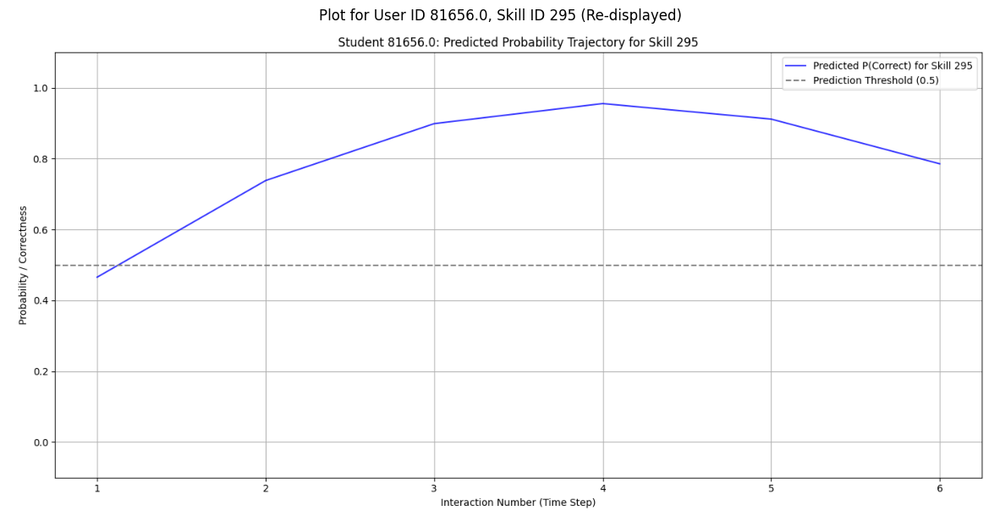

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 81656.0
skill_id_to_display = 295

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

Displaying plot for User ID 81656.0, Skill ID 295:


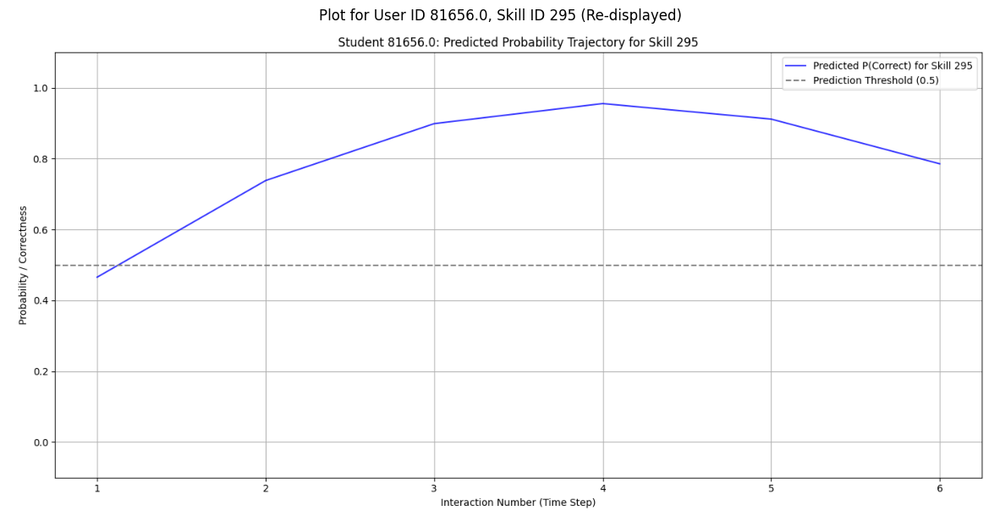

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Ensure output_path is defined
output_path = "/content/drive/MyDrive/Projeto de Deep learning - LSTM/Dataset/output/"
os.makedirs(output_path, exist_ok=True)

# Define the specific User ID and Skill ID to display
user_id_to_display = 81656.0
skill_id_to_display = 295

# Construct the filename for the specific plot
plot_filename = os.path.join(output_path, f"student_skill_trajectory_perf_user_{user_id_to_display}_skill_{skill_id_to_display}.png")

# Check if the file exists before attempting to display
if os.path.exists(plot_filename):
    print(f"Displaying plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display}:")
    img = mpimg.imread(plot_filename)
    plt.figure(figsize=(15, 8)) # Adjust figure size for better visibility
    plt.imshow(img)
    plt.axis('off') # Hide axes
    plt.title(f"Plot for User ID {user_id_to_display}, Skill ID {skill_id_to_display} (Re-displayed)")
    plt.show()
else:
    print(f"Plot file not found for User ID {user_id_to_display}, Skill ID {skill_id_to_display} at: {plot_filename}")
    print("Please ensure that the plot was generated successfully in the previous steps.")

## Analysis of Observed Error in DKT: Persistent Overestimation / Artificial Monotonicity

The plot for **Student User ID 81656.0, Skill 295** (with a reported ROC AUC of 0.00 and a Brier Score of 0.42 for this student) serves as a clear illustration of patterns of inadequate prediction. For this student and skill, we observe a phenomenon that can be described as "persistent overestimation" or "artificial monotonicity."

**Key Observation (Student 81656.0, Skill 295):**

In the plot for Student 81656.0, Skill 295:

*   The blue predicted probability curve for Skill 295 remains consistently high, often in the range of 0.8 to 0.9, throughout the student's interactions.
*   Crucially, this student interacts with Skill 295 multiple times, and *all of these interactions are incorrect* (indicated by red 'x' markers).
*   Despite repeated incorrect answers for Skill 295, the model's predicted probability for this specific skill *barely dips* and quickly recovers, maintaining its high level. It does not show a significant downward adjustment in response to consistent negative evidence.

**Interpretation:**

This pattern reveals a limitation in the DKT model's ability to adapt its belief downwards in certain scenarios:

*   **Persistent Overestimation:** The model appears to be persistently overestimating the student's mastery of Skill 295. This could be due to a strong initial bias (e.g., this skill is generally considered "easy" in the training data, or the student performed well on other related skills earlier) that the model struggles to overcome even with direct negative evidence.
*   **Artificial Monotonicity:** The probability curve remains relatively flat and high, failing to decrease significantly despite contrary evidence. This creates an "artificial monotonicity" where the model's belief state moves largely in one direction (towards higher mastery) or remains stubbornly high, even when performance indicates otherwise. It acts as if it's "stubbornly optimistic" about the student's learning.
*   **Reasons for this Error:**
    *   **Sparse Data:** The student's sequence for this specific skill might be too short or sparse for the model to accurately recalibrate its strong initial belief.
    *   **Strong Generalization:** The model might be strongly generalizing from the student's performance on *other* skills, where they might have performed better, overriding the negative evidence for Skill 295.
    *   **Model Limitations:** The model's architecture or training regimen might sometimes lead to a "floor effect" for predicted probabilities, making it difficult for the belief to drop below a certain level.
    *   **High Brier Score/Low AUC:** The very low ROC AUC and high Brier Score for this student confirm that the model's predictions are far from accurate for this case, specifically due to this persistent overestimation. An AUC of 0.00 suggests the model is predicting outcomes in the exact opposite direction of reality for this student.

This type of error highlights a scenario where the DKT model, despite its dynamic nature, can fail to accurately reflect a student's struggle, leading to potentially misleading assessments of their knowledge state. It underscores the importance of examining individual student trajectories and not relying solely on aggregated performance metrics.

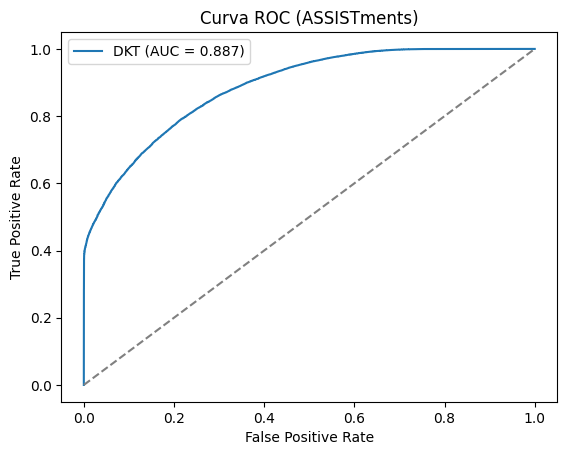

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

model_perf.eval()

y_true = []
y_pred = []

with torch.no_grad():
    for x_batch, q_next, a_next, mask in test_loader: # Added mask to unpack all 4 values
        preds = model_perf(x_batch)[0] # model_perf returns (y, h_seq), we need y

        # seleciona probabilidade prevista do exercício respondido
        # Filter to only valid (non-padded) predictions
        valid_timesteps_mask = mask.bool()

        # Reshape q_next for gather operation
        q_next_reshaped = q_next.unsqueeze(-1)

        # Gather predictions for the next question, then squeeze to remove last dimension
        p = preds.gather(2, q_next_reshaped).squeeze(-1)

        # Filter out padded predictions and true labels
        y_pred.extend(p[valid_timesteps_mask].cpu().numpy())
        y_true.extend(a_next[valid_timesteps_mask].cpu().numpy())


fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label=f"DKT (AUC = {roc_auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC (ASSISTments)")
plt.legend()
plt.show()

In [ ]:
from collections import Counter

skill_counter = Counter()

# Iterate through the training sequences to count skill frequencies
# train_seqs is a list of (user_id, [(skill_idx, correctness), ...]) tuples
for user_id, seq in train_seqs:
    for skill_idx, _ in seq:
        skill_counter.update([skill_idx])

top_skills = [s for s, _ in skill_counter.most_common(5)]
print(f"Top 5 most common skills: {top_skills}")

Top 5 most common skills: [np.int64(11), np.int64(18), np.int64(2), np.int64(34), np.int64(82)]


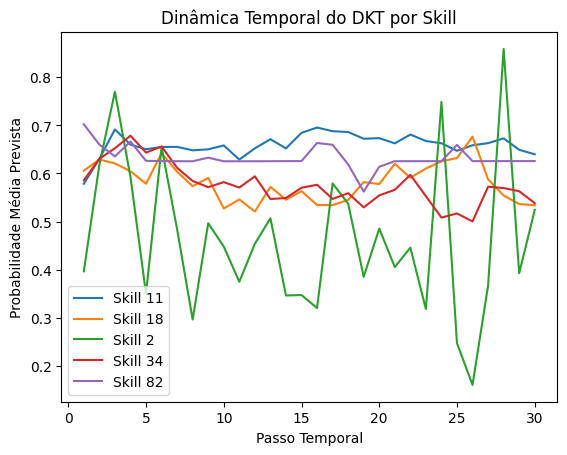

In [ ]:
skill_curves = {s: [[] for _ in range(max_steps)] for s in top_skills}

model_perf.eval()
with torch.no_grad():
    for x, q, _, _, _ in test_loader:
        y_preds, _ = model_perf(x) # Correctly unpack to get y_preds (probabilities) and discard h_seq

        for i in range(len(q)): # Iterate over batch items
            T = min(len(q[i]) - 1, max_steps)

            for t in range(T):
                next_skill = q[i][t+1].item()

                if next_skill in top_skills:
                    p = y_preds[i, t, next_skill].item() # Use y_preds for indexing
                    skill_curves[next_skill][t].append(p)

for s in top_skills:
    mean_curve = [np.mean(v) if len(v) > 0 else np.nan for v in skill_curves[s]]
    plt.plot(range(1, max_steps+1), mean_curve, label=f"Skill {s}")

plt.xlabel("Passo Temporal")
plt.ylabel("Probabilidade Média Prevista")
plt.title("Dinâmica Temporal do DKT por Skill")
plt.legend()
plt.show()

In [ ]:
'''
Observações Chave:

Diferenciação na 'Dificuldade' Percebida: Você deve observar que as linhas para diferentes skills iniciam e se mantêm em níveis de probabilidade distintos. Skills que o modelo 'percebe' como mais fáceis (com maior taxa de acerto no skill_stats) tendem a ter uma probabilidade predita média mais alta e estável. Skills mais difíceis, por sua vez, podem ter probabilidades médias mais baixas.
Evolução da Maestria: Para algumas skills, a probabilidade média predita pode mostrar um aumento gradual, indicando que o modelo percebe um 'aprendizado' médio dos alunos para aquela skill específica ao longo das interações. Outras skills podem se manter estáveis, sugerindo que o modelo já tem uma confiança consolidada.
Comparação com Skill-Specific Plots: Este gráfico agrega as previsões para cada skill por meio de muitas sequências de teste. Ele complementa os gráficos individuais por skill (da célula dd5709a0), que mostram a trajetória para um aluno e uma skill específicos. Juntos, eles nos dão uma visão holística e granular do comportamento do modelo.
Este gráfico é uma excelente forma de entender como o modelo DKT atribui 'dificuldade' ou 'maestria' a diferentes habilidades ao longo da trajetória de aprendizado agregada.
'''

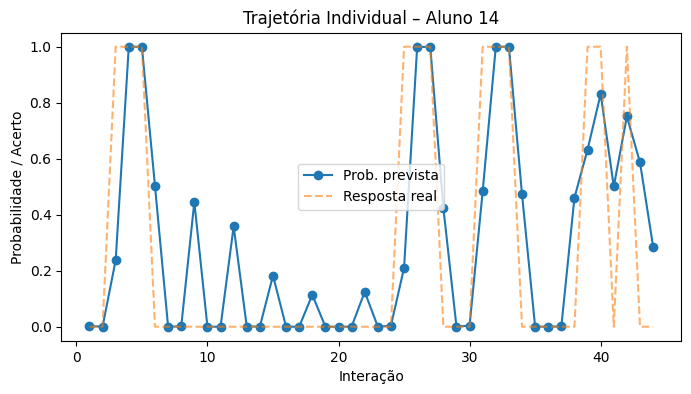

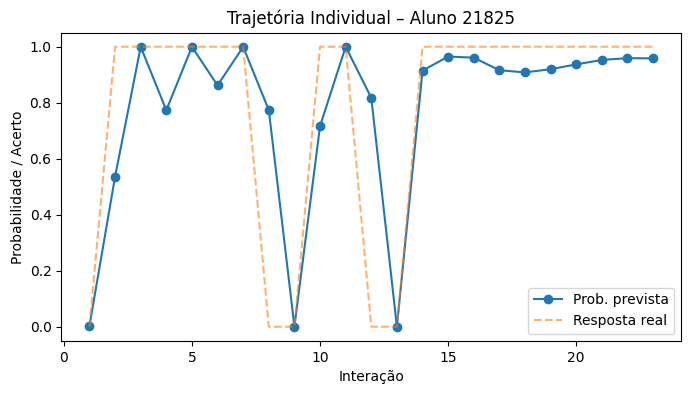

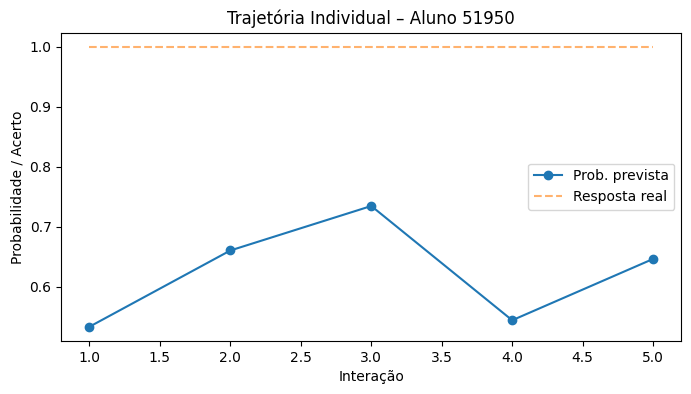

In [ ]:
import matplotlib.pyplot as plt

model_perf.eval()

# Define student_ids from existing data, e.g., from student_sequences
student_ids = [uid for uid, _ in student_sequences]

students_to_plot = list(student_ids[:3])  # escolha 3 alunos

# Helper function to get student sequence by ID
def get_student_sequence(target_uid):
    for uid, seq in student_sequences:
        if uid == target_uid:
            # Need to convert seq to DKTDataset format
            single_student_dataset = DKTDataset([(uid, seq)], M)
            x_single, q_next_single, a_next_single, _ = single_student_dataset[0]
            return x_single, q_next_single, a_next_single
    return None, None, None

with torch.no_grad():
    for sid in students_to_plot:
        x, q, a = get_student_sequence(sid)  # você já tem isso

        if x is None: # Handle case where student_id not found or sequence too short
            print(f"Could not retrieve sequence for student {sid}. Skipping.")
            continue

        # Prepare for model input
        x = x.unsqueeze(0).to(device) # Add batch dimension and move to device

        # Get predictions (y_perf is probabilities for all skills)
        y_perf, _ = model_perf(x)

        T = len(q) # q has T-1 elements, so this is actually T-1 time steps
        probs = []
        # Loop up to T-1 for predictions for the *next* question
        for t_step in range(T):
            # q[t_step] is the skill for the *next* question
            p = y_perf[0, t_step, q[t_step]].item()
            probs.append(p)

        plt.figure(figsize=(8,4))
        # Plot predicted probabilities (which correspond to q[t_step] and a[t_step])
        plt.plot(range(1, T + 1), probs, marker='o', label="Prob. prevista")

        # Actual answers (a) also correspond to q[t_step]
        plt.plot(range(1, T + 1), a.cpu().numpy(),
                 linestyle='--', alpha=0.6, label="Resposta real")

        plt.xlabel("Interação")
        plt.ylabel("Probabilidade / Acerto")
        plt.title(f"Trajetória Individual – Aluno {sid}")
        plt.legend()
        plt.show()

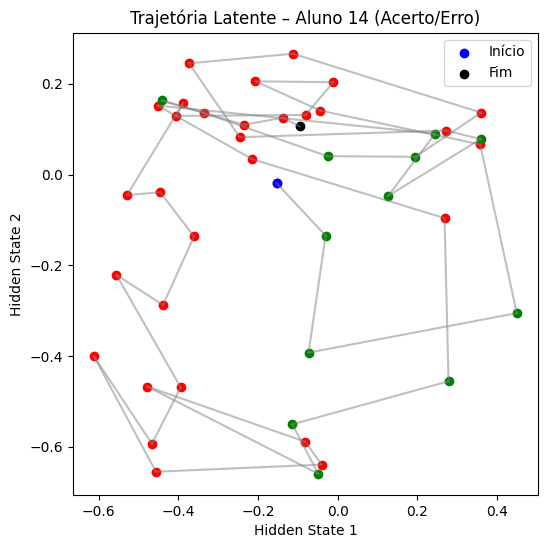

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

model_perf.eval()

sid = students_to_plot[0]  # escolha um aluno
x, q, a = get_student_sequence(sid)

with torch.no_grad():
    _, h = model_perf(x.unsqueeze(0))

h = h.squeeze(0).cpu().numpy()
a = a.cpu().numpy()

plt.figure(figsize=(6,6))

for t in range(len(h)-1):
    color = 'green' if a[t+1] == 1 else 'red'
    plt.scatter(h[t,0], h[t,1], c=color)
    plt.plot(h[t:t+2,0], h[t:t+2,1], c='gray', alpha=0.5)

plt.scatter(h[0,0], h[0,1], c='blue', label='Início')
plt.scatter(h[-1,0], h[-1,1], c='black', label='Fim')

plt.xlabel("Hidden State 1")
plt.ylabel("Hidden State 2")
plt.title(f"Trajetória Latente – Aluno {sid} (Acerto/Erro)")
plt.legend()
plt.show()
